# 导读

优秀的go项目源码：

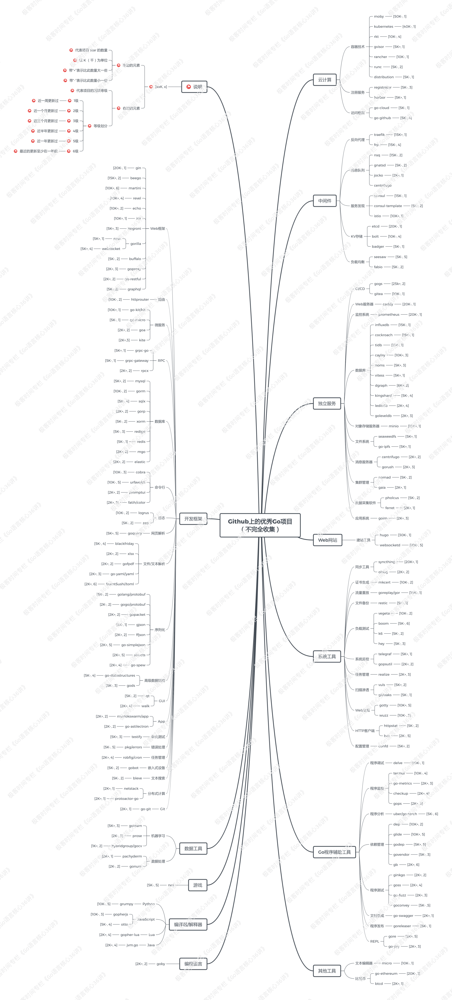

专栏主要模块：

1. 基础概念
2. 数据类型和语句
3. Go程序和测试
4. 标准库的用法
5. Go语言拾遗

# 01 工作区和GOPATH

在安装完go后，我们一般还需要配置三个环境变量：GOROOT，GOPATH，GOBIN。

- GOROOT：Go语言安装根目录的路径，也就是GO语言的安装路径。
- GOPATH：若干工作区目录的路径。是我们自己定义的工作空间。
- GOBIN：GO程序生成的可执行文件（executable file）的路径。

面试题：**你知道设置GOPATH有什么意义吗？**

你可以把GOPATH简单理解成Go语言的工作目录，它的值是一个目录的路径，也可以是多个目录路径，每个目录都代表Go语言的一个工作区（workspace）。

我们需要利用这些工作区，去放置Go语言的源码文件（source file），以及安装（install）后的归档文件（archive file，也就是以“.a”为扩展名的文件）和可执行文件（executable file）。

事实上，由于Go语言项目在其生命周期内的所有操作（编码、依赖管理、构建、测试、安装等）基本上都是围绕着GOPATH和工作区进行的。

这个.a归档文件的主要目的是封装可用代码以供多个程序共享使用，在编译阶段将库代码嵌入可执行文件，避免程序运行时依赖外部动态库（.so文件），适合需要独立部署的场景。

### 构建使用命令`go build`，安装使用命令`go install`。构建和安装代码包的时候都会执行编译、打包等操作，并且，这些操作生成的任何文件都会先被保存到某个临时的目录中。
安装操作会先执行构建，然后还会进行链接操作，并且把结果文件搬运到指定目录。

进一步说，如果安装的是库源码文件，那么结果文件会被搬运到它所在工作区的pkg目录下的某个子目录中。

如果安装的是命令源码文件，那么结果文件会被搬运到它所在工作区的bin目录中，或者环境变量`GOBIN`指向的目录中。

## 思考题：

说到Go程序中的依赖管理，其实还有很多问题值得我们探索。我在这里留下两个问题供你进一步思考。

1. Go语言在多个工作区中查找依赖包的时候是以怎样的顺序进行的？
    1. **当前工作区内的模块**（go.work 文件中列出的本地模块）
    2. **主模块的 vendor 目录**（如果启用了 vendor 模式）
    3. **GOPATH/pkg/mod 缓存**中的模块
    4. **GOPROXY 指定的远程代理**（如未命中缓存）
2. 如果在多个工作区中都存在导入路径相同的代码包会产生冲突吗？
- **不会产生歧义**，因为 Go 采用 "先到先得" 的策略
- 编译器会使用**第一个找到**的包定义
- 这种情况下，后面的同名包实际上会被完全忽略

## 补充阅读：

那么我们怎么确定哪些代码包被编译了呢？有两种方法。

1. 运行`go build`命令时加入标记-`x`，这样可以看到`go build`命令具体都执行了哪些操作。另外也可以加入标记-`n`，这样可以只查看具体操作而不执行它们。
2. 运行`go build`命令时加入标记-`v`，这样可以看到`go build`命令编译的代码包的名称。它在与-`a`标记搭配使用时很有用。

## 关于go get：

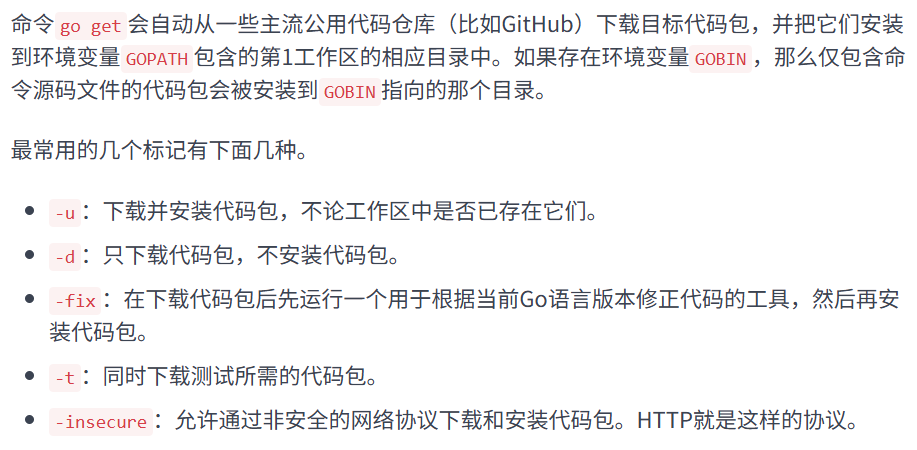

# 02命令源码文件

源码：命令源码文件，库源码文件，测试源码文件。他们有不同的用途和编写规则。

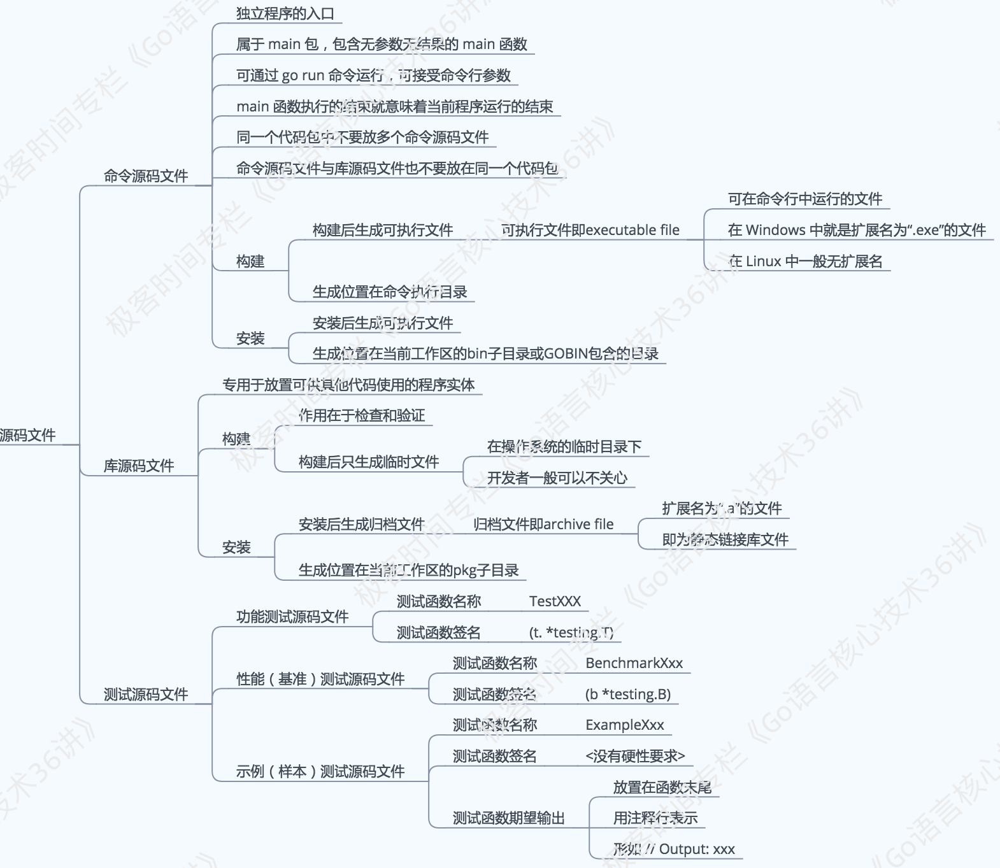

通俗的理解命令源码文件就是我们写的可以直接被我们执行的文件，用go run命令直接启动。

### 命令源码文件是程序的运行入口，是每个可独立运行的程序必须拥有的。我们可以通过构建或安装，生成与其对应的可执行文件，后者一般会与该命令源码文件的直接父目录同名。

![image 1.png](<attachment:image 1.png>)

## 知识精讲：

![image 2.png](<attachment:image 2.png>)

标准库中有flag这个包可以用于接收和解析命令参数。

![image 3.png](<attachment:image 3.png>)

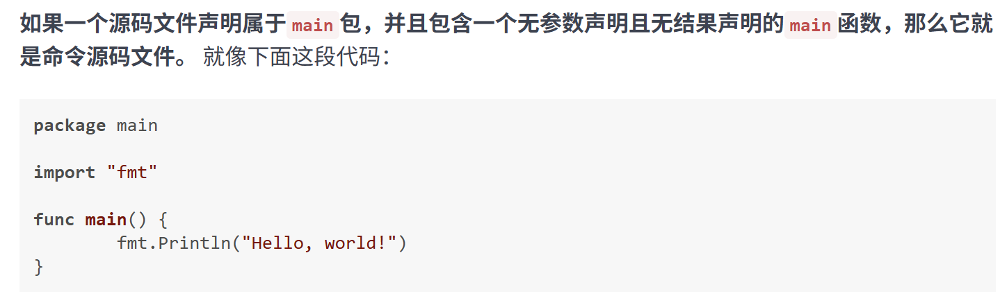

`flag.CommandLine`相当于默认情况下的命令参数容器。

实际上 flag.Usage = flag.CommandLine.Usage

关于flag包的更多介绍在[https://golang.google.cn/pkg/flag/](https://golang.google.cn/pkg/flag/)文档中。
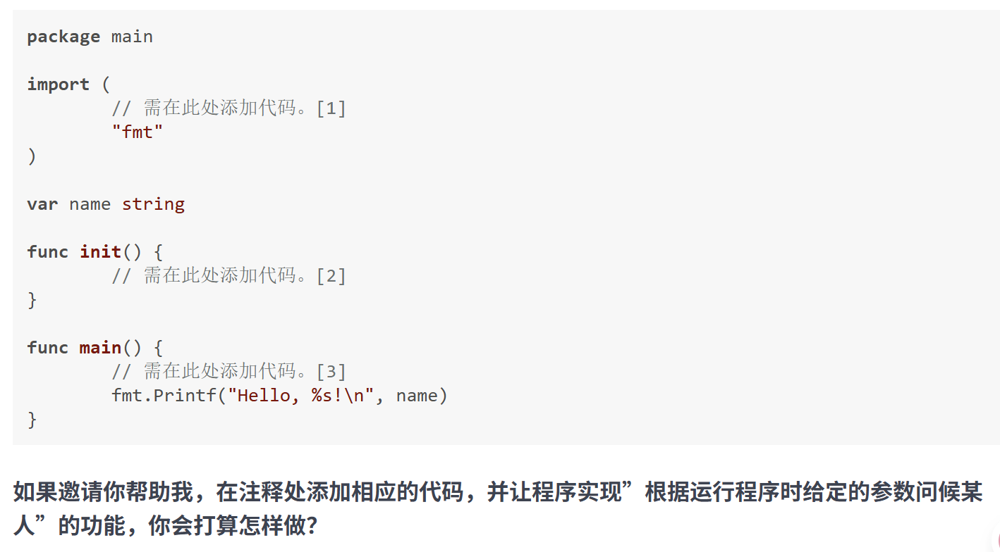
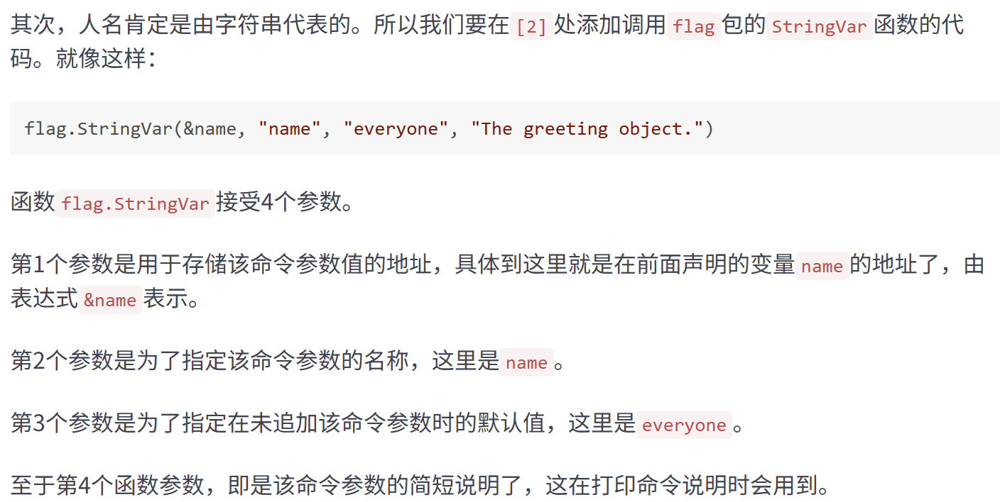
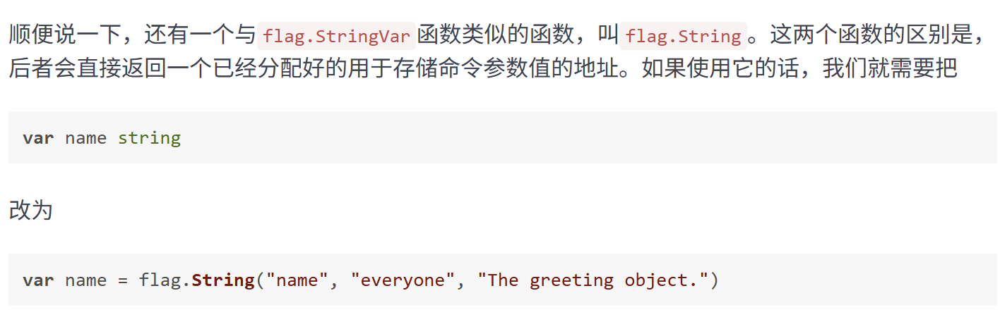

# 03 库源码文件

**库源码文件是不能被直接运行的源码文件，它仅用于存放程序实体，这些程序实体可以被其他代码使用（只要遵从Go语言规范的话）。**

在go语言中库源码文件可以认为是python中的库。

在Go语言中，程序实体是变量、常量、函数、结构体和接口的统称。

### 本节的问题是：怎样把命令源码文件中的代码拆分到其他的库源码文件中？

规则：

1. 注意同一目录下的源码文件要被声明为属于同一个代码包，所以要声明package main
2. 源码文件声明的代码包的名称可以与其所在的目录的名称不同。

## 核心：

1.如何把命令源码文件中的代码拆分到其他代码包？

![image 1.png](<attachment:image 1.png>)

2.代码包的导入路径总会与其所在的目录的相对路径一致吗？

![image 2.png](<attachment:image 2.png>)

![image 3.png](<attachment:image 3.png>)

为了不让使用代码包的人产生困惑，我们应该让声明的包名与其父目录的名称一致

3.什么程序实体才可以被当前包外的代码引用？
名称的首字母为大写的程序实体才可以被当前包外的代码引用，否则只能包内。go语言通过名称将程序实体的访问权限分为包级的私有的和公开的。

![image 4.png](<attachment:image 4.png>)

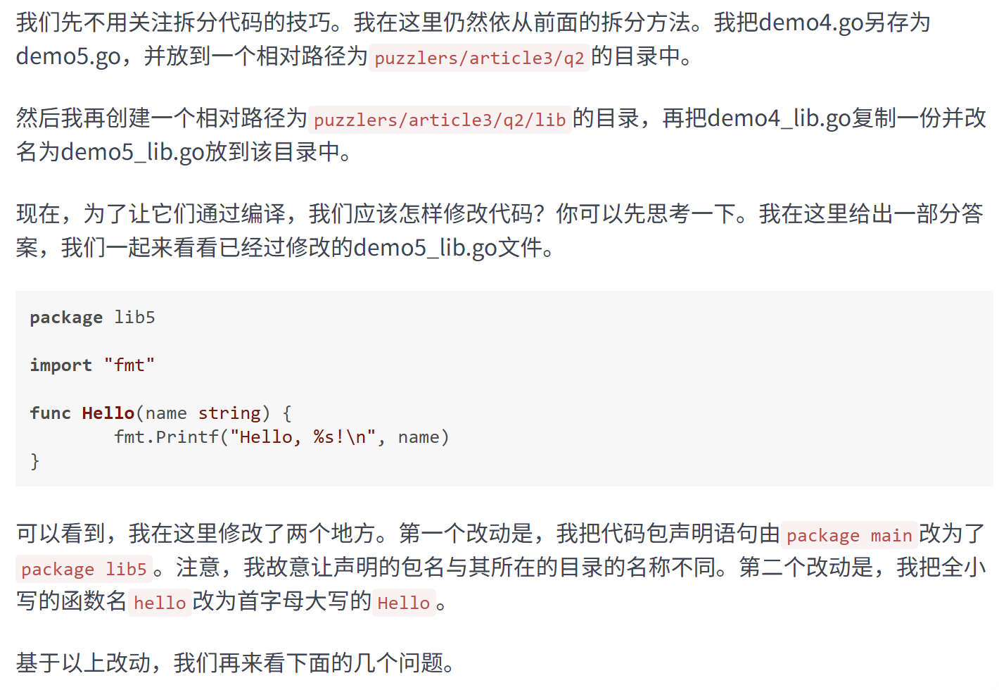

解决办法

```go
import(
libflag "dep/lib/flag"
"flag"
```
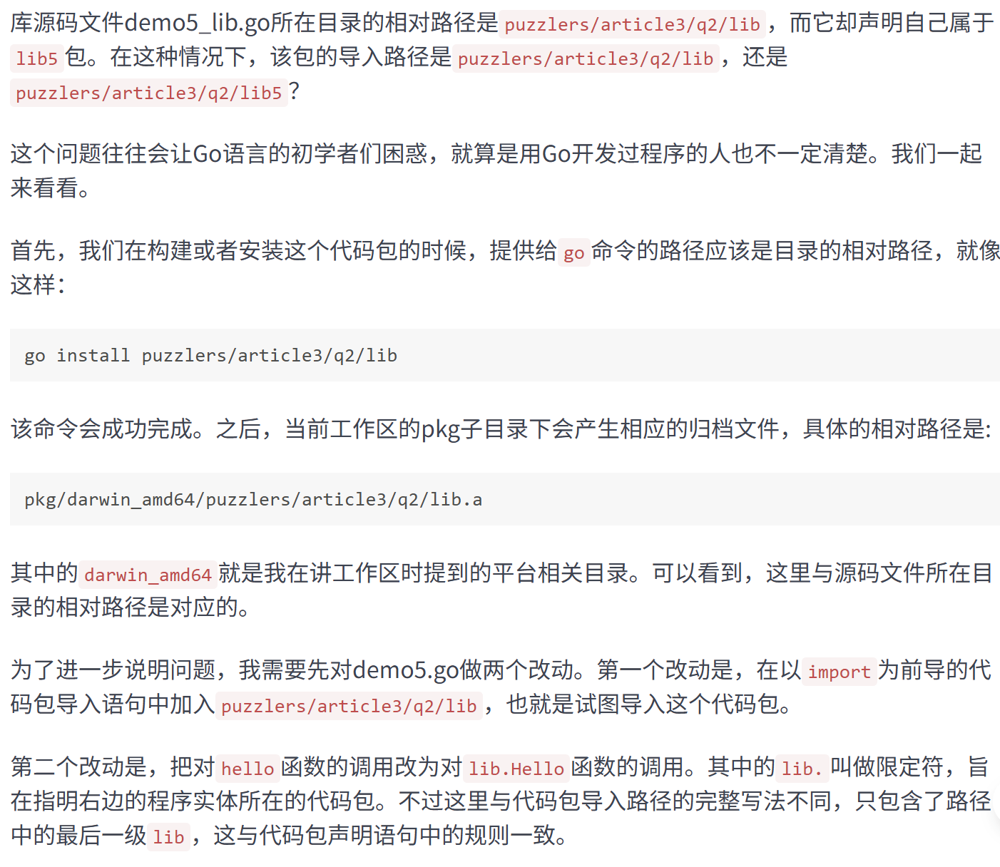
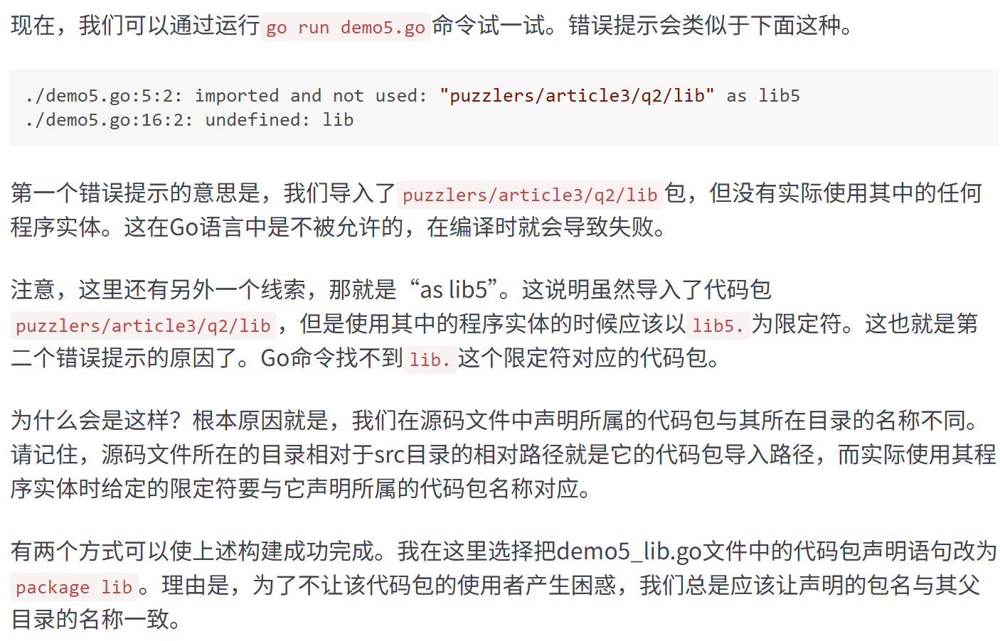
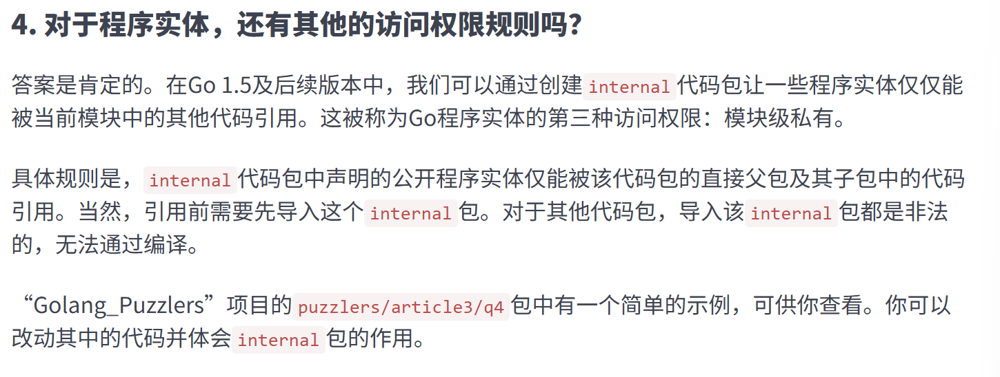
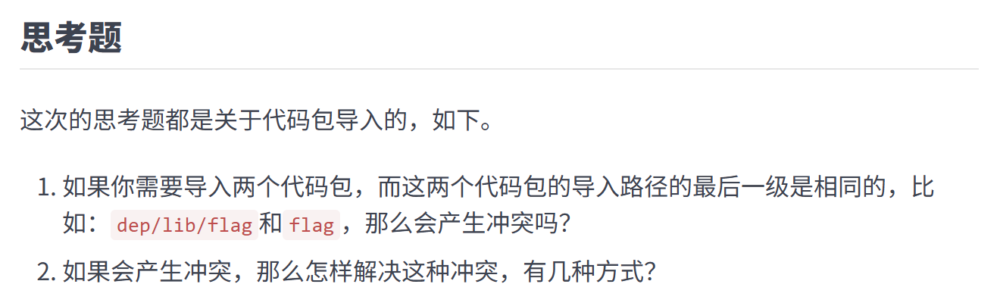

# 04程序实体的那些事儿-上

**Go语言中的程序实体包括变量、常量、函数、结构体和接口。** Go语言是静态类型的编程语言，所以我们在声明变量或常量的时候，都需要指定它们的类型，或者给予足够的信息，这样才可以让Go语言能够推导出它们的类型。

![image 1.png](<attachment:image 1.png>)

第一种方式: 

```go
var name = flag.string("name","everyone","The greeting object")
```

此处的name代表的是一个指向字符串的指针，那么*name就是代表了所指向的内容。

第二种方式

```go
name：=flag.string("name","everyone","The greeting object")
```

区别很小只是把var去掉然后等于号前面加上了：。

## 问题解析：

注意第二种方式用的短变量声明只能在函数体内部中使用，比如if,for或switch。

## 知识扩展：

1.go的类型推断可以带来哪些好处？

我们不显式地指定变量`name`的类型，使得它可以被赋予任何类型的值。也就是说，变量`name`的类型可以在其初始化时，由其他程序动态地确定。 ———类型推断可以明显提升程序的灵活性，因为Go语言是静态类型的，所以一旦在初始化变量时就确定了他的类型，之后就不会改变。这可以避免后面维护程序的一些问题，而且这种类型的确定是在编译时完成的不会对程序运行效率产生影响。

简短回答：Go语言的类型推断可以明显提升程序的灵活性，使得代码重构变得更加容易，同时又不会给代码的维护带来额外负担（实际上，它恰恰可以避免散弹式的代码修改），更不会损失程序的运行效率。

2.变量的重声明是什么意思？
使用短变量声明，我们可以对同一个代码块中的变量进行重声明。

代码块解释：

接下来，每个源码文件也都是一个代码块，每个函数也是一个代码块，每个`if`语句、`for`语句、`switch`语句和`select`语句都是一个代码块。甚至，`switch`或`select`语句中的`case`子句也都是独立的代码块。

走个极端，我就在`main`函数中写一对紧挨着的花括号算不算一个代码块？当然也算，这甚至还有个名词，叫“空代码块”。

变量重声明前提条件：

1. 由于变量的类型在其初始化时就已经确定了，所以对它再次声明时赋予的类型必须与其原本的类型相同，否则会产生编译错误。
2. 变量的重声明只可能发生在某一个代码块中。如果与当前的变量重名的是外层代码块中的变量，那么就是另外一种含义了，我在下一篇文章中会讲到。即只能在一个代码块中。
3. 变量的重声明只有在使用短变量声明时才会发生，否则也无法通过编译。如果要在此处声明全新的变量，那么就应该使用包含关键字`var`的声明语句，但是这时就不能与同一个代码块中的任何变量有重名了。
4. 被“声明并赋值”的变量必须是多个，并且其中至少有一个是新的变量。这时我们才可以说对其中的旧变量进行了重声明。

关于4的例子：

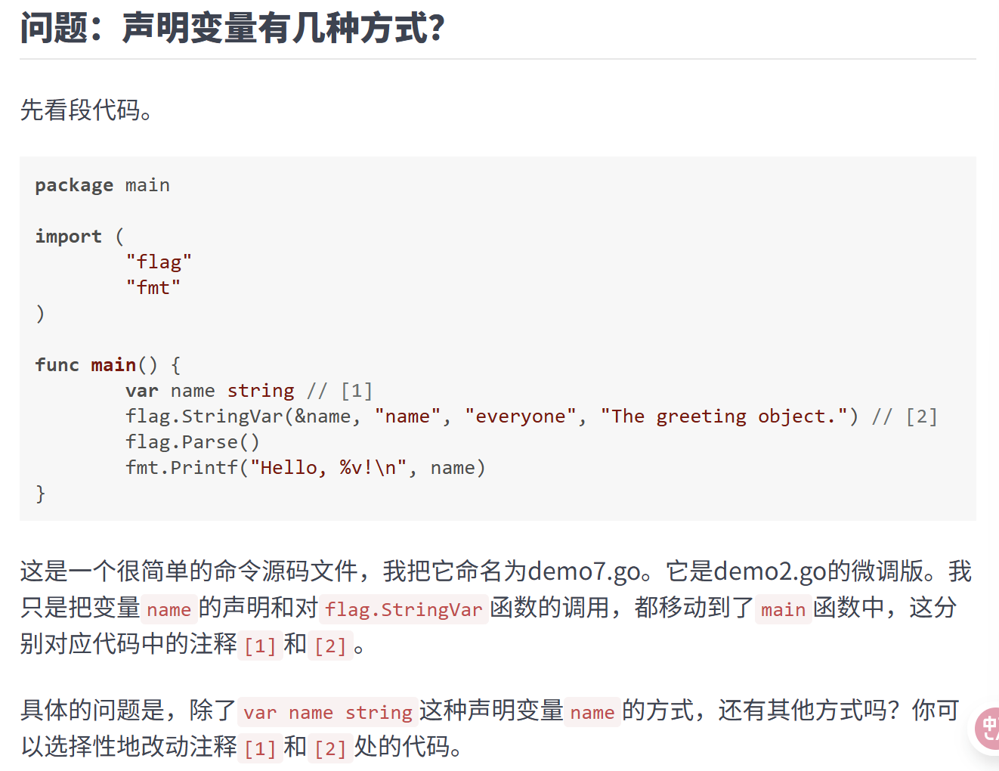

本次的思考题只有一个：如果与当前的变量重名的是外层代码块中的变量，那么这意味着什么？

：

1. **内层变量优先可见**：在内层代码块中，同名的内层变量会遮蔽外层变量，所有对该变量名的引用都会指向内层变量，而非外层。
2. **必须显式声明**：Go 不允许在同一作用域内声明同名变量，但允许在嵌套作用域中声明 —— 内层变量必须通过 `var` 关键字或短变量声明 `:=` 显式创建，且类型可以与外层不同。
3. **作用域严格隔离**：内层变量的生命周期仅限于内层代码块，离开内层后，变量名会自动指向外层变量。
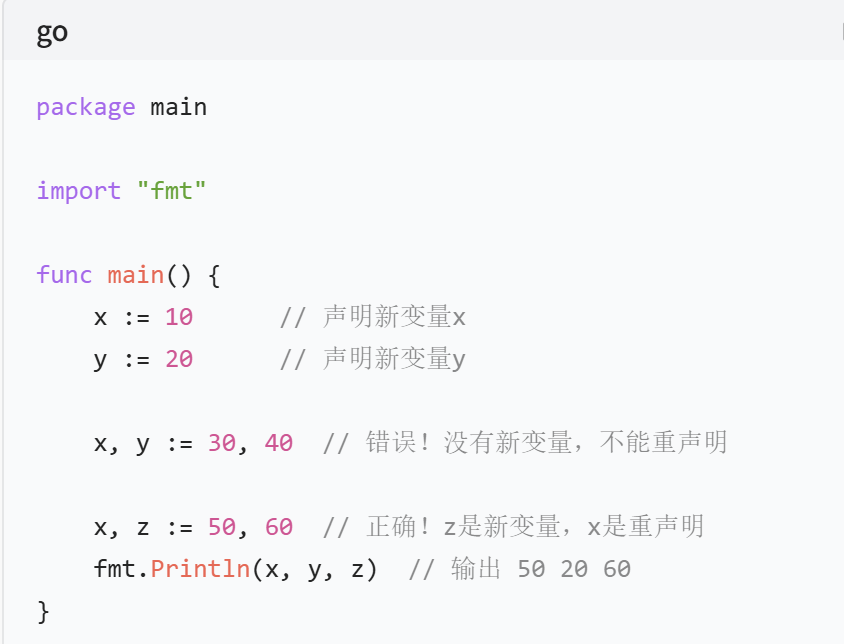

# 05 程序实体的那些事儿（中）

GO语言的代码块是一层套一层，像大圆套小圆。

对于每个代码块最多只能有一个直接包含它的代码块，即直接父亲。

代码块的划分也间接决定了程序实体的作用域。

程序实体的访问权限有三种：包级私有的、模块级私有的和公开的。

程序设计思想：高内聚，低耦合。

对于不同代码块来说，其中的变量重名无所谓，一样可以通过编译，即使这些代码块有直接的嵌套关系。

引用变量时到底找的是哪个？

- 首先，代码引用变量的时候总会最优先查找当前代码块中的那个变量。注意，这里的“当前代码块”仅仅是引用变量的代码所在的那个代码块，并不包含任何子代码块。
- 其次，如果当前代码块中没有声明以此为名的变量，那么程序会沿着代码块的嵌套关系，从直接包含当前代码块的那个代码块开始，一层一层地查找。
- 一般情况下，程序会一直查到当前代码包代表的代码块。如果仍然找不到，那么Go语言的编译器就会报错了。

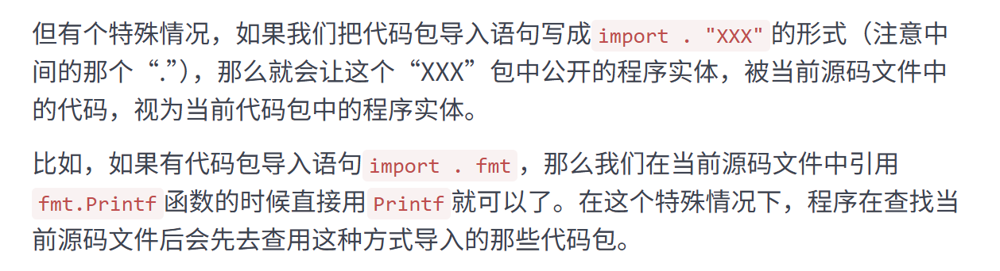

变量屏蔽现象—子模块盖住父模块。

我们在讨论Go语言查找标识符时的范围的时候，提到过`import . XXX`这种导入代码包的方式。这里有个思考题：

如果通过这种方式导入的代码包中的变量与当前代码包中的变量重名了，那么Go语言是会把它们当做“可重名变量”看待还是会报错呢？

1. **点导入的本质：标识符作用域的 “合并”**正常情况下（非点导入），被导入包的标识符需要通过 “包名。标识符” 的方式访问（如 `mypkg.Name`），此时被导入包的标识符与当前包的标识符处于**不同作用域**（被导入包的作用域和当前包的作用域是分离的）。
    
    而 `import . "包路径"` 的特殊之处在于：它会**省略包名前缀**，将被导入包中导出的标识符（首字母大写）“注入” 到当前包的**顶层作用域**（与当前包的全局变量、函数处于同一作用域）。
    
2. **同一作用域内不允许重名标识符**Go 语言规定：**在同一个代码块（作用域）中，标识符必须唯一**，不允许重复声明。这里的 “顶层作用域” 属于当前包的最外层代码块（可以理解为 `package` 声明所在的代码块），当前包的全局变量和点导入的标识符都属于这个代码块。
    
    因此，当被导入包的变量与当前包的变量重名时，两者会处于**同一个顶层代码块**，违反 “同一作用域标识符唯一” 的规则，导致编译错误。
    
3. **与变量遮蔽的区别**注意这种情况与 “变量遮蔽” 不同：
    - 变量遮蔽的前提是**标识符处于嵌套的不同作用域**（如内层代码块与外层代码块），此时内层标识符会遮蔽外层标识符，不会报错。
    - 而点导入导致的重名是**同一作用域内的冲突**（无嵌套关系），Go 语言不允许这种情况，直接编译报错。

注意这里的编译错误的核心问题是 变量重名出现在了同一作用域。

以下是个例子：

```go
// mypkg/mypkg.go
package mypkg

var Name = "from mypkg" // 被导入包中的变量

// main.go
package main

import . "./mypkg" // 点导入方式
import "fmt"

var Name = "from main" // 当前包中的同名变量

func main() {
    fmt.Println(Name) // 尝试访问Name
}
```

# 06 程序实体的那些事儿（下）

如何检查变量的类型，本节主要关于这个。

怎么判断一个变量的类型？

经典答案：使用“类型断言”表达式

```go
value,ok := interface{}(container).([]string)
```

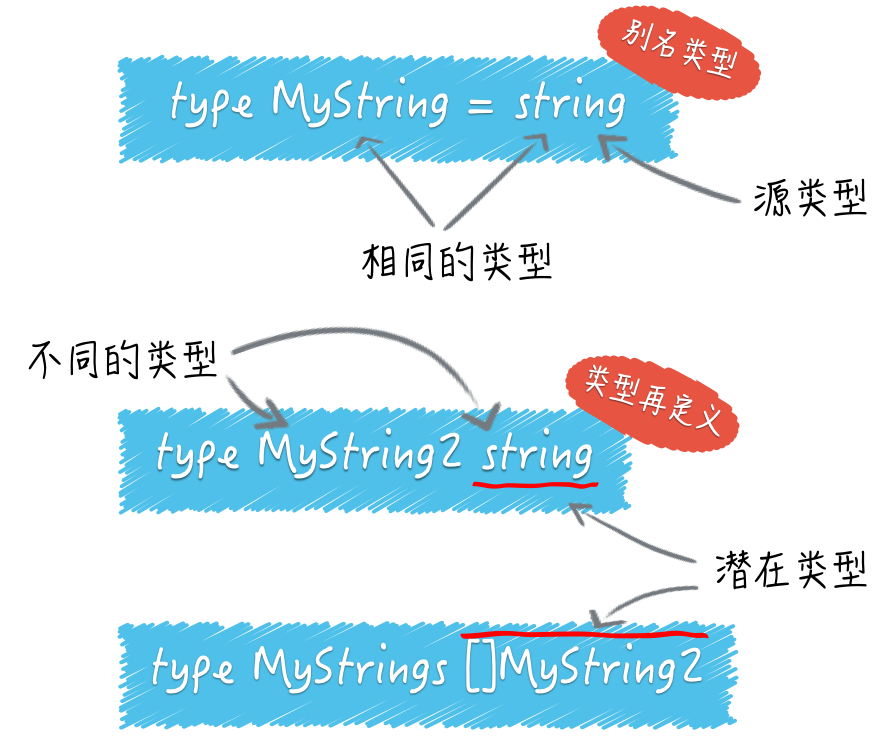

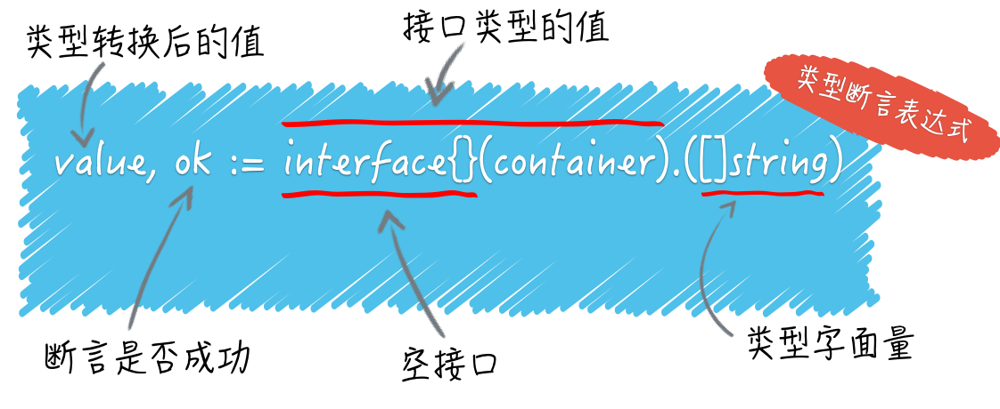

如果ok是ture的话那么就会把对应[]string的值赋给value。

正式的说明：类型断言表达式的语法形式是x.(T).其中x表示要被推断的类型值，这个值当下的类型必须是接口类型的，不过具体是哪个接口类型是无所谓的。 所以注意此时这里的container变量类型不是任何接口类型时我们就要把他转成某个接口类型的值。

![image 1.png](<attachment:image 1.png>)

一对不包裹任何东西的花括号，除了代表空的代码块外，还可以表示不包含任何内容的数据结构。

![image 2.png](<attachment:image 2.png>)

圆括号中`[]string`是一个类型字面量。所谓类型字面量，就是用来表示数据类型本身的若干个字符。比如，`string`是表示字符串类型的字面量，`uint8`是表示8位无符号整数类型的字面量。

再复杂一些的就是我们刚才提到的`[]string`，用来表示元素类型为`string`的切片类型，以及`map[int]string`，用来表示键类型为`int`、值类型为`string`的字典类型。

还有更复杂的结构体类型字面量、接口类型字面量，等等。

类型转换表达式：T(X)。`x`可以被叫做源值，它的类型就是源类型，而那个`T`代表的类型就是目标类型。

**首先，对于整数类型值、整数常量之间的类型转换，原则上只要源值在目标类型的可表示范围内就是合法的。**

一定要记住，当整数值的类型的有效范围由宽变窄时，只需在补码形式下截掉一定数量的高位二进制数即可。

类似的快刀斩乱麻规则还有：当把一个浮点数类型的值转换为整数类型值时，前者的小数部分会被全部截掉。

**第二，虽然直接把一个整数值转换为一个`string`类型的值是可行的，但值得关注的是，被转换的整数值应该可以代表一个有效的Unicode代码点，否则转换的结果将会是`"�"`（仅由高亮的问号组成的字符串值）。**

![image 3.png](<attachment:image 3.png>)

**第三个知识点是关于`string`类型与各种切片类型之间的互转的。**

![image 4.png](<attachment:image 4.png>)

**问题2. 什么是别名类型？什么是潜在类型？**

```go
type Mystring = string
```

这条声明语句表明，MyString是string类型的别名类型。别名类型和其源类型的区别只在名称上。

Go语言内建的基本类型中就存在两个别名类型。`byte`是`uint8`的别名类型，而`rune`是`int32`的别名类型。
一定要注意：

```go
type MyString2 string // 注意，这里没有等号。
```

此时MyString2和string就是两个不同的类型了。这里的MyString2是一个新的类型。这种方式也被叫做对类型的再定义，此处将string类型定义成了另外一个类型Mystring2.

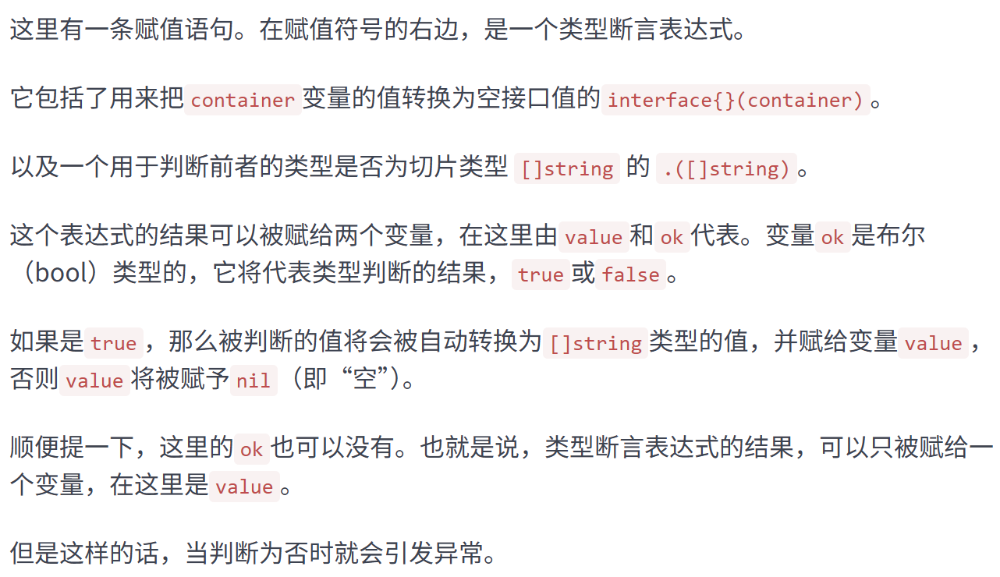

对于这里的类型再定义来说，`string`可以被称为`MyString2`的潜在类型。潜在类型的含义是，某个类型在本质上是哪个类型。

潜在类型相同的不同类型的值之间是可以进行类型转换的。因此，`MyString2`类型的值与`string`类型的值可以使用类型转换表达式进行互转。

本篇文章的思考题有两个。

1. 除了上述提及的那些，你还认为类型转换规则中有哪些值得注意的地方？
    
    go语言中转换都是要显示转换，而且还要注意数值类型转换的精度与范围问题。
    
    bool类型不可以转换，接口类型之间的转换需要遵循接口的实现规则。
    
2. 你能具体说说别名类型在代码重构过程中可以起到哪些作用吗？
    
    逐步替换类型，临时扩展类型方法，这样可以不影响原类型再其他地方的使用。可以明确代码语义。比如type UserID = string 这样就更加清晰一点。
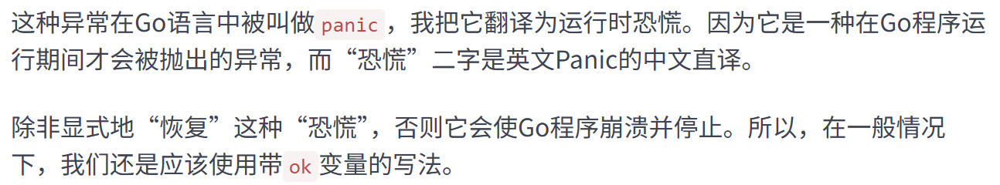
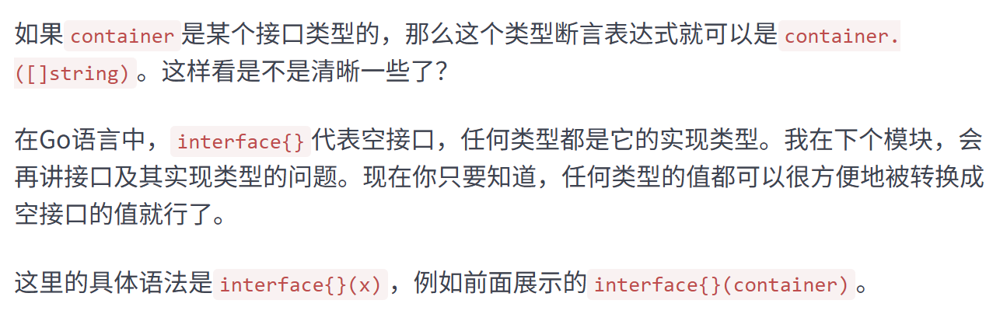
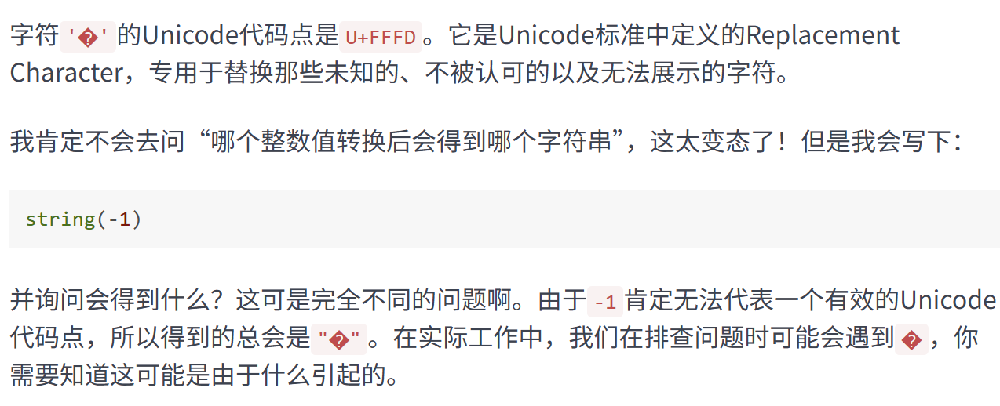
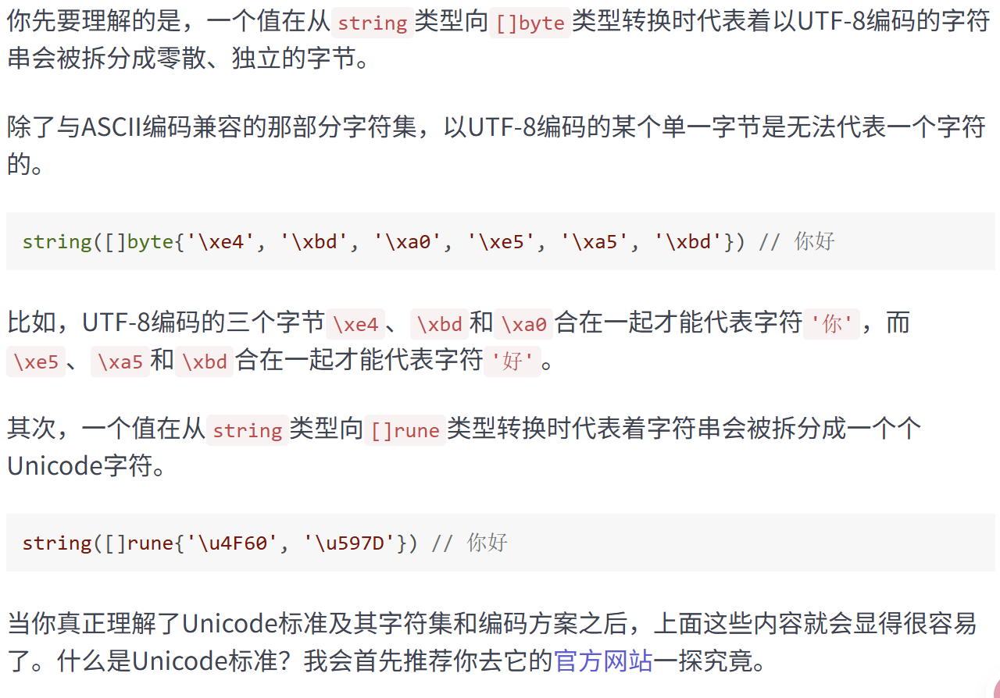

# 07数组和切片

数组和切片都属于集合类的类型且他们的值都可以用来存储某一类型的值，或者说存储元素。

数组的长度在声明它的时候就必须给定，并且之后不会再改变。可以说，数组的长度是其类型的一部分。比如，`[1]string`和`[2]string`就是两个不同的数组类型。

而切片的类型字面量中只有元素的类型，而没有长度。切片的长度可以自动地随着其中元素数量的增长而增长，但不会随着元素数量的减少而减小。

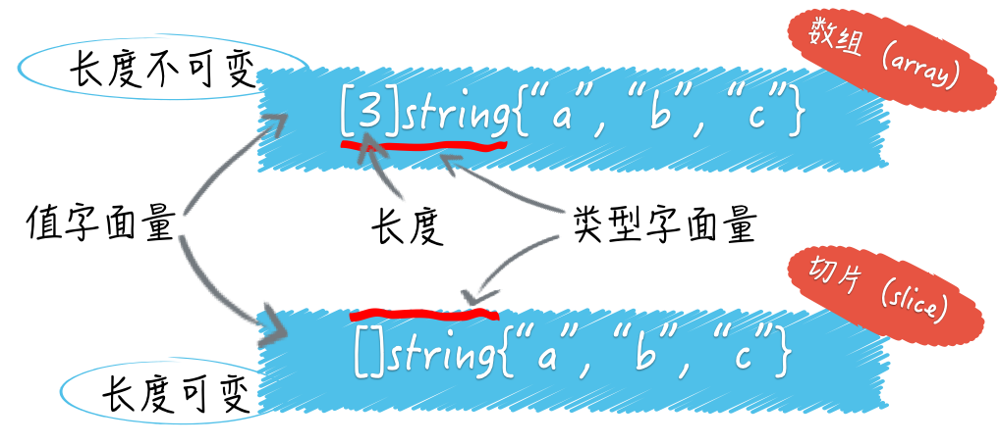

我们其实可以把切片看做是对数组的一层简单的封装，因为在每个切片的底层数据结构中，一定会包含一个数组。数组可以被叫做切片的底层数组，而切片也可以被看作是对数组的某个连续片段的引用。

Go语言的切片类型属于引用类型，同属引用类型的还有字典类型、通道类型、函数类型等；而Go语言的数组类型则属于值类型，同属值类型的有基础数据类型以及结构体类型。

在 Go 语言中，类型可以分为**值类型**和**引用类型**，它们的核心区别在于**数据传递时的行为**：值类型传递的是数据的副本，而引用类型传递的是指向底层数据的引用。

关于切片slice和数组的关系我认为可以类比滑动窗口：

现在你需要跟着我一起想象：**有一个窗口，你可以通过这个窗口看到一个数组，但是不一定能看到该数组中的所有元素，有时候只能看到连续的一部分元素。**

现在，这个数组就是切片`s2`的底层数组，而这个窗口就是切片`s2`本身。`s2`的长度实际上指明的就是这个窗口的宽度，决定了你透过`s2`，可以看到其底层数组中的哪几个连续的元素。

切片的容量代表了它的底层数组的长度，但这仅限于使用`make`函数或者切片值字面量初始化切片的情况。更通用的规则是：一个切片的容量可以被看作是透过这个窗口最多可以看到的底层数组中元素的个数。切片`s3`中有8个元素，分别是从`1`到`8`的整数。`s3`的长度和容量都是`8`。然后，我用切片表达式`s3[3:6]`初始化了切片`s4`。注意，切片代表的窗口是无法向左扩展的。所以，`s4`的容量就是其底层数组的长度`8`,减去上述切片表达式中的那个起始索引`3`，即`5`。

## 知识扩展：

**问题1：怎样估算切片容量的增长？**

一旦一个切片无法容纳更多的元素，Go语言就会想办法扩容。但它并不会改变原来的切片，而是会生成一个容量更大的切片，然后将把原有的元素和新元素一并拷贝到新切片中。在一般的情况下，你可以简单地认为新切片的容量（以下简称新容量）将会是原切片容量（以下简称原容量）的2倍。但是，当原切片的长度（以下简称原长度）大于或等于`1024`时，Go语言将会以原容量的`1.25`倍作为新容量的基准（以下新容量基准）。新容量基准会被调整（不断地与`1.25`相乘），直到结果不小于原长度与要追加的元素数量之和（以下简称新长度）。

**问题 2：切片的底层数组什么时候会被替换？**

确切地说，一个切片的底层数组永远不会被替换。为什么？虽然在扩容的时候Go语言一定会生成新的底层数组，但是它也同时生成了新的切片。请记住，在无需扩容时，`append`函数返回的是指向原底层数组的原切片，而在需要扩容时，`append`函数返回的是指向新底层数组的新切片。

注意修改切片也会修改底层数组

这里仍然是聚焦于切片的问题。

1. 如果有多个切片指向了同一个底层数组，那么你认为应该注意些什么？

我们需要特别注意的是，当操作其中一个切片的时候是否会影响到其他指向同一个底层数组的切片。

2. 怎样沿用“扩容”的思想对切片进行“缩容”？请写出代码。

关于切片的“缩容”，可参看官方的相关wiki。不过，如果你需要频繁的“缩容”，那么就可能需要考虑其他的数据结构了，比如：`container/list`代码包中的`List`。

# 08 container包中的那些容器

Go语言的链表实现在标准库的`container/list`代码包中。这个代码包中有两个公开的程序实体——`List`和`Element`，List实现了一个双向链表（以下简称链表），而Element则代表了链表中元素的结构。

**可以把自己生成的`Element`类型值传给链表吗？**

`MoveBefore`方法和`MoveAfter`方法，它们分别用于把给定的元素移动到另一个元素的前面和后面。

`MoveToFront`方法和`MoveToBack`方法，分别用于把给定的元素移动到链表的最前端和最后端。

具体问题是，如果我们自己生成这样的值，然后把它作为“给定的元素”传给链表的方法，那么会发生什么？链表会接受它吗？

```go
func (l *List) MoveBefore(e, mark *Element)
func (l *List) MoveAfter(e, mark *Element)

func (l *List) MoveToFront(e *Element)
func (l *List) MoveToBack(e *Element)
```

**典型回答**：不会接受，这些方法将不会对链表做出任何改动。因为我们自己生成的`Element`值并不在链表中，所以也就谈不上“在链表中移动元素”。更何况链表不允许我们把自己生成的`Element`值插入其中。

在List的方法中，用于插入新元素的方法都只接受interface{}类型的值，方法内部使用Element值，包装接收的新元素。

`Front`和`Back`方法分别用于获取链表中最前端和最后端的元素，- `InsertBefore`和`InsertAfter`方法分别用于在指定的元素之前和之后插入新元素，`PushFront`和`PushBack`方法则分别用于在链表的最前端和最后端插入新元素。

```go
func (l *List) Front() *Element
func (l *List) Back() *Element

func (l *List) InsertBefore(v interface{}, mark *Element) *Element
func (l *List) InsertAfter(v interface{}, mark *Element) *Element

func (l *List) PushFront(v interface{}) *Element
func (l *List) PushBack(v interface{}) *Element
```

这些方法都会把一个`Element`值的指针作为结果返回，它们就是链表留给我们的安全“接口”。

### 知识扩展：

**问题1：为什么链表可以做到开箱即用？**

`List`和`Element`都是结构体类型。结构体类型有一个特点，那就是它们的零值都会是拥有特定结构，但是没有任何定制化内容的值，相当于一个空壳。值中的字段也都会被分别赋予各自类型的零值。

那么，语句`var l list.List`声明的链表`l`可以直接使用，这是怎么做到的呢？

关键在于它的“延迟初始化”机制。

所谓的**延迟初始化**，你可以理解为把初始化操作延后，仅在实际需要的时候才进行。延迟初始化的优点在于“延后”，它可以分散初始化操作带来的计算量和存储空间消耗。

**问题 2：`Ring`与`List`的区别在哪儿？**

`container/ring`包中的`Ring`类型实现的是一个循环链表，也就是我们俗称的环。其实`List`在内部就是一个循环链表。它的根元素永远不会持有任何实际的元素值，而该元素的存在就是为了连接这个循环链表的首尾两端。

既然`Ring`和`List`在本质上都是循环链表，那它们到底有什么不同呢？

最主要的不同有下面几种。

1. `Ring`类型的数据结构仅由它自身即可代表，而`List`类型则需要由它以及`Element`类型联合表示。这是表示方式上的不同，也是结构复杂度上的不同。
2. 一个`Ring`类型的值严格来讲，只代表了其所属的循环链表中的一个元素，而一个`List`类型的值则代表了一个完整的链表。这是表示维度上的不同。
3. 在创建并初始化一个`Ring`值的时候，我们可以指定它包含的元素的数量，但是对于一个`List`值来说却不能这样做（也没有必要这样做）。循环链表一旦被创建，其长度是不可变的。这是两个代码包中的`New`函数在功能上的不同，也是两个类型在初始化值方面的第一个不同。
4. 仅通过`var r ring.Ring`语句声明的`r`将会是一个长度为`1`的循环链表，而`List`类型的零值则是一个长度为`0`的链表。别忘了`List`中的根元素不会持有实际元素值，因此计算长度时不会包含它。这是两个类型在初始化值方面的第二个不同。
5. `Ring`值的`Len`方法的算法复杂度是O(N)的，而`List`值的`Len`方法的算法复杂度则是O(1)的。这是两者在性能方面最显而易见的差别。

### 总结：

我们今天主要讨论了`container/list`包中的链表实现。我们详细讲解了链表的一些主要的使用技巧和实现特点。由于此链表实现在内部就是一个循环链表，所以我们还把它与`container/ring`包中的循环链表实现做了一番比较，包括结构、初始化以及性能方面。

**思考题**

1. `container/ring`包中的循环链表的适用场景都有哪些？

container/ring实现的是**双向循环链表**（Ring），其核心特性是：**首尾相连、无固定 “头 / 尾” 概念、支持任意节点作为起始点遍历、长度固定（初始化后不可动态增删元素）**。

这些特性决定了它不适合 “动态增删数据”“需要快速随机访问” 的场景，反而在 “环形结构依赖”“固定长度循环处理” 场景中优势明显。

1. 你使用过`container/heap`包中的堆吗？它的适用场景又有哪些呢？

堆的核心价值是 **“快速获取极值”**，因此所有需要 “频繁查询 / 更新最值” 的场景都适用。

# 09 字典的操作和约束

字典(map)存储键值对的集合。key-value，在go中为了避免歧义，我们将键值对换了一种称呼叫”键元素对”

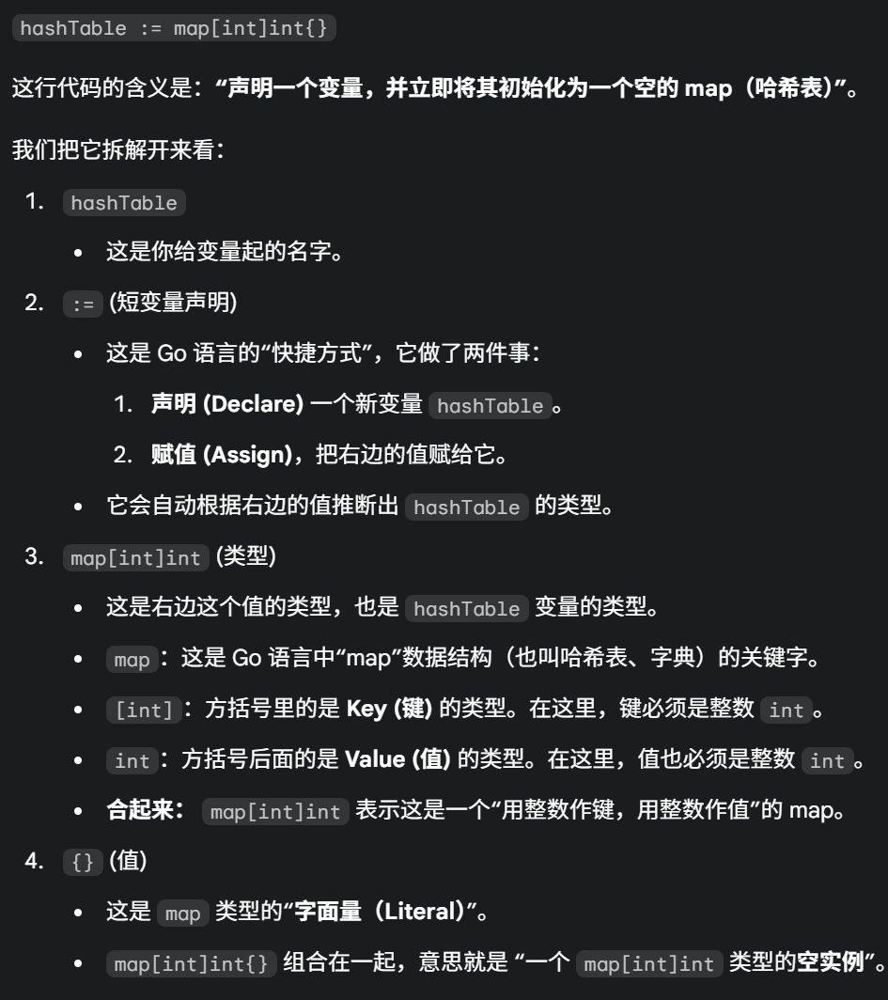

**知识前导：为什么字典的键类型会受到约束？**

Go语言的字典类型其实是一个哈希表（hash table）的特定实现，在这个实现中，键和元素的最大不同在于，键的类型是受限的，而元素却可以是任意类型的。

哈希表会先用哈希函数（hash function）把键值转换为哈希值。哈希值通常是一个无符号的整数。

**映射过程的第一步就是：把键值转换为哈希值。**

在Go语言的字典中，每一个键值都是由它的哈希值代表的。也就是说，字典不会独立存储任何键的值，但会独立存储它们的哈希值。

**字典的键类型不能是哪些类型？**

Go语言字典的键类型不可以是函数类型、字典类型和切片类型。

键类型的值必须要支持判等操作，由于函数类型、字典类型和切片类型的值并不支持判等操作，所以字典的键类型不能是这些类型。

因为存在哈希碰撞所以在哈希值一样后还会进行对键值的一次判等操作。

## **知识扩展**

**问题1：应该优先考虑哪些类型作为字典的键类型？**

**求哈希和判等操作的速度越快，对应的类型就越适合作为键类型。**

类型的宽度是指它的单个值需要占用的字节数。比如，`bool`、`int8`和`uint8`类型的一个值需要占用的字节数都是`1`，因此这些类型的宽度就都是`1`。

答案是，优先选用数值类型和指针类型，通常情况下类型的宽度越小越好。如果非要选择字符串类型的话，最好对键值的长度进行额外的约束。

**问题2：在值为`nil`的字典上执行读操作会成功吗，那写操作呢？**

仅声明而不初始化一个字典类型的变量的时候，它的值会是`nil`。
除了添加键-元素对，我们在一个值为`nil`的字典上做任何操作都不会引起错误。当我们试图在一个值为`nil`的字典中添加键-元素对的时候，Go语言的运行时系统就会立即抛出一个panic。

### 思考题：

字典类型的值是并发安全的吗？如果不是，那么在我们只在字典上添加或删除键-元素对的情况下，依然不安全吗？
**原生的 `map` 类型同样不是并发安全的**，即使只对其进行添加（`map[key] = value`）或删除（`delete(map, key)`）操作，依然存在线程安全问题。

1. **直接 panic**：Go 运行时会检测 `map` 的并发写操作，一旦发现多个 goroutine 同时修改 `map`，会直接触发 `fatal error: concurrent map writes` 错误并终止程序。
2. **数据不一致**：即使未触发 panic，也可能导致键值对丢失、重复添加或内部结构损坏（如桶指针错乱）

# 10 通道的基本操作

go语言最有特色的数据类型——channel通道可以和goroutine并驾齐驱。这两个共同代表Go语言独有的并发编程模式和编程哲学。

Don’t communicate by sharing memory; share memory by communicating. （不要通过共享内存来通信，而应该通过通信来共享内存。）

我们可以利用通道在多个goroutine之间传递数据。

### 通道的基础知识：

通道类型的值本身就是并发安全这也是go语言自带的，唯一一个可以满足并发安全性的类型。在声明和初始化一个通道的时候，我们需要用到 make 确定该通道类型的元素类型，这也决定了我们可以通过这个通道传递什么类型的数据。

chan string 代表了一个元素类型为string的通道类型。在初始化通道的时候，make函数除了必须接受这样的类型字面量，还可以接受一个int参数作为表示该通道的容量。注意不能小于0.当容量为0时，我们可以称该通道为非缓冲通道，也就是不带缓冲。

**一个通道相当于一个先进先出（FIFO）的队列。也就是说，通道中的各个元素值都是严格地按照发送的顺序排列的，先被发送通道的元素值一定会先被接收。元素值的发送和接收都需要用到操作符`<-`。我们也可以叫它接送操作符。一个左尖括号紧接着一个减号形象地代表了元素值的传输方向。**

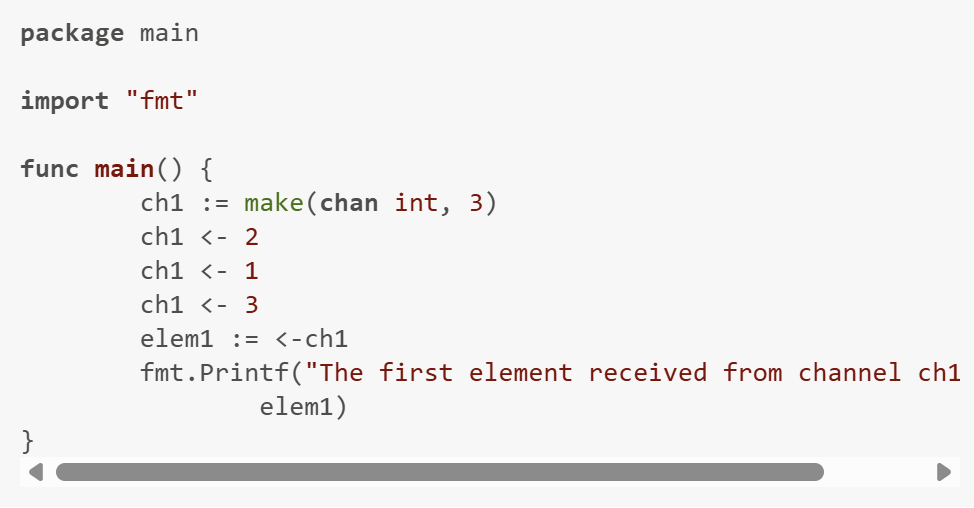

**问题是：对通道的发送和接收操作都有哪些基本的特性？**

它们的基本特性如下。

1. 对于同一个通道，发送操作之间是互斥的，接收操作之间也是互斥的。
2. 发送操作和接收操作中对元素值的处理都是不可分割的。
3. 发送操作在完全完成之前会被阻塞。接收操作也是如此。

 

1.  在同一时刻，Go语言的运行时系统（以下简称运行时系统）只会执行对同一个通道的任意个发送操作中的某一个。直到这个元素值被完全复制进该通道之后，其他针对该通道的发送操作才可能被执行。**这里要注意的一个细节是，元素值从外界进入通道时会被复制。更具体地说，进入通道的并不是在接收操作符右边的那个元素值，而是它的副本。另一方面，元素值从通道进入外界时会被移动。这个移动操作实际上包含了两步，第一步是生成正在通道中的这个元素值的副本，并准备给到接收方，第二步是删除在通道中的这个元素值。**
2. 这里的“不可分割”的意思是，它们处理元素值时都是一气呵成的，绝不会被打断。例如，发送操作要么还没复制元素值，要么已经复制完毕，绝不会出现只复制了一部分的情况。
3. 一般情况下，发送操作包括了“复制元素值”和“放置副本到通道内部”这两个步骤。在这两个步骤完全完成之前，发起这个发送操作的那句代码会一直阻塞在那里。也就是说，在它之后的代码不会有执行的机会，直到这句代码的阻塞解除。在通道完成发送操作之后，运行时系统会通知这句代码所在的goroutine，以使它去争取继续运行代码的机会。另外，接收操作通常包含了“复制通道内的元素值”“放置副本到接收方”“删掉原值”三个步骤。**如此阻塞代码其实就是为了实现操作的互斥和元素值的完整。**

### 知识扩展：

**问题1：发送操作和接收操作在什么时候可能被长时间的阻塞？**

先说针对**缓冲通道**的情况。如果通道已满，那么对它的所有发送操作都会被阻塞，直到通道中有元素值被接收走。对于**非缓冲通道**，情况要简单一些。无论是发送操作还是接收操作，一开始执行就会被阻塞，直到配对的操作也开始执行，才会继续传递。由此可见，非缓冲通道是在用同步的方式传递数据。也就是说，只有收发双方对接上了，数据才会被传递。

对于值为`nil`的通道，不论它的具体类型是什么，对它的发送操作和接收操作都会永久地处于阻塞状态。它们所属的goroutine中的任何代码，都不再会被执行。

注意，由于通道类型是引用类型，所以它的零值就是`nil`。换句话说，当我们只声明该类型的变量但没有用`make`函数对它进行初始化时，该变量的值就会是`nil`。我们一定不要忘记初始化通道！

**问题2：发送操作和接收操作在什么时候会引发panic？**

对于一个已初始化，但并未关闭的通道来说，收发操作一定不会引发panic。但是通道一旦关闭，再对它进行发送操作，就会引发panic。

另外，如果我们试图关闭一个已经关闭了的通道，也会引发panic。

注意我们最好让发送方来关通道。

### 总结：

首先是在初始化通道时设定其容量的意义，这有时会让通道拥有不同的行为模式。对通道的发送操作和接收操作都有哪些基本特性，也是我们必须清楚的。

这涉及了它们什么时候会互斥，什么时候会造成阻塞，什么时候会引起panic，以及它们收发元素值的顺序是怎样的，它们是怎样保证元素值的完整性的，元素值通常会被复制几次，等等。

最后别忘了，通道也是Go语言的并发编程模式中重要的一员。

### 思考：

1. 通道的长度代表着什么？它在什么时候会通道的容量相同？

通道的**长度（Length）**，通过内置函数 `len(ch)` 获取，代表**通道缓冲区中当前已存储的、尚未被接收的元素数量**。

- **对于缓冲通道 (Buffered Channel):** `len()` 返回的是缓冲区中“排队”等待被读取的元素个数。
- **对于非缓冲通道 (Unbuffered Channel):** 由于没有缓冲区（容量为0），发送操作会**直接阻塞**，直到有接收者准备好接收。因此，非缓冲通道的长度**永远为 0**。
- **对于 `nil` 通道:** `nil` 通道（未初始化的通道）的长度也**永远为 0**。

通道的**容量（Capacity）**，通过内置函数 `cap(ch)` 获取，代表通道在创建时（使用 `make`）指定的缓冲区大小。

当**通道的长度等于其容量时**，意味着：

**这个缓冲通道（Buffered Channel）已经满了**

1. 元素值在经过通道传递时会被复制，那么这个复制是浅表复制还是深层复制呢？

这是一个非常关键的概念：**Go 语言中所有的值传递（包括通过通道发送）都是“按值复制”的，这个复制是浅表复制（Shallow Copy）。**

“浅表复制”意味着 Go 只会复制这个值在内存中占用的那块空间。

# 11 通道的高级玩法

一个通道是双向的，还是单向的是由它的类型字面量体现的。

![image 1.png](<attachment:image 1.png>)

关于单向通道，我们一定会有这样一个疑问，md这个有啥用。只能发收不了，不是没有用吗。

**问题：单向通道有什么应用价值？**

**典型回答**

概括地说，单向通道最主要的用途就是约束其他代码的行为。

![image 2.png](<attachment:image 2.png>)

这个时候，我们会有疑问：我们自己写的函数自己肯定知道操作通道的方式，为什么还要再约束？

在实际场景中，这种约束一般会出现在接口类型声明中的某个方法定义上。

请看这个叫`Notifier`的接口类型声明：

```go
type Notifier interface {
	SendInt(ch chan<- int)
}
```

在接口类型声明的花括号中，每一行都代表着一个方法的定义。接口中的方法定义与函数声明很类似，但是只包含了方法名称、参数列表和结果列表。

一个类型如果想成为一个接口类型的实现类型，那么就必须实现这个接口中定义的所有方法。因此，如果我们在某个方法的定义中使用了单向通道类型，那么就相当于在对它的所有实现做出约束。

顺便说一下，我们在调用`SendInt`函数的时候，只需要把一个元素类型匹配的双向通道传给它就行了，没必要用发送通道，因为Go语言在这种情况下会自动地把双向通道转换为函数所需的单向通道。

![image 3.png](<attachment:image 3.png>)

### 知识扩展:

**问题1：`select`语句与通道怎样联用，应该注意些什么？**

`select`语句只能与通道联用，它一般由若干个分支组成。每次执行这种语句的时候，一般只有一个分支中的代码会被运行。

`select`语句的分支分为两种，一种叫做候选分支，另一种叫做默认分支。候选分支总是以关键字`case`开头，后跟一个`case`表达式和一个冒号，然后我们可以从下一行开始写入当分支被选中时需要执行的语句。

默认分支其实就是default case，因为，当且仅当没有候选分支被选中时它才会被执行，所以它以关键字`default`开头并直接后跟一个冒号。同样的，我们可以在`default:`的下一行写入要执行的语句。

由于`select`语句是专为通道而设计的，所以每个`case`表达式中都只能包含操作通道的表达式，比如接收表达式。

在使用`select`语句的时候，我们首先需要注意下面几个事情。

1. 如果像上述示例那样加入了默认分支，那么无论涉及通道操作的表达式是否有阻塞，`select`语句都不会被阻塞。如果那几个表达式都阻塞了，或者说都没有满足求值的条件，那么默认分支就会被选中并执行。
2. 如果没有加入默认分支，那么一旦所有的`case`表达式都没有满足求值条件，那么`select`语句就会被阻塞。直到至少有一个`case`表达式满足条件为止。
3. 还记得吗？我们可能会因为通道关闭了，而直接从通道接收到一个其元素类型的零值。所以，在很多时候，我们需要通过接收表达式的第二个结果值来判断通道是否已经关闭。一旦发现某个通道关闭了，我们就应该及时地屏蔽掉对应的分支或者采取其他措施。这对于程序逻辑和程序性能都是有好处的。注意我们来判断这个通道是否被关闭也是有必要的。可以考虑类型判断那个做法。
4. `select`语句只能对其中的每一个`case`表达式各求值一次。所以，如果我们想连续或定时地操作其中的通道的话，就往往需要通过在`for`语句中嵌入`select`语句的方式实现。但这时要注意，简单地在`select`语句的分支中使用`break`语句，只能结束当前的`select`语句的执行，而并不会对外层的`for`语句产生作用。这种错误的用法可能会让这个`for`语句无休止地运行下去。

**问题2：`select`语句的分支选择规则都有哪些？**

![image 4.png](<attachment:image 4.png>)

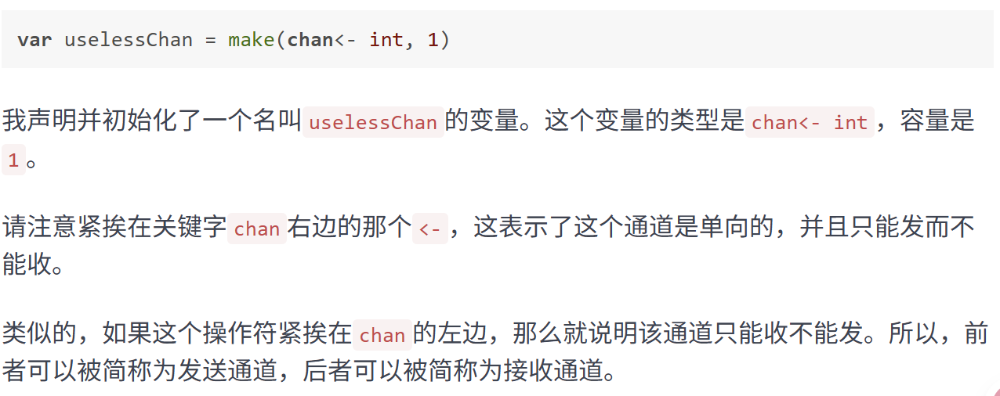

### 总结：

今天，我们先讲了单向通道的表示方法，操作符“`<-`”仍然是关键。如果只用一个词来概括单向通道存在的意义的话，那就是“约束”，也就是对代码的约束。

我们可以使用带`range`子句的`for`语句从通道中获取数据，也可以通过`select`语句操纵通道。

`select`语句是专门为通道而设计的，它可以包含若干个候选分支，每个分支中的`case`表达式都会包含针对某个通道的发送或接收操作。

当`select`语句被执行时，它会根据一套**分支选择规则**选中某一个分支并执行其中的代码。如果所有的候选分支都没有被选中，那么默认分支（如果有的话）就会被执行。注意，发送和接收操作的阻塞是分支选择规则的一个很重要的依据。

### 思考：

1. 如果在`select`语句中发现某个通道已关闭，那么应该怎样屏蔽掉它所在的分支？

当 select 语句中某个通道被关闭时，该通道的读操作会立即返回零值。为了屏蔽这个分支，可以使用一个标志位或者通过多重判断来实现：更优雅的方式是使用 `nil` 通道，因为对 `nil` 通道的操作会被阻塞，从而 effectively 屏蔽该分支：

1. 在`select`语句与`for`语句联用时，怎样直接退出外层的`for`语句？
- 使用 `break` 配合标签（label）
- 使用一个控制循环的标志位
- 使用 `return`（如果在函数中）

注意无缓冲通道的发送必须同步匹配一个正在接受的goroutine，否则发送就会阻塞，一直不会就绪。
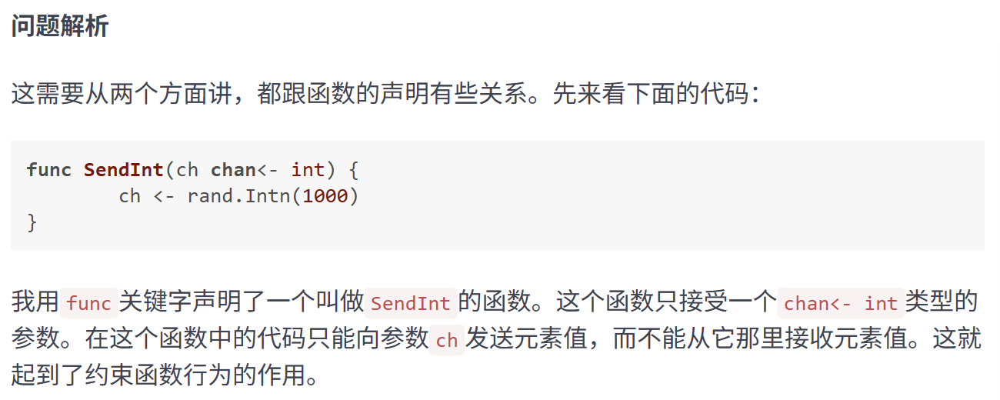
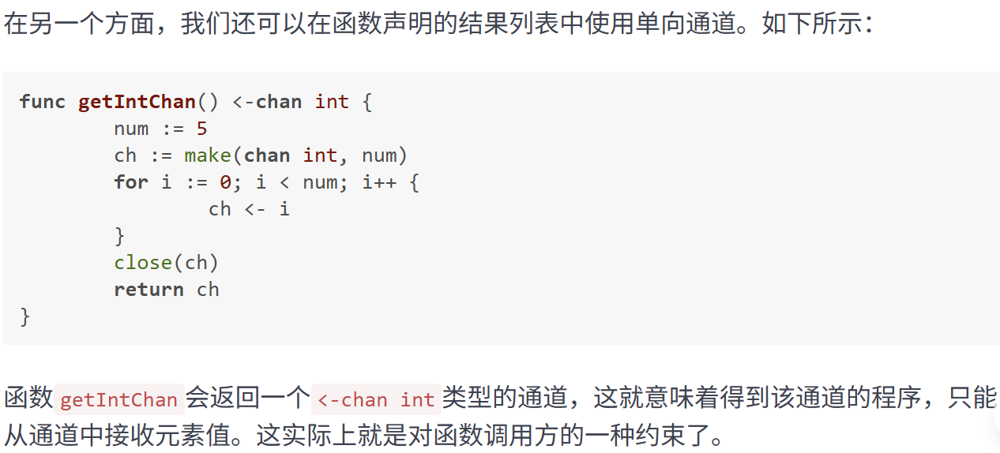
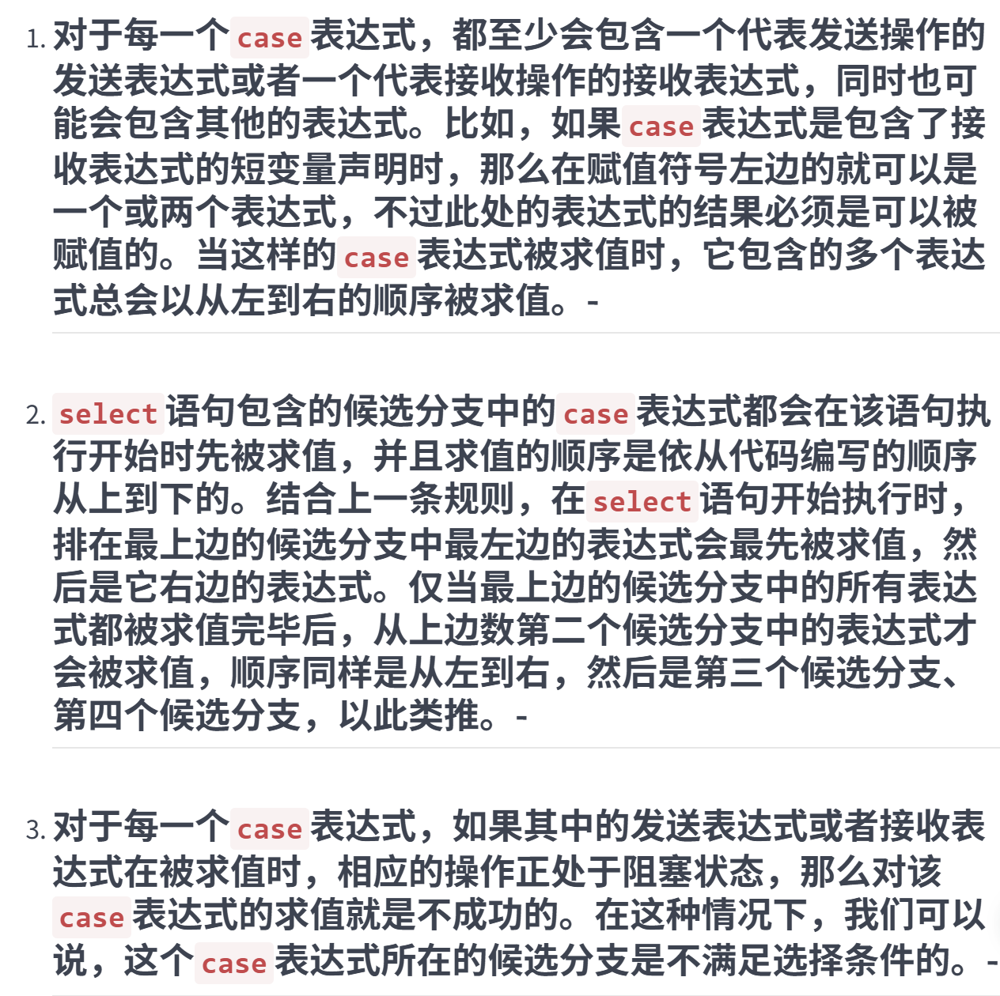
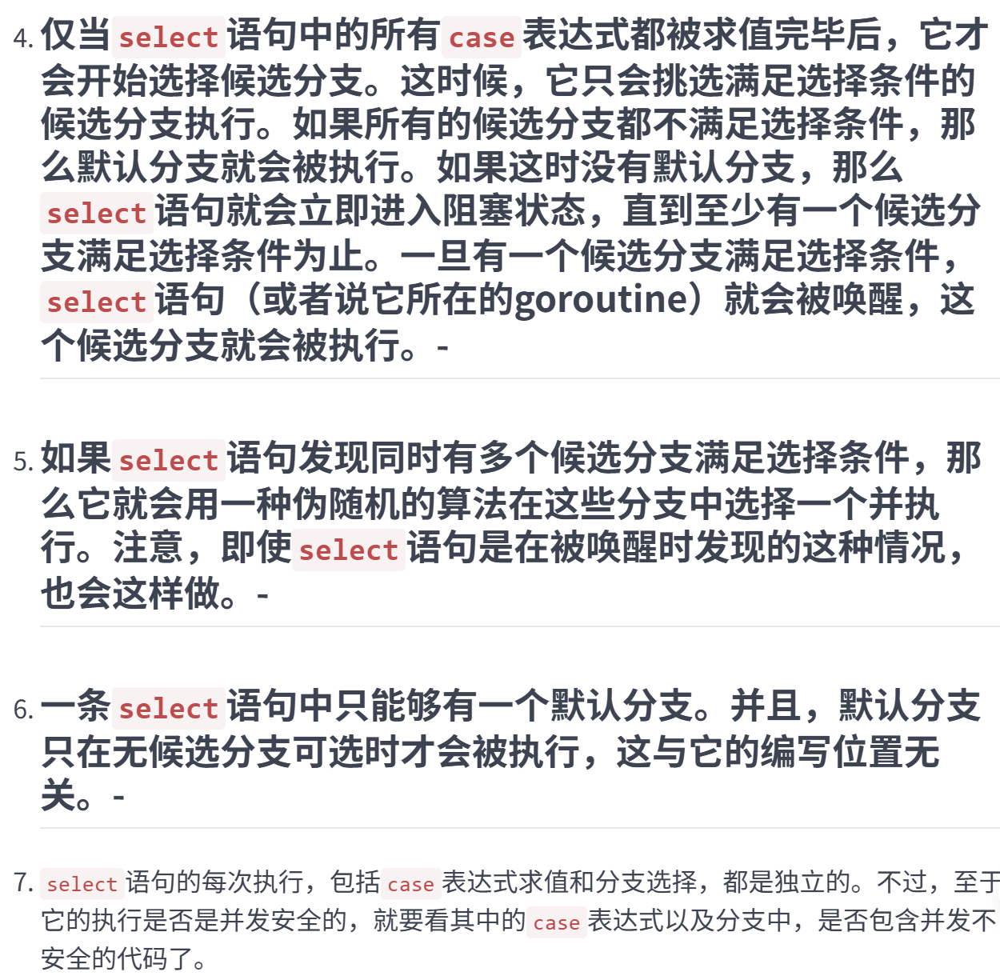

# 12 使用函数的正确姿势

在几乎所有主流的编程语言中，集合类的数据类型都是最常用和最重要的。

本节主要介绍怎么用go语言来进行模块化编程。

**前导内容：函数是一等的公民**

在Go语言中，函数可是一等的（first-class）公民，函数类型也是一等的数据类型。这是什么意思呢？

简单来说，这意味着函数不但可以用于封装代码、分割功能、解耦逻辑，还可以化身为普通的值，在其他函数间传递、赋予变量、做类型判断和转换等等，就像切片和字典的值那样。

而更深层次的含义就是：函数值可以由此成为能够被随意传播的独立逻辑组件（或者说功能模块）。

只要两个函数的参数列表和结果列表中的元素顺序及其类型是一致的，我们就可以说它们是一样的函数，或者说是实现了同一个函数类型的函数。

**今天的问题是：怎样编写高阶函数？**

高阶函数可以满足下面的两个条件：

**1. 接受其他的函数作为参数传入；**- **2. 把其他的函数作为结果返回。**

只要满足了其中任意一个特点，我们就可以说这个函数是一个高阶函数。高阶函数也是函数式编程中的重要概念和特征。

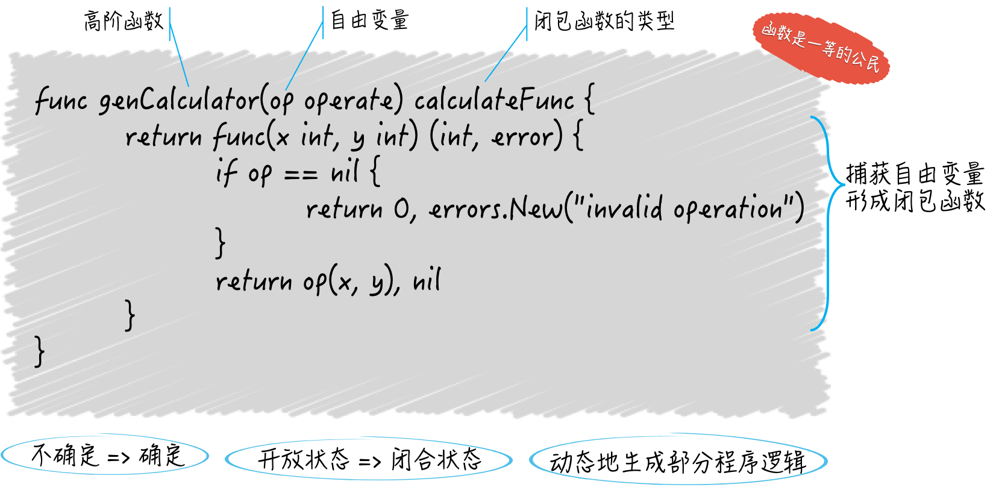

![image 1.png](<attachment:image 1.png>)

在demo27.go这个文件中，第二种方法的实现其实是返回了一个函数。

### 知识扩展：

**问题1：如何实现闭包？**

闭包又是什么？你可以想象一下，在一个函数中存在对外来标识符的引用。所谓的外来标识符，既不代表当前函数的任何参数或结果，也不是函数内部声明的，它是直接从外边拿过来的。

还有个专门的术语称呼它，叫自由变量，可见它代表的肯定是个变量。实际上，如果它是个常量，那也就形成不了闭包了，因为常量是不可变的程序实体，而闭包体现的却是由“不确定”变为“确定”的一个过程。

我们说的这个函数（以下简称闭包函数）就是因为引用了自由变量，而呈现出了一种“不确定”的状态，也叫“开放”状态。

![image 2.png](<attachment:image 2.png>)

![image 3.png](<attachment:image 3.png>)

那么，实现闭包的意义又在哪里呢？表面上看，我们只是延迟实现了一部分程序逻辑或功能而已，但实际上，我们是在动态地生成那部分程序逻辑。

我们可以借此在程序运行的过程中，根据需要生成功能不同的函数，继而影响后续的程序行为。这与GoF设计模式中的“模板方法”模式有着异曲同工之妙，不是吗？

**问题2：传入函数的那些参数值后来怎么样了？**

![image 4.png](<attachment:image 4.png>)

注意，对于引用类型，比如：切片、字典、通道，像上面那样复制它们的值，只会拷贝它们本身而已，并不会拷贝它们引用的底层数据。也就是说，这时只是浅表复制，而不是深层复制。

以切片值为例，如此复制的时候，只是拷贝了它指向底层数组中某一个元素的指针，以及它的长度值和容量值，而它的底层数组并不会被拷贝。

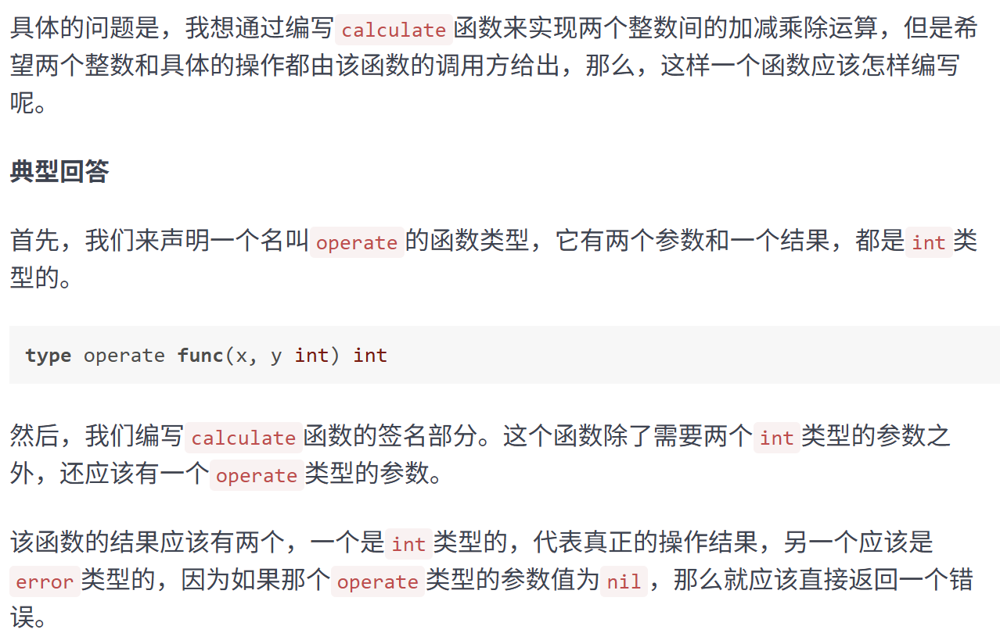

如果最这个切片进行修改那应该会影响到，因为切片是引用类型，是浅层拷贝。

### 总结：

我们今天主要聚焦于函数的使用手法。在Go语言中，函数可是一等的（first-class）公民。它既可以被独立声明，也可以被作为普通的值来传递或赋予变量。除此之外，我们还可以在其他函数的内部声明匿名函数并把它直接赋给变量。

你需要记住Go语言是怎样鉴别一个函数的，函数的签名在这里起到了至关重要的作用。

函数是Go语言支持函数式编程的主要体现。我们可以通过“把函数传给函数”以及“让函数返回函数”来编写高阶函数，也可以用高阶函数来实现闭包，并以此做到部分程序逻辑的动态生成。

我们在最后还说了一下关于函数传参的一个注意事项，这很重要，可能会关系到程序的稳定和安全。

一个相关的原则是：既不要把你程序的细节暴露给外界，也尽量不要让外界的变动影响到你的程序。你可以想想这个原则在这里可以起到怎样的指导作用。

**思考题**

1. `complexArray1`被传入函数的话，这个函数中对该参数值的修改会影响到它的原值吗？
    
    会但是主要看修改方式，如果修改的是切片的底层数据就会。
    
2. 函数真正拿到的参数值其实只是它们的副本，那么函数返回给调用方的结果值也会被复制吗？
    
    会
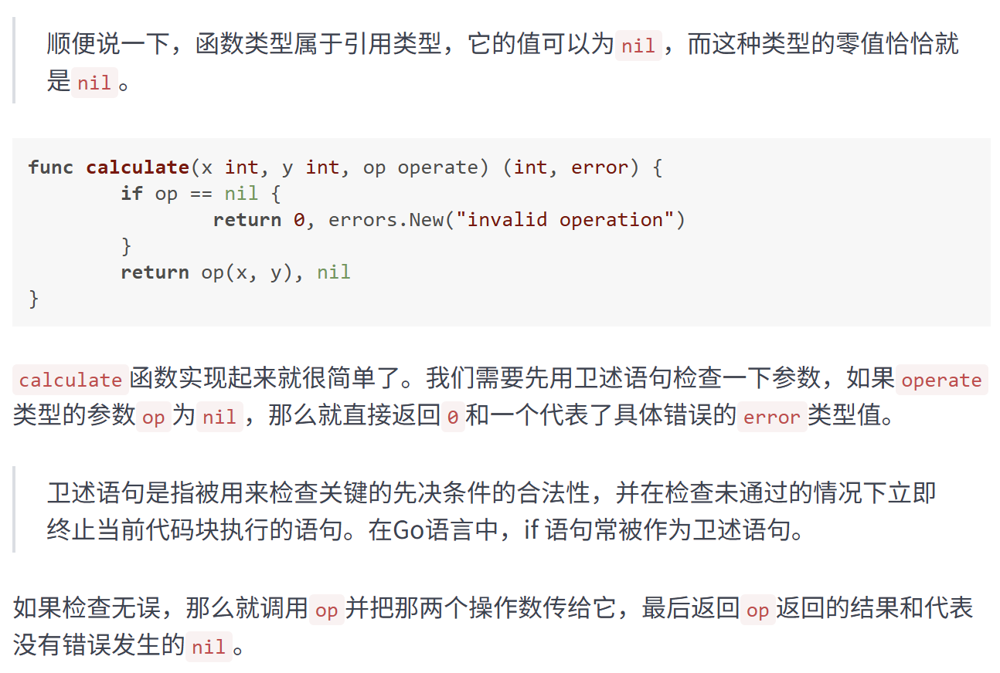
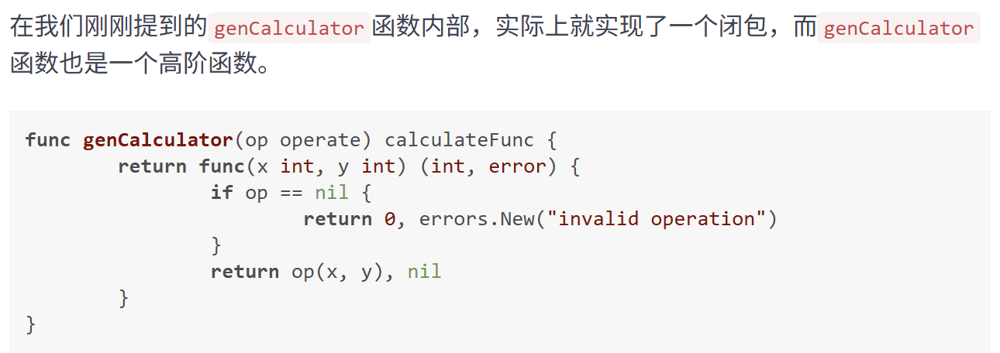
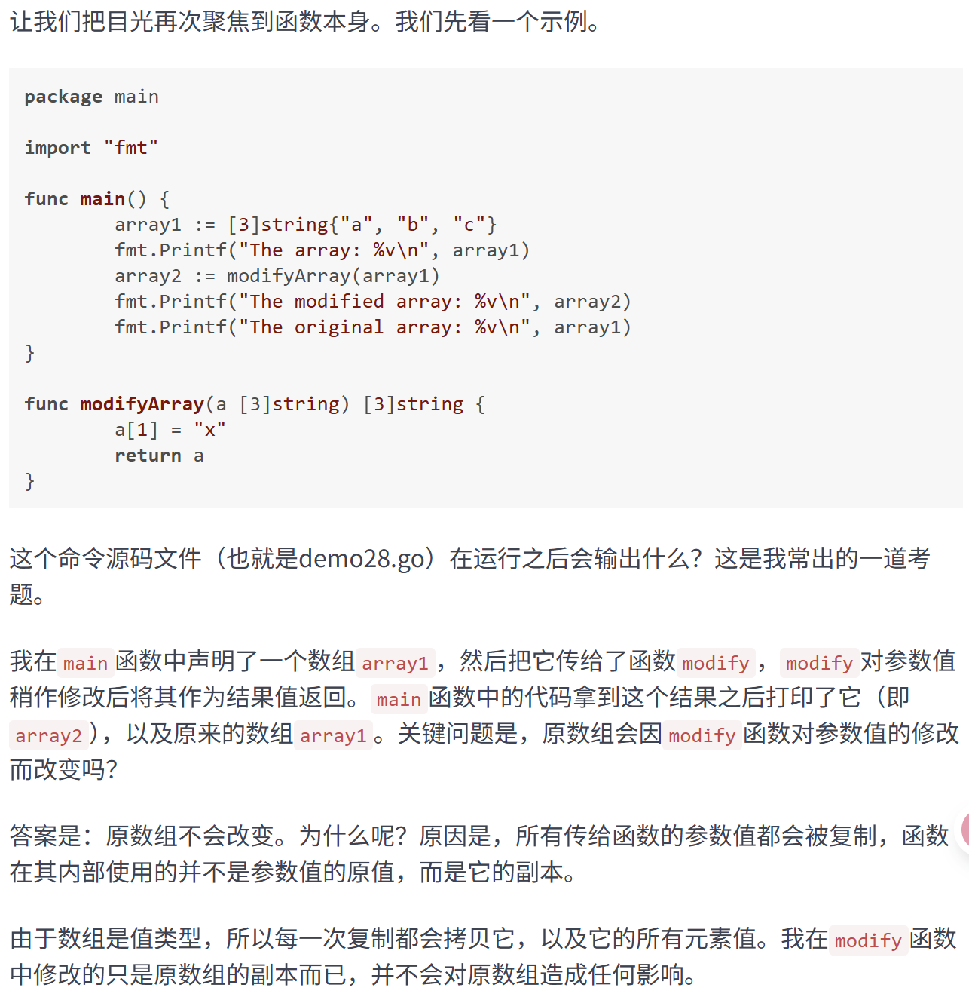
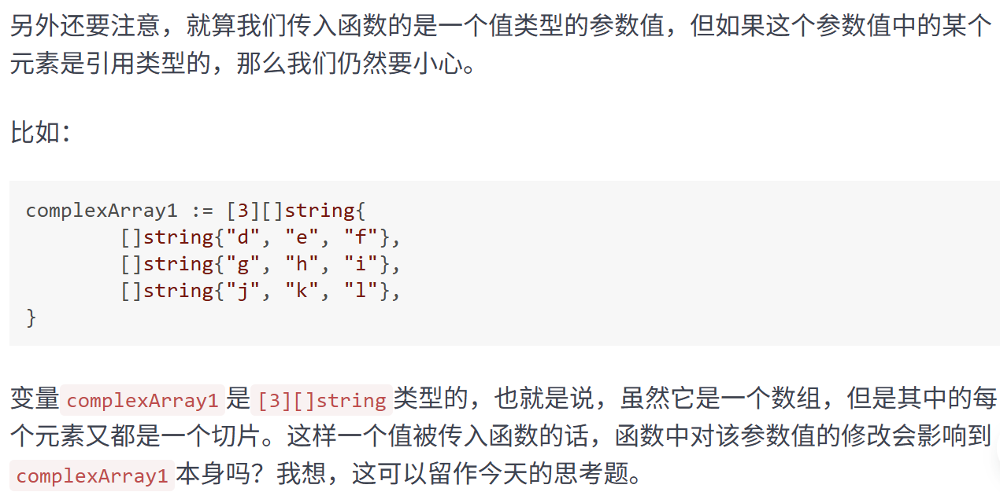

# 13 结构体及其方法的使用法门

**前导内容：结构体类型基础知识**

当然了，结构体类型也可以不包含任何字段，这样并不是没有意义的，因为我们还可以为类型关联上一些方法，这里你可以把方法看做是函数的特殊版本。

函数是独立的程序实体。我们可以声明有名字的函数，也可以声明没名字的函数，还可以把它们当做普通的值传来传去。我们能把具有相同签名的函数抽象成独立的函数类型，以作为一组输入、输出（或者说一类逻辑组件）的代表。

方法却不同，它需要有名字，不能被当作值来看待，最重要的是，它必须隶属于某一个类型。方法所属的类型会通过其声明中的接收者（receiver）声明体现出来。

接收者声明就是在关键字`func`和方法名称之间的圆括号包裹起来的内容，其中必须包含确切的名称和类型字面量。

**接收者的类型其实就是当前方法所属的类型，而接收者的名称，则用于在当前方法中引用它所属的类型的当前值。**

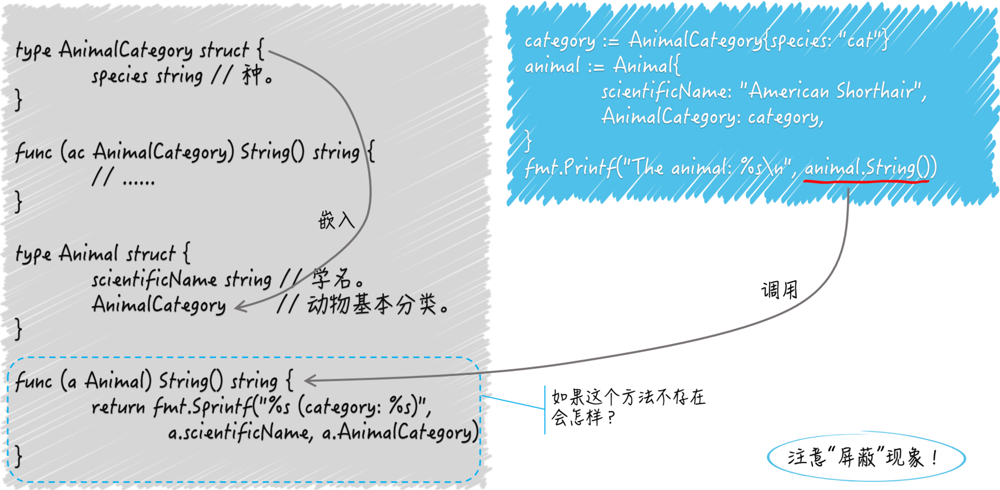

在Go语言中，我们可以通过为一个类型编写名为`String`的方法，来自定义该类型的字符串表示形式。这个`String`方法不需要任何参数声明，但需要有一个`string`类型的结果声明。

方法隶属的类型其实并不局限于结构体类型，但必须是某个自定义的数据类型，并且不能是任何接口类型。

一个数据类型关联的所有方法，共同组成了该类型的方法集合。同一个方法集合中的方法不能出现重名。并且，如果它们所属的是一个结构体类型，那么它们的名称与该类型中任何字段的名称也不能重复。

我们可以把结构体类型中的一个字段看作是它的一个属性或者一项数据，再把隶属于它的一个方法看作是附加在其中数据之上的一个能力或者一项操作。将属性及其能力（或者说数据及其操作）封装在一起，是面向对象编程（object-oriented programming）的一个主要原则。

Go语言摄取了面向对象编程中的很多优秀特性，同时也推荐这种封装的做法。从这方面看，Go语言其实是支持面向对象编程的，但它选择摒弃了一些在实际运用过程中容易引起程序开发者困惑的特性和规则。

```go
type Animal struct {
	scientificName string // 学名。
	AnimalCategory    // 动物基本分类。
}
```

**我们今天的问题是：`Animal`类型中的字段声明`AnimalCategory`代表了什么？**

更宽泛地讲，如果结构体类型的某个字段声明中只有一个类型名，那么该字段代表了什么？

**这个问题的典型回答是**：字段声明`AnimalCategory`代表了`Animal`类型的一个嵌入字段。Go语言规范规定，如果一个字段的声明中只有字段的类型名而没有字段的名称，那么它就是一个嵌入字段，也可以被称为匿名字段。我们可以通过此类型变量的名称后跟“.”，再后跟嵌入字段类型的方式引用到该字段。也就是说，嵌入字段的类型既是类型也是名称。

![image 1.png](<attachment:image 1.png>)

在某个代表变量的标识符的右边加“.”，再加上字段名或方法名的表达式被称为选择表达式，它用来表示选择了该变量的某个字段或者方法。

![image 2.png](<attachment:image 2.png>)

我在后面使用`fmt.Printf`函数和`%s`占位符试图打印`animal`的字符串表示形式，相当于调用`animal`的`String`方法。虽然我们还没有为`Animal`类型编写`String`方法，但这样做是没问题的。因为在这里，嵌入字段`AnimalCategory`的`String`方法会被当做`animal`的方法调用。

**那如果我也为`Animal`类型编写一个`String`方法呢？这里会调用哪一个呢？**

答案是，`animal`的`String`方法会被调用。这时，我们说，嵌入字段`AnimalCategory`的`String`方法被“屏蔽”了。注意，只要名称相同，无论这两个方法的签名是否一致，被嵌入类型的方法都会“屏蔽”掉嵌入字段的同名方法。

![image 3.png](<attachment:image 3.png>)

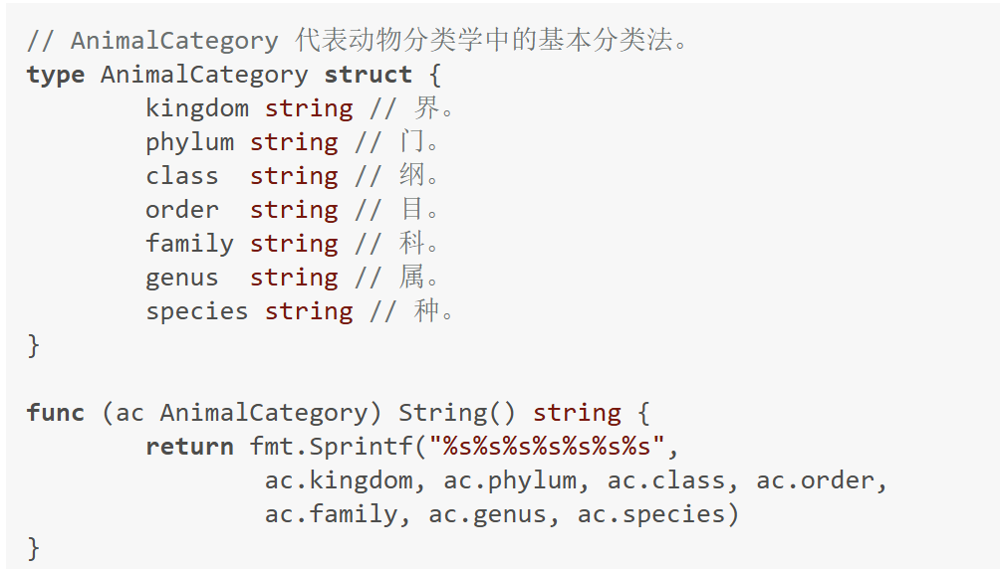

多层嵌入的情况：

```go
type Cat struct {
	name string
	Animal
}

func (cat Cat) String() string {
	return fmt.Sprintf("%s (category: %s, name: %q)",
		cat.scientificName, cat.Animal.AnimalCategory, cat.name)
}
```

结构体类型`Cat`中有一个嵌入字段`Animal`，而`Animal`类型还有一个嵌入字段`AnimalCategory`。

在这种情况下，“屏蔽”现象会以嵌入的层级为依据，嵌入层级越深的字段或方法越可能被“屏蔽”。

例如，当我们调用`Cat`类型值的`String`方法时，如果该类型确有`String`方法，那么嵌入字段`Animal`和`AnimalCategory`的`String`方法都会被“屏蔽”。

如果该类型没有`String`方法，那么嵌入字段`Animal`的`String`方法会被调用，而它的嵌入字段`AnimalCategory`的`String`方法仍然会被屏蔽。

只有当`Cat`类型和`Animal`类型都没有`String`方法的时候，`AnimalCategory`的`String`方法菜会被调用。

最后的最后，如果处于同一个层级的多个嵌入字段拥有同名的字段或方法，那么从被嵌入类型的值那里，选择此名称的时候就会引发一个编译错误，因为编译器无法确定被选择的成员到底是哪一个。

### 知识扩展：

**问题1：Go语言是用嵌入字段实现了继承吗？**

这里强调一下，Go语言中根本没有继承的概念，它所做的是通过嵌入字段的方式实现了类型之间的组合。

类型之间的组合采用的是非声明的方式，我们不需要显式地声明某个类型实现了某个接口，或者一个类型继承了另一个类型。

同时，类型组合也是非侵入式的，它不会破坏类型的封装或加重类型之间的耦合。

我们要做的只是把类型当做字段嵌入进来，然后坐享其成地使用嵌入字段所拥有的一切。如果嵌入字段有哪里不合心意，我们还可以用“包装”或“屏蔽”的方式去调整和优化。

另外，类型间的组合也是灵活的，我们总是可以通过嵌入字段的方式把一个类型的属性和能力“嫁接”给另一个类型。

这时候，被嵌入类型也就自然而然地实现了嵌入字段所实现的接口。再者，组合要比继承更加简洁和清晰，Go语言可以轻而易举地通过嵌入多个字段来实现功能强大的类型，却不会有多重继承那样复杂的层次结构和可观的管理成本。

接口类型之间也可以组合。在Go语言中，接口类型之间的组合甚至更加常见，我们常常以此来扩展接口定义的行为或者标记接口的特征。

**问题2：值方法和指针方法都是什么意思，有什么区别？**

我们都知道，方法的接收者类型必须是某个自定义的数据类型，而且不能是接口类型或接口的指针类型。所谓的值方法，就是接收者类型是非指针的自定义数据类型的方法。

比如，我们在前面为`AnimalCategory`、`Animal`以及`Cat`类型声明的那些方法都是值方法。就拿`Cat`来说，它的`String`方法的接收者类型就是`Cat`，一个非指针类型。那什么叫指针类型呢？请看这个方法：

```go
func (cat *Cat) SetName(name string) {
	cat.name = name
}
```

方法`SetName`的接收者类型是`*Cat`。`Cat`左边再加个`*`代表的就是`Cat`类型的指针类型。

这时，`Cat`可以被叫做`*Cat`的基本类型。你可以认为这种指针类型的值表示的是指向某个基本类型值的指针。

我们可以通过把取值操作符`*`放在这样一个指针值的左边来组成一个取值表达式，以获取该指针值指向的基本类型值，也可以通过把取址操作符`&`放在一个可寻址的基本类型值的左边来组成一个取址表达式，以获取该基本类型值的指针值。

所谓的指针方法，就是接收者类型是上述指针类型的方法。

值方法和指针方法之间的不同点：

1. **值方法的接收者是该方法所属的那个类型值的一个副本。我们在该方法内对该副本的修改一般都不会体现在原值上，除非这个类型本身是某个引用类型（比如切片或字典）的别名类型。而指针方法的接收者，是该方法所属的那个基本类型值的指针值的一个副本。我们在这样的方法内对该副本指向的值进行修改，却一定会体现在原值上。**
2. **一个自定义数据类型的方法集合中仅会包含它的所有值方法，而该类型的指针类型的方法集合却囊括了前者的所有方法，包括所有值方法和所有指针方法。严格来讲，我们在这样的基本类型的值上只能调用到它的值方法。但是，Go语言会适时地为我们进行自动地转译，使得我们在这样的值上也能调用到它的指针方法。**

比如，在`Cat`类型的变量`cat`之上，之所以我们可以通过`cat.SetName("monster")`修改猫的名字，是因为Go语言把它自动转译为了`(&cat).SetName("monster")`，即：先取`cat`的指针值，然后在该指针值上调用`SetName`方法。 

1. **在后边你会了解到，一个类型的方法集合中有哪些方法与它能实现哪些接口类型是息息相关的。如果一个基本类型和它的指针类型的方法集合是不同的，那么它们具体实现的接口类型的数量就也会有差异，除非这两个数量都是零。**

比如，一个指针类型实现了某某接口类型，但它的基本类型却不一定能够作为该接口的实现类型。

### 总结：

结构体类型的嵌入字段比较容易让Go语言新手们迷惑，所以我在本篇文章着重解释了它的编写方法、基本的特性和规则以及更深层次的含义。在理解了结构体类型及其方法的组成方式和构造套路之后，这些知识应该是你重点掌握的。

嵌入字段是其声明中只有类型而没有名称的字段，它可以以一种很自然的方式为被嵌入的类型带来新的属性和能力。在一般情况下，我们用简单的选择表达式就可以直接引用到它们的字段和方法。

不过，我们需要小心可能产生“屏蔽”现象的地方，尤其是当存在多个嵌入字段或者多层嵌入的时候。“屏蔽”现象可能会让你的实际引用与你的预期不符。

另外，你一定要梳理清楚值方法和指针方法的不同之处，包括这两种方法各自能做什么、不能做什么以及会影响到其所属类型的哪些方面。这涉及值的修改、方法集合和接口实现。

最后，再次强调，嵌入字段是实现类型间组合的一种方式，这与继承没有半点儿关系。Go语言虽然支持面向对象编程，但是根本就没有“继承”这个概念。

**思考题**

1. 我们可以在结构体类型中嵌入某个类型的指针类型吗？如果可以，有哪些注意事项？
    
    可以，注意嵌入的指针没有初始化是nil，调用时会触发panic。必须显式初始化嵌入的指针，否则其字段和方法无法正常使用。一般在结构体构造函数中完成初始化。与非指针嵌入的区别：嵌入非指针类型时，外层结构体持有内部类型的副本；而嵌入指针类型时，多个外层结构体可共享同一个内部对象（引用语义）。
    

1. 字面量`struct{}`代表了什么？又有什么用处？

**无字段结构体**，其特点是：

- 类型大小为 0（不占用内存空间）
- 没有任何字段和方法
- 所有`struct{}`值都是等价的（可视为唯一值）

作用有1.作为占位符2.在通道中传递“事件发生”的信号。3.在充当占位符的时候节约内存。4.定义空接口的实现。
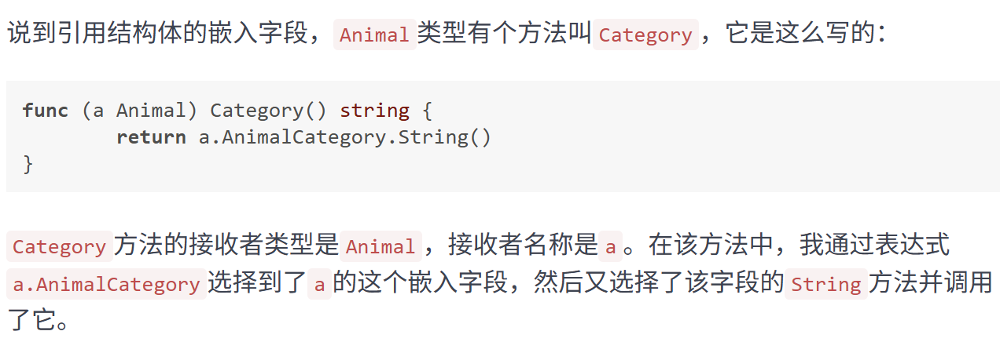
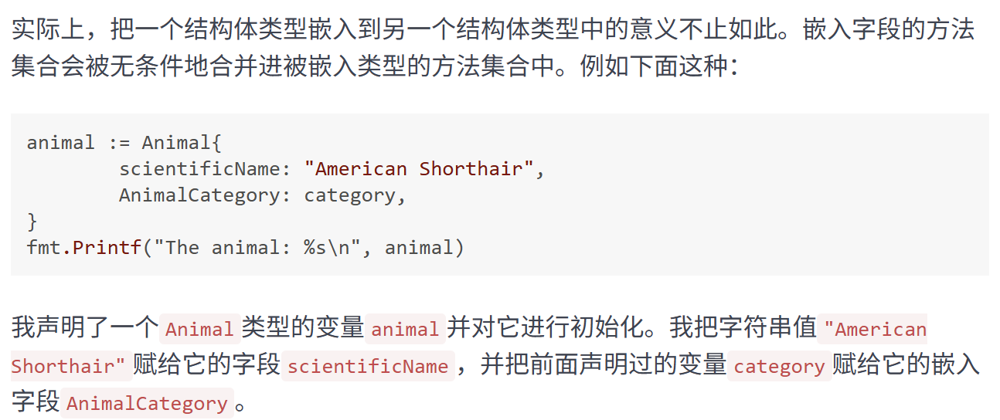
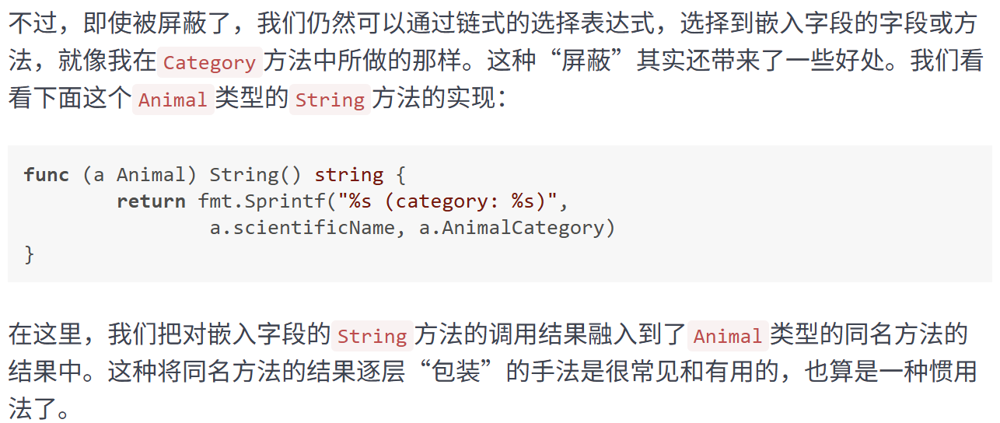

# 14 接口类型的合理运用

接口类型和其他数据类型不同，它无法被实例化。

我们不能通过调用new函数或make函数来创建出一个接口类型的值，也无法用字面量来表示一个接口类型的值。

接口类型的类型字面量与结构体类型的看起来有些相似，它们都用花括号包裹一些核心信息。只不过，结构体类型包裹的是它的字段声明，而接口类型包裹的是它的方法定义。

接口类型声明中的这些方法所代表的就是该接口的方法集合。一个接口的方法集合就是它的全部特征。

![image 1.png](<attachment:image 1.png>)

***Duck typing：***

一个对象的类型不是由它的显式声明决定，而是由它实际具备的 "行为"（方法 / 属性）决定。在支持鸭子类型的语言中，判断一个对象能否被使用，不看它是否属于特定类或实现了特定接口，只看它是否拥有所需的方法或属性。

**怎样判定一个数据类型的某一个方法实现的就是某个接口类型中的某个方法呢？**

这有两个充分必要条件，一个是“两个方法的签名需要完全一致”，另一个是“两个方法的名称要一模一样”。显然，这比判断一个函数是否实现了某个函数类型要更加严格一些。

我声明的类型`Dog`附带了3个方法。其中有2个值方法，分别是`Name`和`Category`，另外还有一个指针方法`SetName`。

这就意味着，`Dog`类型本身的方法集合中只包含了2个方法，也就是所有的值方法。而它的指针类型`*Dog`方法集合却包含了3个方法

也就是说，它拥有`Dog`类型附带的所有值方法和指针方法。又由于这3个方法恰恰分别是`Pet`接口中某个方法的实现，所以`*Dog`类型就成为了`Pet`接口的实现类型。

tips:这里我们主要要注意值方法和指针方法的区别，和是否实现了全部方法有关。这会影响接口类型相关的定义。

![image 2.png](<attachment:image 2.png>)

对于一个接口类型的变量来说，例如上面的变量`pet`，我们赋给它的值可以被叫做它的实际值（也称**动态值**），而该值的类型可以被叫做这个变量的实际类型（也称**动态类型**）。

比如，我们把取址表达式`&dog`的结果值赋给了变量`pet`，这时这个结果值就是变量`pet`的动态值，而此结果值的类型`*Dog`就是该变量的动态类型。

动态类型这个叫法是相对于**静态类型**而言的。对于变量`pet`来讲，它的**静态类型**就是`Pet`，并且永远是`Pet`，但是它的动态类型却会随着我们赋给它的动态值而变化。

比如，只有我把一个`*Dog`类型的值赋给变量`pet`之后，该变量的动态类型才会是`*Dog`。如果还有一个`Pet`接口的实现类型`*Fish`，并且我又把一个此类型的值赋给了`pet`，那么它的动态类型就会变为`*Fish`。
在赋予是一个接口类型变量实际的值之前，它的动态类型是不存在的。

# 怎样用好go语言中的接口：

**当我们为一个接口变量赋值时会发生什么？**

![image 3.png](<attachment:image 3.png>)

所以，我要问的具体问题是：在以上代码执行后，`pet`变量的字段`name`的值会是什么？

**这个题目的典型回答是**：`pet`变量的字段`name`的值依然是`"little pig"`。

**问题解析**：

首先，由于`dog`的`SetName`方法是指针方法，所以该方法持有的接收者就是指向`dog`的指针值的副本，因而其中对接收者的`name`字段的设置就是对变量`dog`的改动。那么当`dog.SetName("monster")`执行之后，`dog`的`name`字段的值就一定是`"monster"`。如果你理解到了这一层，那么请小心前方的陷阱。

为什么`dog`的`name`字段值变了，而`pet`的却没有呢？这里有一条通用的规则需要你知晓：如果我们使用一个变量给另外一个变量赋值，那么真正赋给后者的，并不是前者持有的那个值，而是该值的一个副本。

当你知道了这条通用规则之后，确实可以把前面那道题做对。不过，如果当我问你为什么的时候你只说出了这一个原因，那么，我只能说你仅仅答对了一半。

那么另一半是什么？这就需要从接口类型值的存储方式和结构说起了。我在前面说过，接口类型本身是无法被值化的。在我们赋予它实际的值之前，它的值一定会是`nil`，这也是它的零值。

反过来讲，一旦它被赋予了某个实现类型的值，它的值就不再是`nil`了。不过要注意，即使我们像前面那样把`dog`的值赋给了`pet`，`pet`的值与`dog`的值也是不同的。这不仅仅是副本与原值的那种不同。

当我们给一个接口变量赋值的时候，该变量的动态类型会与它的动态值一起被存储在一个专用的数据结构中。

严格来讲，这样一个变量的值其实是这个专用数据结构的一个实例，而不是我们赋给该变量的那个实际的值。所以我才说，`pet`的值与`dog`的值肯定是不同的，无论是从它们存储的内容，还是存储的结构上来看都是如此。不过，我们可以认为，这时`pet`的值中包含了`dog`值的副本。

我们就把这个专用的数据结构叫做`iface`吧，在Go语言的`runtime`包中它其实就叫这个名字。

`iface`的实例会包含两个指针，一个是指向类型信息的指针，另一个是指向动态值的指针。这里的类型信息是由另一个专用数据结构的实例承载的，其中包含了动态值的类型，以及使它实现了接口的方法和调用它们的途径，等等。

总之，接口变量被赋予动态值的时候，存储的是包含了这个动态值的副本的一个结构更加复杂的值。

### 知识扩展：

**问题 1：接口变量的值在什么情况下才真正为`nil`？**

![image 4.png](<attachment:image 4.png>)

虽然pet的动态值是nil但是动态类型不是nil。

也就是说，这时Go语言会识别出赋予`pet`的值是一个`*Dog`类型的`nil`。然后，Go语言就会用一个`iface`的实例包装它，包装后的产物肯定就不是`nil`了。

那么，怎样才能让一个接口变量的值真正为`nil`呢？要么只声明它但不做初始化，要么直接把字面量`nil`赋给它。

**怎样实现接口之间的组合？**

接口类型间的嵌入也被称为接口的组合。我在前面讲过结构体类型的嵌入字段，这其实就是在说结构体类型间的嵌入。

接口类型的嵌入会更简单一些，因为不会涉及方法间的”屏蔽“，只要组合的接口之间有同名方法就会产生冲突，因此无法通过编译，即使同名方法的签名彼此不同也会这样。

![image 5.png](<attachment:image 5.png>)

Go语言团队鼓励我们声明体量较小的接口，并建议我们通过这种接口间的组合来扩展程序、增加程序的灵活性。

这是因为相比于包含很多方法的大接口而言，小接口可以更加专注地表达某一种能力或某一类特征，同时也更容易被组合在一起。

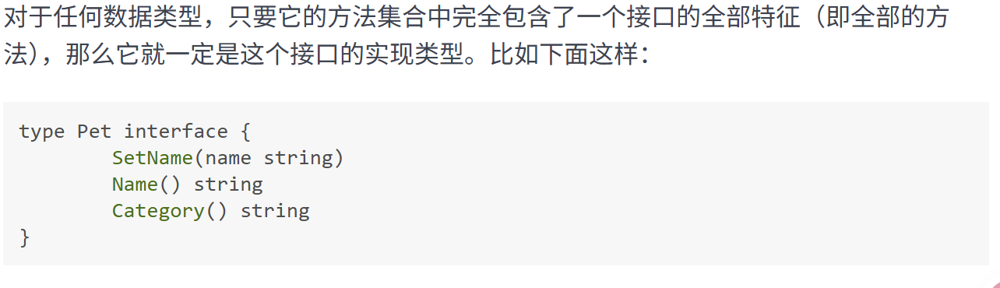

demo34中有体现接口组合优势的例子。

### 总结：

Go语言的接口常用于代表某种能力或某类特征。首先，我们要弄清楚的是，接口变量的动态值、动态类型和静态类型都代表了什么。这些都是正确使用接口变量的基础。当我们给接口变量赋值时，接口变量会持有被赋予值的副本，而不是它本身。

更重要的是，接口变量的值并不等同于这个可被称为动态值的副本。它会包含两个指针，一个指针指向动态值，一个指针指向类型信息。

基于此，即使我们把一个值为`nil`的某个实现类型的变量赋给了接口变量，后者的值也不可能是真正的`nil`。虽然这时它的动态值会为`nil`，但它的动态类型确是存在的。

请记住，除非我们只声明而不初始化，或者显式地赋给它`nil`，否则接口变量的值就不会为`nil`。

后面的一个问题相对轻松一些，它是关于程序设计方面的。用好小接口和接口组合总是有益的，我们可以以此形成接口矩阵，进而搭起灵活的程序框架。如果在实现接口时再配合运用结构体类型间的嵌入手法，那么接口组合就可以发挥更大的效用。

**思考题：**

如果我们把一个值为`nil`的某个实现类型的变量赋给了接口变量，那么在这个接口变量上仍然可以调用该接口的方法吗？如果可以，有哪些注意事项？如果不可以，原因是什么？

可以，注意使用过程中是否会访问nil指针，这会引发panic。
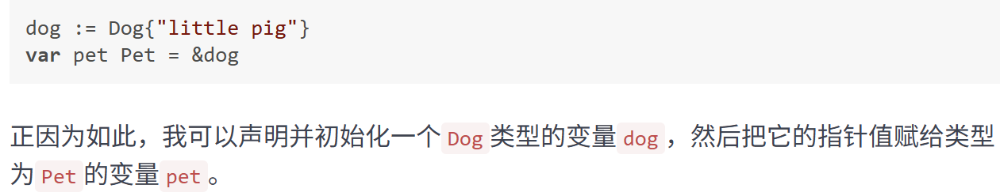
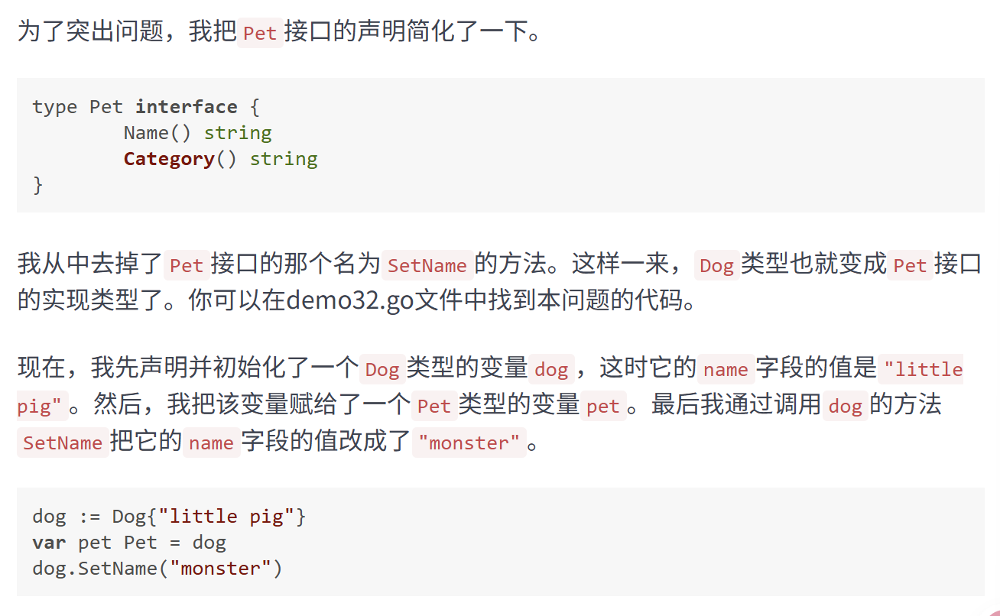
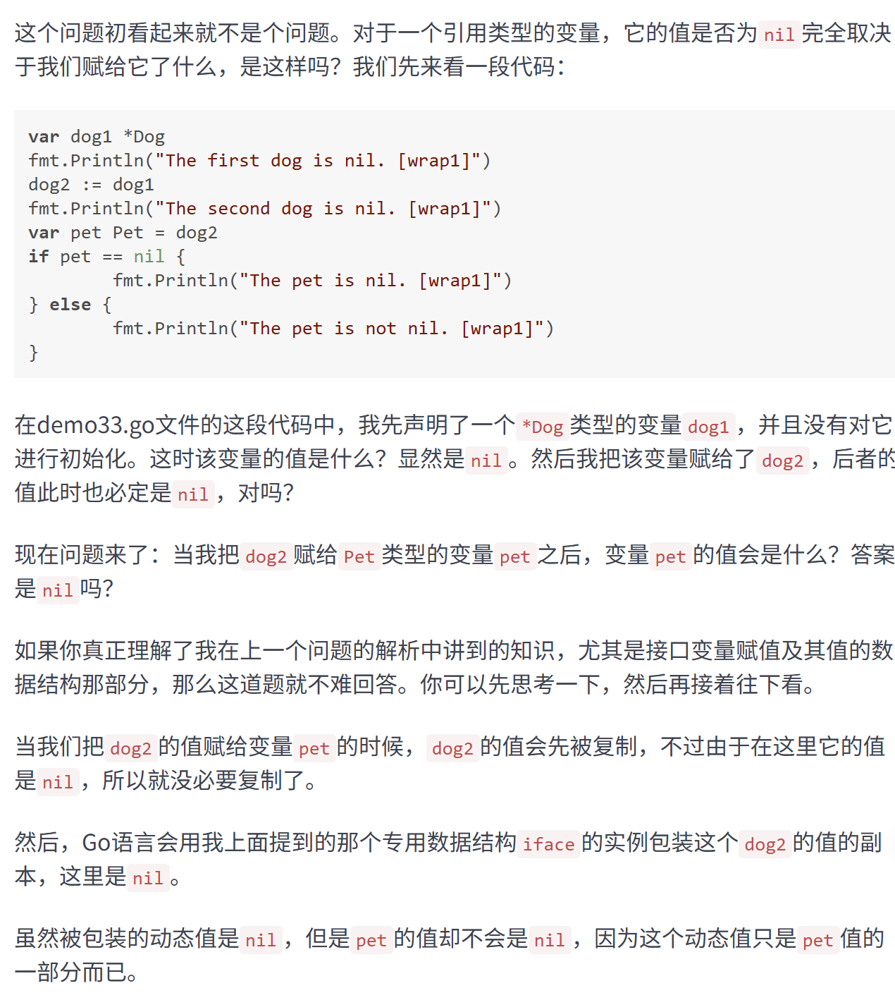
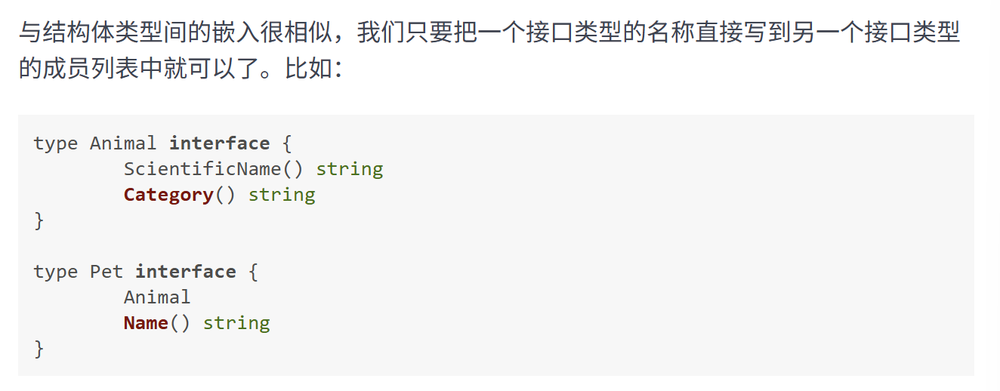
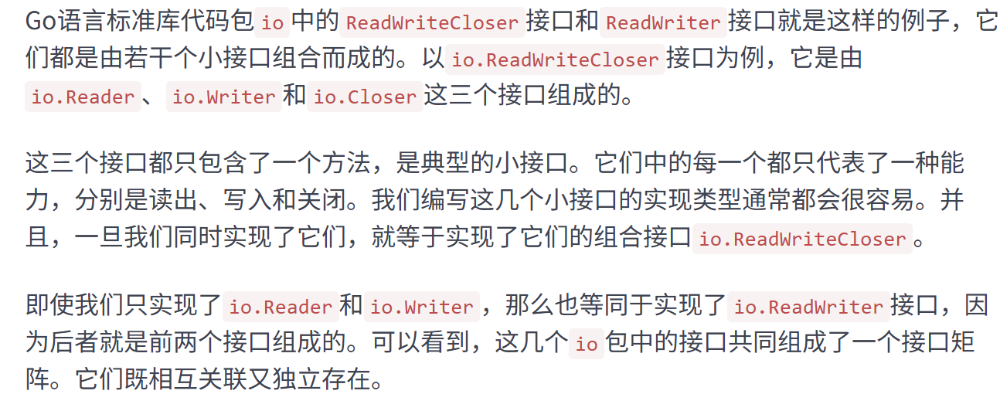

# 15 关于指针的有限操作

本节主要深入讲解关于指针相关的东西。

```go
type Dog struct {
	name string
}

func (dog *Dog) SetName(name string) {
	dog.name = name
}
```

对于基本类型`Dog`来说，`*Dog`就是它的指针类型。而对于一个`Dog`类型，值不为`nil`的变量`dog`，取址表达式`&dog`的结果就是该变量的值（也就是基本值）的指针值。

如果一个方法的接收者是`*Dog`类型的，那么该方法就是基本类型`Dog`的指针方法。

Go语言标准库中的unsafe包中有一个类型为Pointer也代表了指针。

`unsafe.Pointer`可以表示任何指向可寻址的值的指针，同时它也是前面提到的指针值和`uintptr`值之间的桥梁。也就是说，通过它，我们可以在这两种值之上进行双向的转换。这里有一个很关键的词——可寻址的（addressable）。在我们继续说`unsafe.Pointer`之前，需要先要搞清楚这个词的确切含义。

**你能列举出Go语言中的哪些值是不可寻址的吗？**

**这道题的典型回答是**以下列表中的值都是不可寻址的。

- 常量的值。
- 基本类型值的字面量。
- 算术操作的结果值。
- 对各种字面量的索引表达式和切片表达式的结果值。不过有一个例外，对切片字面量的索引结果值却是可寻址的。
- 对字符串变量的索引表达式和切片表达式的结果值。
- 对字典变量的索引表达式的结果值。
- 函数字面量和方法字面量，以及对它们的调用表达式的结果值。
- 结构体字面量的字段值，也就是对结构体字面量的选择表达式的结果值。
- 类型转换表达式的结果值。
- 类型断言表达式的结果值。
- 接收表达式的结果值。

常量的值总是会被存储到一个确切的内存区域中，并且这种值肯定是**不可变的**。基本类型值的字面量也是一样，其实它们本就可以被视为常量，只不过没有任何标识符可以代表它们罢了。

**第一个关键词：不可变的。**由于Go语言中的字符串值也是不可变的，所以对于一个字符串类型的变量来说，基于它的索引或切片的结果值也都是不可寻址的，因为即使拿到了这种值的内存地址也改变不了什么。

算术操作的结果值属于一种**临时结果**。在我们把这种结果值赋给任何变量或常量之前，即使能拿到它的内存地址也是没有任何意义的。

**第二个关键词：临时结果。**这个关键词能被用来解释很多现象。我们可以把各种对值字面量施加的表达式的求值结果都看做是临时结果。

Go语言中的表达式有很多种，其中常用的包括以下几种。

- 用于获得某个元素的索引表达式。
- 用于获得某个切片（片段）的切片表达式。
- 用于访问某个字段的选择表达式。
- 用于调用某个函数或方法的调用表达式。
- 用于转换值的类型的类型转换表达式。
- 用于判断值的类型的类型断言表达式。
- 向通道发送元素值或从通道那里接收元素值的接收表达式。

我们需要注意“临时结果”是不可寻址的。

其中有一个特例：对切片字面量的索引结果值是可寻址的。因为不论怎样，每个切片值都会持有一个底层数组，而这个底层数组中的每个元素值都是有一个确切的内存地址的。

你可能会问，那么对切片字面量的切片结果值为什么却是不可寻址的？这是因为切片表达式总会返回一个新的切片值，而这个新的切片值在被赋给变量之前属于临时结果。

针对数组值、切片值或字典值的**字面量**的表达式会产生临时结果。如果针对的是数组类型或切片类型的**变量**，那么索引或切片的结果值就都不属于临时结果了，是可寻址的。

变量的值本身就不是“临时的”，与此对比下的值字面量在还没有与任何变量绑定前是没有落脚点的，我们无法以任何方式引用它们。

对字典类型的变量施加索引表达式，得到的结果值不属于临时结果，可是，这样的值却是不可寻址的。原因是，字典中的每个键-元素对的存储位置都可能会变化，而且这种变化外界是无法感知的。

原因：

我们都知道，字典中总会有若干个哈希桶用于均匀地储存键-元素对。当满足一定条件时，字典可能会改变哈希桶的数量，并适时地把其中的键-元素对搬运到对应的新的哈希桶中。

在这种情况下，获取字典中任何元素值的指针都是无意义的，也是**不安全的**。我们不知道什么时候那个元素值会被搬运到何处，也不知道原先的那个内存地址上还会被存放什么别的东西。所以，这样的值就应该是不可寻址的。

**第三个关键词：不安全的。**“不安全的”操作很可能会破坏程序的一致性，引发不可预知的错误，从而严重影响程序的功能和稳定性。

函数不行的原因是1.函数是代码是不可变的，2.指向一段代码的指针是不安全的，3.对函数或者方法的调用结果值是临时结果。

小总结:

1. **不可变的**值不可寻址。常量、基本类型的值字面量、字符串变量的值、函数以及方法的字面量都是如此。其实这样规定也有安全性方面的考虑。
2. 绝大多数被视为**临时结果**的值都是不可寻址的。算术操作的结果值属于临时结果，针对值字面量的表达式结果值也属于临时结果。但有一个例外，对切片字面量的索引结果值虽然也属于临时结果，但却是可寻址的。
3. 若拿到某值的指针可能会破坏程序的一致性，那么就是**不安全的**，该值就不可寻址。由于字典的内部机制，对字典的索引结果值的取址操作都是不安全的。另外，获取由字面量或标识符代表的函数或方法的地址显然也是不安全的。

### 知识扩展：

**问题1：不可寻址的值在使用上有哪些限制？**

首先就是用&获取不了指针，

![image 1.png](<attachment:image 1.png>)

![image 2.png](<attachment:image 2.png>)

**问题 2：怎样通过`unsafe.Pointer`操纵可寻址的值？** 

`unsafe.Pointer`是像`*Dog`类型的值这样的指针值和`uintptr`值之间的桥梁，那么我们怎样利用`unsafe.Pointer`的中转和`uintptr`的底层操作来操纵像`dog`这样的值呢？

首先说明，这是一项黑科技。它可以绕过Go语言的编译器和其他工具的重重检查，并达到潜入内存修改数据的目的。这并不是一种正常的编程手段，使用它会很危险，很有可能造成安全隐患。

我们总是应该优先使用常规代码包中提供的API去编写程序，当然也可以把像`reflect`以及`go/ast`这样的代码包作为备选项。作为上层应用的开发者，请谨慎地使用`unsafe`包中的任何程序实体。、

```go
dog := Dog{"little pig"}
dogP := &dog
dogPtr := uintptr(unsafe.Pointer(dogP))
```

![image 3.png](<attachment:image 3.png>)

所以，对于指针值和`uintptr`类型值之间的转换，必须使用`unsafe.Pointer`类型的值作为中转。那么，我们把指针值转换成`uintptr`类型的值有什么意义吗？

![image 4.png](<attachment:image 4.png>)

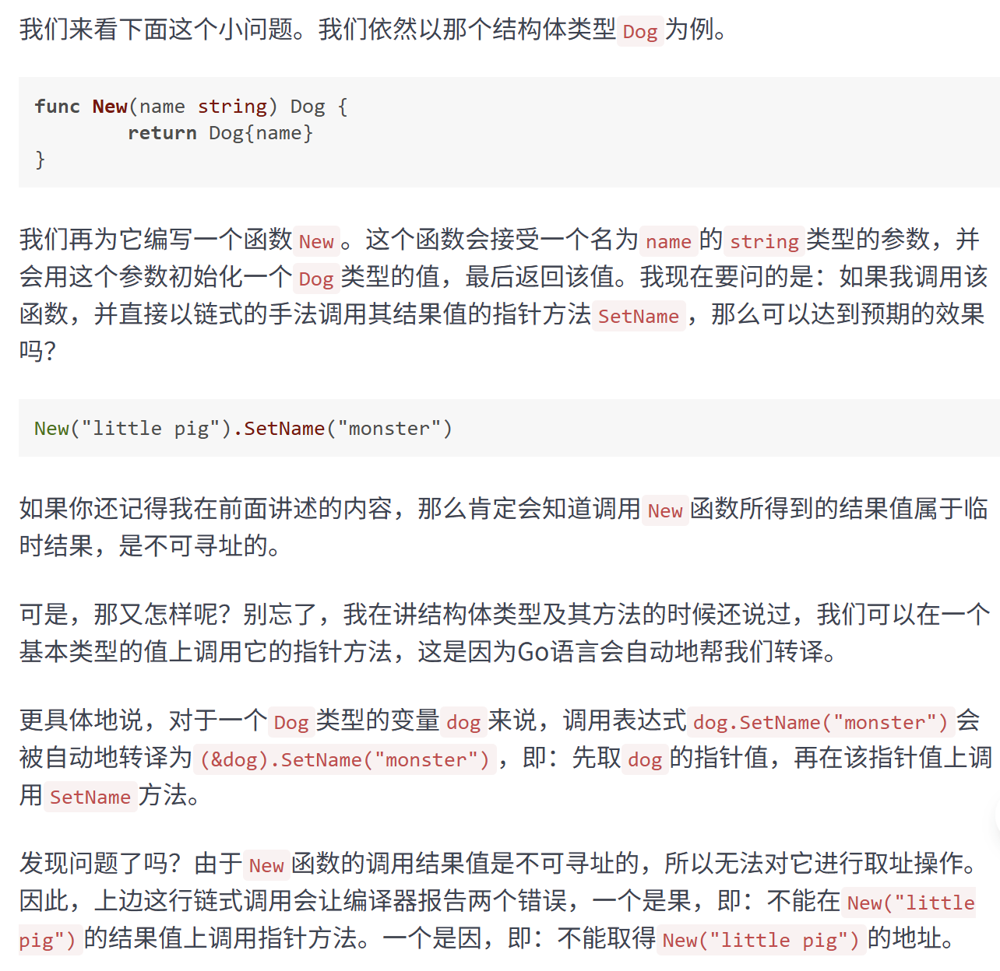

这种操作手法非常危险，我们在使用的时候需要谨慎。

### 总结：

我们今天集中说了说与指针有关的问题。基于基本类型的指针值应该是我们最常用到的，也是我们最需要关注的，比如`*Dog`类型的值。怎样得到一个这样的指针值呢？这需要用到取址操作和操作符`&`。

不过这里还有个前提，那就是取址操作的操作对象必须是可寻址的。关于这方面你需要记住三个关键词：不可变的、临时结果和不安全的。只要一个值符合了这三个关键词中的任何一个，它就是不可寻址的。

但有一个例外，对切片字面量的索引结果值是可寻址的。那么不可寻址的值在使用上有哪些限制呢？一个最重要的限制是关于指针方法的，即：无法调用一个不可寻址值的指针方法。这涉及了两个知识点的联合运用。

相比于刚说到的这些，`unsafe.Pointer`类型和`uintptr`类型的重要性好像就没那么高了。它们的值同样可以代表指针，并且比前面说的指针值更贴近于底层和内存。

虽然我们可以利用它们去访问或修改一些内部数据，而且就灵活性而言，这种要比通用的方式高很多，但是这往往也会带来不容小觑的安全隐患。

因此，在很多时候，使用它们操纵数据是弊大于利的。不过，对于硬币的背面，我们也总是有必要去了解的。

### 思考：

引用类型的值的指针值是有意义的吗？如果没有意义，为什么？如果有意义，意义在哪里？

有意义，我们可以通过这个指针值来修改对应的引用类型。也可以通过这个指针值来直接访问。
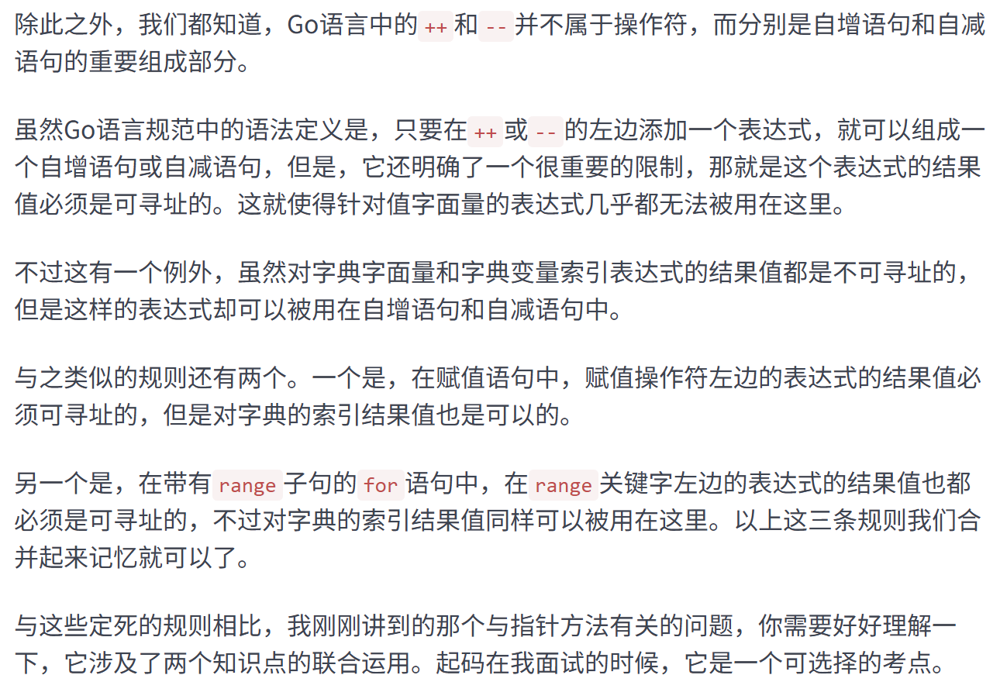
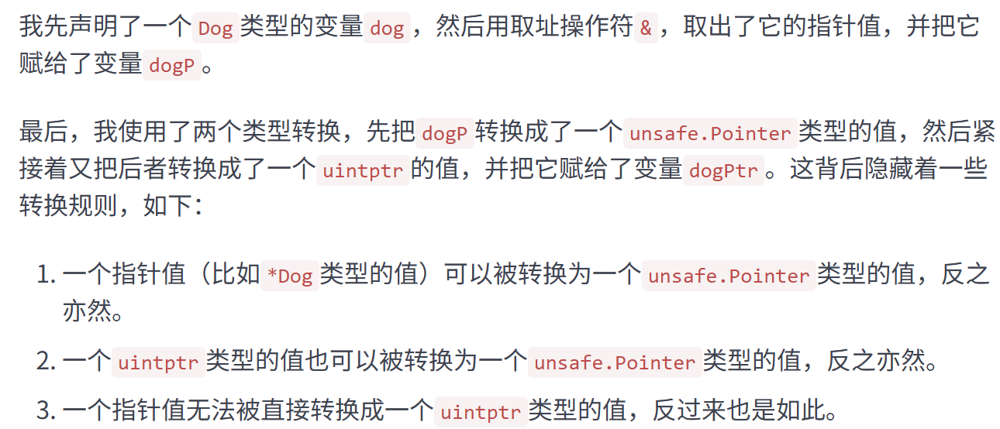
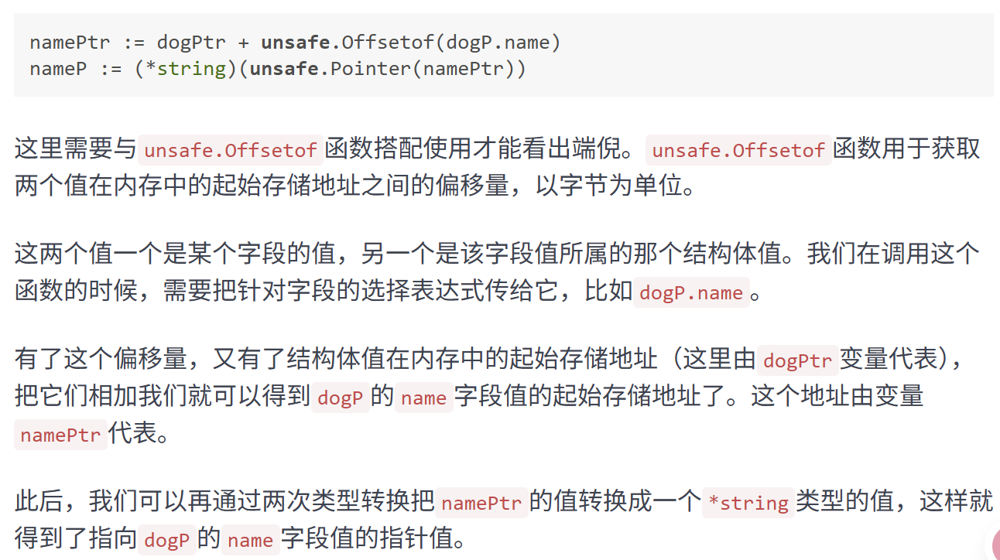
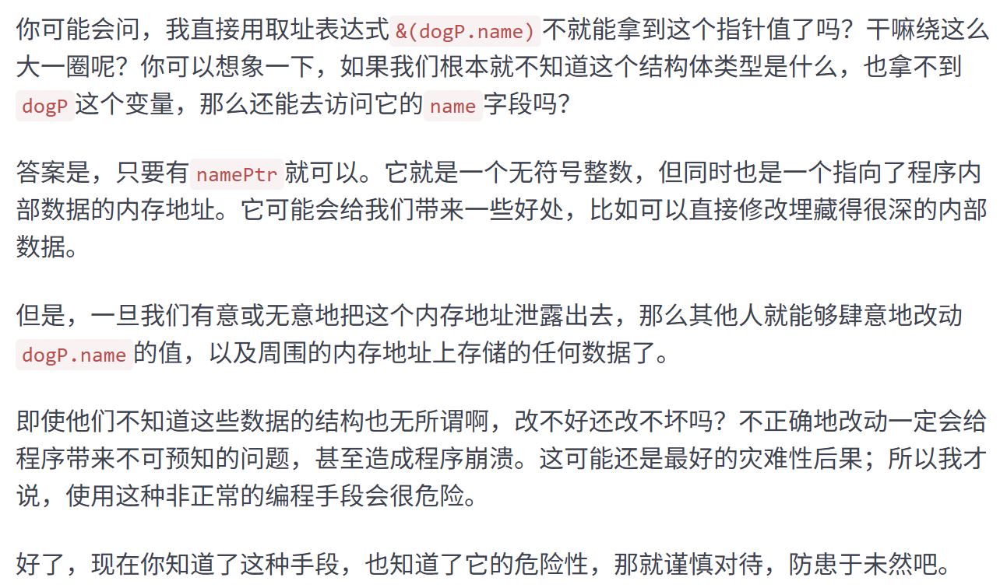

# 16 go语句及其执行规则-上

本节讨论go语句。

go名言：Don’t communicate by sharing memory; share memory by communicating.

这句话的实现是通过channel通道语句，以通讯的形式来共享数据。它在不同的goroutine之间传递数据。

### goroutine代表了什么

goroutine代表着并发编程模型中的用户级线程，操作系统本身提供了进程和线程，这两种并发执行程序的工具。

### 进程与线程：

**进程**，描述的就是程序的执行过程，是运行着的程序的代表。换句话说，一个进程其实就是某个程序运行时的一个产物。如果说静静地躺在那里的代码就是程序的话，那么奔跑着的、正在发挥着既有功能的代码就可以被称为进程。

电脑同时运行多个应用程序————操作系统上有多个代表不同应用程序的进程在运行。

**线程**，线程总是在进程之内，可以被视为进程中运行的控制流（或者说代码执行的流程）

一个进程至少会包含一个线程。如果一个进程只包含了一个线程，那么它里面的所有代码都只会被串行地执行。每个进程的第一个线程都会随着该进程的启动而被创建，它们可以被称为其所属进程的主线程。

相对应的，如果一个进程中包含了多个线程，那么其中的代码就可以被并发地执行。除了进程的第一个线程之外，其他的线程都是由进程中已存在的线程创建出来的。

也就是说，主线程之外的其他线程都只能由**代码显式地创建和销毁**。这需要我们在编写程序的时候进行手动控制，操作系统以及进程本身并不会帮我们下达这样的指令，它们只会忠实地执行我们的指令。

Go语言运行时系统会帮我们自动地创建和销毁系统级的线程。用户级线程指的是架设在系统级线程之上的，由用户（或者说我们编写的程序）完全控制的代码执行流程。用户级线程的创建、销毁、调度、状态变更以及其中的代码和数据都完全需要我们的程序自己去实现和处理。

**优势**：用户级线程不用操作系统去创建和销毁，所以速度会很快，很容易控制并能很灵活。

**劣势**：复杂！

如果我们只使用了系统级线程，那么我们只要指明需要新线程执行的代码片段，并且下达创建或销毁线程的指令就好了，其他的一切具体实现都会由操作系统代劳。

但是，如果使用用户级线程，我们就不得不既是指令下达者，又是指令执行者。我们必须全权负责与用户级线程有关的所有具体实现。

操作系统不但不会帮忙，还会要求我们的具体实现必须与它正确地对接，否则用户级线程就无法被并发地，甚至正确地运行。毕竟我们编写的所有代码最终都需要通过操作系统才能在计算机上执行。这听起来就很麻烦，不是吗？

**不过别担心，Go语言不但有着独特的并发编程模型，以及用户级线程goroutine，还拥有强大的用于调度goroutine、对接系统级线程的调度器。**

这个调度器是Go语言运行时系统的重要组成部分，它主要负责统筹调配Go并发编程模型中三个主要元素：G（goroutine的缩写）、P（processor的缩写）和M（machine的缩写）。

其中的M指代的就是系统级线程。而P指的是一种可以承载若干个G，且能够使这些G适时地与M进行对接，并得到真正运行的中介。

从宏观上说，G和M由于P的存在可以呈现出多对多的关系。当一个正在与某个M对接并运行着的G，需要因某个事件（比如等待I/O或锁的解除）而暂停运行的时候，调度器总会及时地发现，并把这个G与那个M分离开，以释放计算资源供那些等待运行的G使用。

而当一个G需要恢复运行的时候，调度器又会尽快地为它寻找空闲的计算资源（包括M）并安排运行。另外，当M不够用时，调度器会帮我们向操作系统申请新的系统级线程，而当某个M已无用时，调度器又会负责把它及时地销毁掉。

正因为调度器帮助我们做了很多事，所以我们的Go程序才总是能高效地利用操作系统和计算机资源。程序中的所有goroutine也都会被充分地调度，其中的代码也都会被并发地运行，即使这样的goroutine有数以十万计，也仍然可以如此。

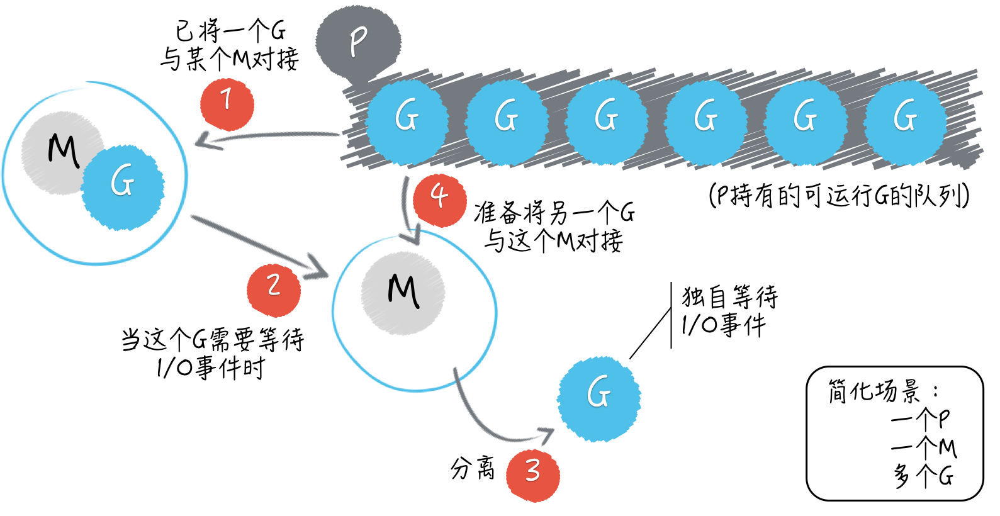

### go语句的执行规则，最佳实践和使用禁忌：

我们具体来看一道我在面试中经常提问的编程题。

```go
package main

import "fmt"

func main() {
	for i := 0; i < 10; i++ {
		go func() {
			fmt.Println(i)
		}()
	}
}
```

在demo38.go中，我只在`main`函数中写了一条`for`语句。这条`for`语句中的代码会迭代运行10次，并有一个局部变量`i`代表着当次迭代的序号，该序号是从`0`开始的。

在这条`for`语句中仅有一条`go`语句，这条`go`语句中也仅有一条语句。这条最里面的语句调用了`fmt.Println`函数并想要打印出变量`i`的值。

这个程序很简单，三条语句逐条嵌套。我的具体问题是：这个命令源码文件被执行后会打印出什么内容？

这道题的**典型回答**是：不会有任何内容被打印出来。

### 问题解析：

与一个进程总会有一个主线程类似，每一个独立的Go程序在运行时也总会有一个主goroutine。这个主goroutine会在Go程序的运行准备工作完成后被自动地启用，并不需要我们做任何手动的操作。

想必你已经知道，每条`go`语句一般都会携带一个函数调用，这个被调用的函数常常被称为`go`函数。而主goroutine的`go`函数就是那个作为程序入口的`main`函数。
一定要注意，`go`函数真正被执行的时间，总会与其所属的`go`语句被执行的时间不同。当程序执行到一条`go`语句的时候，Go语言的运行时系统，会先试图从某个存放空闲的G的队列中获取一个G（也就是goroutine），它只有在找不到空闲G的情况下才会去创建一个新的G。

在这里go语句的意思是：

```go
go 函数名(参数列表)
```

注意已存在的gorountine总是会被优先重复利用，并且创建一个G的成本非常低，在Go语言运行时系统内部就完全可以做到了。—个G就相当于为需要并发执行代码片段服务的上下文环境而已。

在拿到一个空闲的G后，go语言运行时候系统会用这个G去包装当前那个go函数，再把这个G追加到某个存放可运行的G队列中。

这种队列中G总是会按照先入先出的顺序，虽然很快但是耗时还是存在的。

因此，go函数的执行时间会明显滞后于它所属的go语句的执行时间。

注意我们这里的**明显滞后**是对于计算机的CPU时钟和Go程序来说的。

**请记住**只要go语句本身执行完毕，Go程序完全不会等待go函数的执行，它会立刻去执行后面的语句，这就是所谓的异步并发地执行。**“go 语句执行完”≠“go 函数执行完”。可以把go语句执行完看作一个启动信号。注意**此处的后面的语句指的是for语句中下一个迭代。

在我们这个demo38.go的案例中，for这个语句会很快执行完毕，当它执行完那十个包装类go函数的goroutine一般还没获得执行机会。

请注意，`go`函数中的那个对`fmt.Println`函数的调用是以`for`语句中的变量`i`作为参数的。你可以想象一下，如果当`for`语句执行完毕的时候，这些`go`函数都还没有执行，那么它们引用的变量`i`的值将会是什么？

它们都会是`10`，对吗？那么这道题的答案会是“打印出10个`10`”，是这样吗？

在确定最终的答案之前，你还需要知道一个与主goroutine有关的重要特性，即：一旦主goroutine中的代码（也就是`main`函数中的那些代码）执行完毕，当前的Go程序就会结束运行。

如此一来，如果在Go程序结束的那一刻，还有goroutine未得到运行机会，那么它们就真的没有运行机会了，它们中的代码也就不会被执行了。

严谨地讲，Go语言并不会去保证这些goroutine会以怎样的顺序运行。由于主goroutine会与我们手动启用的其他goroutine一起接受调度，又因为调度器很可能会在goroutine中的代码只执行了一部分的时候暂停，以期所有的goroutine有更公平的运行机会。

所以哪个goroutine先执行完、哪个goroutine后执行完往往是不可预知的，除非我们使用了某种Go语言提供的方式进行了人为干预。然而，在这段代码中，我们并没有进行任何人为干预。

那答案到底是什么呢？就demo38.go中如此简单的代码而言，绝大多数情况都会是“不会有任何内容被打印出来”。

### 总结：

今天，我描述了goroutine在操作系统的并发编程体系，以及在Go语言并发编程模型中的地位和作用。这些知识点会为你打下一个坚实的基础。

我还提到了Go语言内部的运行时系统和调度器，以及它们围绕着goroutine做的那些统筹调配和维护工作。这些内容中的每句话应该都会对你正确理解goroutine起到实质性的作用。你可以用这些知识去解释主问题中的那个程序在运行后为什么会产出那样的结果。

**思考题：**

用什么手段可以对goroutine的启用数量加以限制？

可以采取工作池模式，创建固定数量的worker goroutine，通过channel接收任务，间接限制总并发数。

示例代码：

```go
package main

import (
	"fmt"
	"sync"
	"time"
)

func worker(id int, jobs <-chan int, wg *sync.WaitGroup) {
	defer wg.Done()
	for job := range jobs {
		fmt.Printf("worker %d 处理任务 %d\n", id, job)
		time.Sleep(1 * time.Second) // 处理任务
	}
}

func main() {
	const numWorkers = 3    // 工作池大小（限制并发数）
	const numJobs = 10      // 总任务数
	jobs := make(chan int, numJobs)
	var wg sync.WaitGroup

	// 启动固定数量的worker
	for w := 1; w <= numWorkers; w++ {
		wg.Add(1)
		go worker(w, jobs, &wg)
	}

	// 发送所有任务到channel
	for j := 1; j <= numJobs; j++ {
		jobs <- j
	}
	close(jobs) // 关闭channel，告诉worker没有更多任务

	wg.Wait() // 等待所有worker完成
}

**main 函数： 扮演“老板”或“调度员”的角色。它负责创建任务，启动工人，并等待所有工作完成。

worker 函数： 扮演“工人”的角色。每个 worker 都是一个 goroutine，它会不断地从“任务队列”
中取出任务并执行。

jobs (channel)： 扮演“任务传送带”的角色。main 函数把任务放进这个 channel，worker 函数从
这个 channel 里取出任务。

wg (sync.WaitGroup)： 扮演“考勤系统”的角色。main 用它来等待所有 worker 都完成工作后才能
退出。**
关于这个示例代码的详细解释：


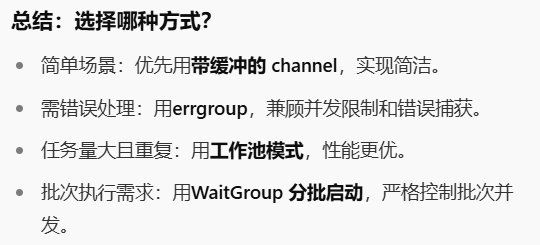

In [ ]:
func main() {
	const numWorkers = 3    // 定义“工人”的数量（并发上限）
	const numJobs = 10      // 定义总任务数
	
    // 1. 创建任务传送带 (channel)
    // 这个 'jobs' channel 用来在 main 和 worker 之间传递任务
    // 第二个参数 'numJobs' 是缓冲区大小，意味着 main 可以一口气把10个任务都放进去，而不用等 worker 来取。
	jobs := make(chan int, numJobs)
	
    // 2. 准备考勤系统 (WaitGroup)
	var wg sync.WaitGroup

	// 3. 雇佣工人
    // 启动 3 个 worker goroutine
	for w := 1; w <= numWorkers; w++ {
        // 每次启动一个 worker，就调用 wg.Add(1)，在“考勤系统”上+1，表示有一个工人开工了。
		wg.Add(1)
        // 'go' 关键字启动一个新的 goroutine
        // 每个 worker 都会拿到自己的 id，并共享同一个 'jobs' 传送带和 'wg' 考勤系统
		go worker(w, jobs, &wg)
	}

	// 4. 分配任务
    // 循环 10 次，把任务 1 到 10 依次放入 'jobs' 传送带
	for j := 1; j <= numJobs; j++ {
		jobs <- j
	}
    
    // 5. 关闭传送带
    // 重点！任务全都放完了，必须 close(jobs)。
    // 这会告诉所有 worker：“传送带上没新任务了，你们把自己手头的活干完就下班吧。”
	close(jobs) 

	// 6. 等待所有工人下班
    // wg.Wait() 会在这里阻塞（卡住），直到“考勤系统”的计数器变回 0。
	wg.Wait() 
} // main 函数结束，程序退出

// worker 是一个 goroutine
// 'jobs <-chan int' 表示 'jobs' 对 worker 来说是一个“只读”的 channel
func worker(id int, jobs <-chan int, wg *sync.WaitGroup) {
	
    // 1. 登记“下班”
    // 'defer' 关键字确保：无论这个函数怎么退出，在退出前都必须执行 wg.Done()
    // wg.Done() 会在“考勤系统”上 -1，表示“我(这个工人)下班了”。
	defer wg.Done()

    // 2. 开始工作循环
    // 'for job := range jobs' 是一个非常关键的循环：
    // - 它会不断从 'jobs' 传送带上取任务。
    // - 如果传送带是空的，它会在这里阻塞（等待），直到有新任务进来。
    // - 当 'jobs' 传送带被 'close()' 并且里面的任务全都被取完后，这个循环会自动结束。
	for job := range jobs {
        // 3. 处理任务
		fmt.Printf("worker %d 处理任务 %d\n", id, job)
		time.Sleep(1 * time.Second) // 模拟这个任务需要 1 秒钟
	}
    
    // 4. 下班
    // (当 for 循环结束后，worker 函数会退出，此时 defer wg.Done() 会被执行)
}
```

# 17 go语句及其执行规则-下

继续承接上文的goroutine在操作系统的并发编程体系。

### 知识扩展：

**问题1：怎样才能让主goroutine等待其他goroutine？**

最简单粗暴的方法就是让主goroutine“小睡”一会：

```go
for i := 0; i < 10;i++{
	go func() {
		fmt.Println(i)
		}()
	}
	time .Sleep(time.millisecond*500)
```

在这里的for语句后面，我们调用了time的sleep函数，并把time.millisecond*500的结果作为参数值传给了它。这个函数的作用就是让主goroutine暂停运行一段时间，直到我们预定的时间。

**这里有一个问题，我们该如何确定goroutine的休息时间呢，多了浪费时间，少了又没有运行完毕。**

我们能否让其他goroutine在运行完毕的时候告诉我们呢。

**能否使用通道来解决呢？**

我们先创建一个通道，它的长度应该和我们手动启用的goroutine的数量一致，每次手动启用的goroutine即将运行完毕的时候，我们都要向该通道发送一个值。

**注意，**这些发送表达式应该放在它们的go函数体的最后面，与之对应的我们还需要在main函数的最后从通道接收元素值，接收的次数也应该和手动启用的goroutine的数量保持一致。

其中有一个细节你需要注意。我在声明通道`sign`的时候是以`chan struct{}`作为其类型的。其中的类型字面量`struct{}`有些类似于空接口类型`interface{}`，它代表了既不包含任何字段也不拥有任何方法的空结构体类型。

注意，`struct{}`类型值的表示法只有一个，即：`struct{}{}`。并且，它占用的内存空间是`0`字节。确切地说，这个值在整个Go程序中永远都只会存在一份。虽然我们可以无数次地使用这个值字面量，但是用到的却都是同一个值。

当我们仅仅把通道当作传递某种简单信号的介质的时候，用`struct{}`作为其元素类型是再好不过的了。

**是否有更好的办法？**

标准库中的代码包**sync，其中的sync.WaitGroup**类型，具体使用方法在后面讲sync包的时候会被提及。

**问题二：怎样让我们启用的多个goroutine按照既定的顺序运行？**

首先，我们需要稍微改造一下`for`语句中的那个`go`函数，要让它接受一个`int`类型的参数，并在调用它的时候把变量`i`的值传进去。为了不改动这个`go`函数中的其他代码，我们可以把它的这个参数也命名为`i`。

```go
for i := 0; i < 10; i++ {
	go func(i int) {
		fmt.Println(i)
	}(i)
}
```

只有这样，Go语言才能保证每个goroutine都可以拿到一个唯一的整数。其原因与`go`函数的执行时机有关。

我在前面已经讲过了。在`go`语句被执行时，我们传给`go`函数的参数`i`会先被求值，如此就得到了当次迭代的序号。之后，无论`go`函数会在什么时候执行，这个参数值都不会变。也就是说，`go`函数中调用的`fmt.Println`函数打印的一定会是那个当次迭代的序号。

然后，我们在着手改造`for`语句中的`go`函数。

```go
for i := uint32(0); i < 10; i++ {
	go func(i uint32) {
		fn := func() {
			fmt.Println(i)
		}
		trigger(i, fn)
	}(i)
}
```

我在`go`函数中先声明了一个匿名的函数，并把它赋给了变量`fn`。这个匿名函数做的事情很简单，只是调用`fmt.Println`函数以打印`go`函数的参数`i`的值。

在这之后，我调用了一个名叫`trigger`的函数，并把`go`函数的参数`i`和刚刚声明的变量`fn`作为参数传给了它。注意，`for`语句声明的局部变量`i`和`go`函数的参数`i`的类型都变了，都由`int`变为了`uint32`。**之后会解释为什么。**

再来说`trigger`函数。该函数接受两个参数，一个是`uint32`类型的参数`i`, 另一个是`func()`类型的参数`fn`。你应该记得，`func()`代表的是既无参数声明也无结果声明的函数类型。

```go
trigger := func(i uint32, fn func()) {
	for {
		if n := atomic.LoadUint32(&count); n == i {
			fn()
			atomic.AddUint32(&count, 1)
			break
		}
		time.Sleep(time.Nanosecond)
	}
}
```

`trigger`函数会不断地获取一个名叫`count`的变量的值，并判断该值是否与参数`i`的值相同。如果相同，那么就立即调用`fn`代表的函数，然后把`count`变量的值加`1`，最后显式地退出当前的循环。否则，我们就先让当前的goroutine“睡眠”一个纳秒再进入下一个迭代。
操作变量`count`的时候使用的都是原子操作。这是由于`trigger`函数会被多个goroutine并发地调用，所以它用到的非本地变量`count`，就被多个用户级线程共用了。因此，对它的操作就产生了竞态条件（race condition），破坏了程序的并发安全性。

所以，我们总是应该对这样的操作加以保护，在`sync/atomic`包中声明了很多用于原子操作的函数。

另外，由于我选用的**原子操作函数对被操作的数值的类型有约束**，所以我才对`count`以及相关的变量和参数的类型进行了统一的变更（由`int`变为了`uint32`）。

纵观`count`变量、`trigger`函数以及改造后的`for`语句和`go`函数，我要做的是，让`count`变量成为一个信号，它的值总是下一个可以调用打印函数的`go`函数的序号。

这个序号其实就是启用goroutine时，那个当次迭代的序号。也正因为如此，`go`函数实际的执行顺序才会与`go`语句的执行顺序完全一致。此外，这里的`trigger`函数实现了一种自旋（spinning）。除非发现条件已满足，否则它会不断地进行检查。

最后要说的是，因为我依然想让主goroutine最后一个运行完毕，所以还需要加一行代码。不过既然有了`trigger`函数，我就没有再使用通道。

```go
trigger(10, func(){})
```

调用`trigger`函数完全可以达到相同的效果。由于当所有我手动启用的goroutine都运行完毕之后，`count`的值一定会是`10`，所以我就把`10`作为了第一个参数值。又由于我并不想打印这个`10`，所以我把一个什么都不做的函数作为了第二个参数值。

总之，通过上述的改造，我使得异步发起的`go`函数得到了同步地（或者说按照既定顺序地）执行，你也可以动手自己试一试，感受一下。

### 总结：

在本篇文章中，我们接着上一篇文章的主问题，讨论了当我们想让运行结果更加可控的时候，应该怎样去做。

主goroutine的运行若过早结束，那么我们的并发程序的功能就很可能无法全部完成。所以我们往往需要通过一些手段去进行干涉，比如调用`time.Sleep`函数或者使用通道。我们在后面的文章中还会讨论更高级的手段。

另外，`go`函数的实际执行顺序往往与其所属的`go`语句的执行顺序（或者说goroutine的启用顺序）不同，而且默认情况下的执行顺序是不可预知的。那怎样才能让这两个顺序一致呢？其实复杂的实现方式有不少，但是可能会把原来的代码改得面目全非。我在这里提供了一种比较简单、清晰的改造方案，供你参考。

总之，我希望通过上述基础知识以及三个连贯的问题帮你串起一条主线。这应该会让你更快地深入理解goroutine及其背后的并发编程模型，从而更加游刃有余地使用`go`语句。

思考题：

1.`runtime`包中提供了哪些与模型三要素G、P和M相关的函数？（模型三要素内容在上一篇）

### 1. 与 P (Processor) 相关的函数

**P** 是“逻辑处理器”，它代表了 Go 调度器中可以**真正并发执行 Go 代码的“槽位”**。

- **`runtime.GOMAXPROCS(n int) int`**
    - **这是最重要的一个函数！**
    - **作用：** 它可以**设置** `P` 的最大数量，并返回**上一个**设置值。
    - **G-P-M 关系：** 这个函数直接定义了 Go 调度器中 `P` 的数量。如果 `n=1`，那么 Go 程序在同一时刻**最多**只能有 1 个 `P` 在运行 `G`（即使你有 64 核 CPU），这会大大降低并发度。
    - **默认值：** 默认情况下，`P` 的数量等于你机器的 CPU 逻辑核心数。
- **`runtime.NumCPU() int`**
    - **作用：** 获取当前机器的 CPU **逻辑核心数**。
    - **G-P-M 关系：** 这个函数本身不直接操作 GPM，但它**总是**被用来作为 `runtime.GOMAXPROCS()` 的**推荐参数**。
    - **常见用法：** `runtime.GOMAXPROCS(runtime.NumCPU())`

---

### 2. 与 G (Goroutine) 相关的函数

**G** 就是 “Goroutine”，是我们用 `go` 关键字创建的执行单元。

- **`runtime.Gosched()`**
    - **作用：** “Goroutine Sched(ule)”，意思是“**让出**”。
    - **G-P-M 关系：** 当一个 `G` 调用了这个函数，它会**主动放弃**它当前占用的 `P`，允许调度器安排另一个在排队的 `G` 到这个 `P` 上运行。这个 `G` 自己会被放回到“全局G队列”中，等待下一次被调度。
    - **类比：** 就像你在排队，你主动说：“你先来”，然后你排到了队伍的最后面。
- **`runtime.NumGoroutine() int`**
    - **作用：** 获取当前程序中**所有 `G` 的总数量**（包括正在运行的、被阻塞的、休眠的等）。
    - **G-P-M 关系：** 这是一个“监控”函数，让你知道你一共创建了多少个 `G`。
- **`runtime.Goexit()`**
    - **作用：** **立即终止**当前正在执行的这个 `G`。
    - **G-P-M 关系：** 销毁一个 `G`。注意：`defer` 语句会正常执行，但这个 `G` 的生命就此结束了。

---

### 3. 与 M (Machine) 相关的函数

**M** 是 “Machine”，它代表一个**操作系统的线程（OS Thread）**。

- **`runtime.LockOSThread()`**
    - **作用：** “**锁定操作系统线程**”。
    - **G-P-M 关系：** 这是一个非常高级且**危险**的功能。它会把**当前的 `G`** 牢牢地**绑定**到它**当前的 `M`** 上。
    - **结果：** 无论这个 `G` 怎么被调度（比如它 `Gosched` 或者阻塞），当它下次恢复运行时，Go 调度器**必须**保证它在**同一个 `M`** 上运行。
    - **用途：** 只有在极少数情况下（比如你需要调用 C 语言写的、依赖“线程本地存储 (TLS)”的库，或者像 OpenGL 这样的图形库）才会用到。
- **`runtime.UnlockOSThread()`**
    - **作用：** 解除 `G` 和 `M` 之间的绑定。

# 18 if语句、for语句和switch语句

本节主要讲Go语言的基本流程控制语句，本节文章主要以一系列面试题为线索，来讲述这些语句的用法。

**今天的问题是：使用携带range子句的for语句时需要注意哪些细节？**

```go
numbers1 := []int{1, 2, 3, 4, 5, 6}
for i := range numbers1 {
	if i == 3 {
		numbers1[i] |= i
	}
}
fmt.Println(numbers1)
```

我先声明了一个元素类型为`int`的切片类型的变量`numbers1`，在该切片中有6个元素值，分别是从`1`到`6`的整数。我用一条携带`range`子句的`for`语句去迭代`numbers1`变量中的所有元素值。

在这条`for`语句中，只有一个迭代变量`i`。我在每次迭代时，都会先去判断`i`的值是否等于`3`，如果结果为`true`，那么就让`numbers1`的第`i`个元素值与`i`本身做**按位或**的操作，再把操作结果作为`numbers1`的新的第`i`个元素值。最后我会打印出`numbers1`的值。

所以具体的问题就是，这段代码执行后会打印出什么内容？

这里的**典型回答**是：打印的内容会是`[1 2 3 7 5 6]`。

**问题解析：**

让我们一起来复现一下这个计算过程。

当`for`语句被执行的时候，在`range`关键字右边的`numbers1`会先被求值。

这个位置上的代码被称为`range`表达式。`range`表达式的结果值可以是数组、数组的指针、切片、字符串、字典或者允许接收操作的通道中的某一个，并且结果值只能有一个。

对于不同种类的`range`表达式结果值，`for`语句的迭代变量的数量可以有所不同。

就拿我们这里的`numbers1`来说，它是一个切片，那么迭代变量就可以有两个，右边的迭代变量代表当次迭代对应的某一个元素值，而左边的迭代变量则代表该元素值在切片中的索引值。

那么，如果像本题代码中的`for`语句那样，只有一个迭代变量的情况意味着什么呢？这意味着，该迭代变量只会代表当次迭代对应的元素值的索引值。

更宽泛地讲，当只有一个迭代变量的时候，数组、数组的指针、切片和字符串的元素值都是无处安放的，我们只能拿到按照从小到大顺序给出的一个个索引值。

因此，这里的迭代变量`i`的值会依次是从`0`到`5`的整数。当`i`的值等于`3`的时候，与之对应的是切片中的第4个元素值`4`。对`4`和`3`进行按位或操作得到的结果是`7`。这就是答案中的第4个整数是`7`的原因了。

注意这里的操作是按位或，我们应该从每一位的角度来看。

**稍修改一下上面的代码。我们再来估算一下打印内容。**

```go
numbers2 := [...]int{1, 2, 3, 4, 5, 6}
maxIndex2 := len(numbers2) - 1
for i, e := range numbers2 {
	if i == maxIndex2 {
		numbers2[0] += e
	} else {
		numbers2[i+1] += e
	}
}
fmt.Println(numbers2)
```

返回的结果应该是12 3 5 7 9 11

注意，我把迭代的对象换成了`numbers2`。`numbers2`中的元素值同样是从`1`到`6`的6个整数，并且元素类型同样是`int`，但它是一个数组而不是一个切片。

在`for`语句中，我总是会对紧挨在当次迭代对应的元素后边的那个元素，进行重新赋值，新的值会是这两个元素的值之和。当迭代到最后一个元素时，我会把此`range`表达式结果值中的第一个元素值，替换为它的原值与最后一个元素值的和，最后，我会打印出`numbers2`的值。

**结果：**

好了，我要公布答案了。打印的内容会是`[7 3 5 7 9 11]`。我先来重现一下计算过程。当`for`语句被执行的时候，在`range`关键字右边的`numbers2`会先被求值。

这里需要注意两点：

1. `range`表达式只会在`for`语句开始执行时被求值一次，无论后边会有多少次迭代；
2. `range`表达式的求值结果会被复制，也就是说，被迭代的对象是`range`表达式结果值的副本而不是原值。以上这两点非常关键，就是因为这个的原因，所以numbers[0]所加的那个e是6而非11

基于这两个规则，我们接着往下看。在第一次迭代时，我改变的是`numbers2`的第二个元素的值，新值为`3`，也就是`1`和`2`之和。

但是，被迭代的对象的第二个元素却没有任何改变，毕竟它与`numbers2`已经是毫不相关的两个数组了。因此，在第二次迭代时，我会把`numbers2`的第三个元素的值修改为`5`，即被迭代对象的第二个元素值`2`和第三个元素值`3`的和。

以此类推，之后的`numbers2`的元素值依次会是`7`、`9`和`11`。当迭代到最后一个元素时，我会把`numbers2`的第一个元素的值修改为`1`和`6`之和。

好了，现在该你操刀了。你需要把`numbers2`的值由一个数组改成一个切片，其中的元素值都不要变。为了避免混淆，你还要把这个切片值赋给变量`numbers3`，并且把后边代码中所有的`numbers2`都改为`numbers3`。

问题是不变的，执行这段修改版的代码后打印的内容会是什么呢？如果你实在估算不出来，可以先实际执行一下，然后再尝试解释看到的答案。提示一下，切片与数组是不同的，前者是引用类型的，而后者是值类型的。

我们可以先接着讨论后边的内容，但是我强烈建议你一定要回来，再看看我留给你的这个问题，认真地思考和计算一下。

### 知识扩展：

**问题1：`switch`语句中的`switch`表达式和`case`表达式之间有着怎样的联系？**

```go
value1 := [...]int8{0, 1, 2, 3, 4, 5, 6}
switch 1 + 3 {
case value1[0], value1[1]:
	fmt.Println("0 or 1")
case value1[2], value1[3]:
	fmt.Println("2 or 3")
case value1[4], value1[5], value1[6]:
	fmt.Println("4 or 5 or 6")
}
```

只要`switch`表达式的结果值与某个`case`表达式中的任意一个子表达式的结果值相等，该`case`表达式所属的`case`子句就会被选中。

并且，一旦某个`case`子句被选中，其中的附带在`case`表达式后边的那些语句就会被执行。与此同时，其他的所有`case`子句都会被忽略。

当然了，如果被选中的`case`子句附带的语句列表中包含了`fallthrough`语句，那么紧挨在它下边的那个`case`子句附带的语句也会被执行。

正因为存在上述判断相等的操作（以下简称判等操作），`switch`语句对`switch`表达式的结果类型，以及各个`case`表达式中子表达式的结果类型都是有要求的。毕竟，在Go语言中，只有类型相同的值之间才有可能被允许进行判等操作。

如果`switch`表达式的结果值是无类型的常量，比如`1 + 3`的求值结果就是无类型的常量`4`，那么这个常量会被自动地转换为此种常量的默认类型的值，比如整数`4`的默认类型是`int`，又比如浮点数`3.14`的默认类型是`float64`。

因此，由于上述代码中的`switch`表达式的结果类型是`int`，而那些`case`表达式中子表达式的结果类型却是`int8`，它们的类型并不相同，所以这条`switch`语句是无法通过编译的。
**注意：**
`int` 是与平台相关的有符号整数（32 位或 64 位），适用于大多数场景；`int8` 是固定 8 位的有符号整数（范围 - 128~127），内存占用更小但范围有限，二者类型不同需显式转换。

```go
value2 := [...]int8{0, 1, 2, 3, 4, 5, 6}
switch value2[4] {
case 0, 1:
	fmt.Println("0 or 1")
case 2, 3:
	fmt.Println("2 or 3")
case 4, 5, 6:
	fmt.Println("4 or 5 or 6")
}
```

其中的变量`value2`与`value1`的值是完全相同的。但不同的是，我把`switch`表达式换成了`value2[4]`，并把下边那三个`case`表达式分别换为了`case 0, 1`、`case 2, 3`和`case 4, 5, 6`。

如此一来，`switch`表达式的结果值是`int8`类型的，而那些`case`表达式中子表达式的结果值却是无类型的常量了。这与之前的情况恰恰相反。那么，这样的`switch`语句可以通过编译吗？

答案是肯定的。因为，如果`case`表达式中子表达式的结果值是无类型的常量，那么它的类型会被自动地转换为`switch`表达式的结果类型，又由于上述那几个整数都可以被转换为`int8`类型的值，所以对这些表达式的结果值进行判等操作是没有问题的。

当然了，如果这里说的自动转换没能成功，那么`switch`语句照样通不过编译。

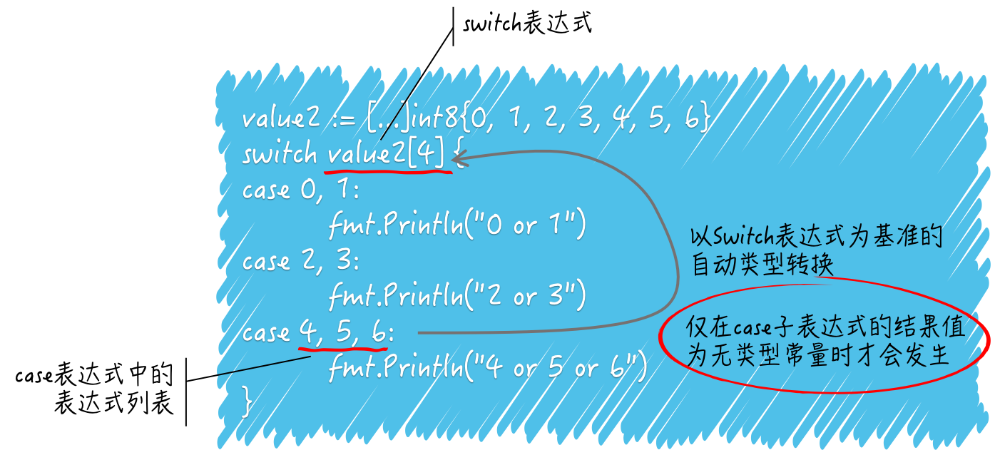

**注意这里仅在case子表达式的结果值为无类型常量时才会发生。**

`switch`语句会进行有限的类型转换，但肯定不能保证这种转换可以统一它们的类型。还要注意，如果这些表达式的结果类型有某个接口类型，那么一定要小心检查它们的动态值是否都具有可比性（或者说是否允许判等操作）。

因为，如果答案是否定的，虽然不会造成编译错误，但是后果会更加严重：引发panic（也就是运行时恐慌）。

**问题2：`switch`语句对它的`case`表达式有哪些约束？**

`switch`语句不允许`case`表达式中的子表达式结果值存在相等的情况，不论这些结果值相等的子表达式，是否存在于不同的`case`表达式中，都会是这样的结果。具体请看这段代码：

```go
value3 := [...]int8{0, 1, 2, 3, 4, 5, 6}
switch value3[4] {
case 0, 1, 2:
	fmt.Println("0 or 1 or 2")
case 2, 3, 4:
	fmt.Println("2 or 3 or 4")
case 4, 5, 6:
	fmt.Println("4 or 5 or 6")
}
```

变量`value3`的值同`value1`，依然是由从`0`到`6`的7个整数组成的数组，元素类型是`int8`。`switch`表达式是`value3[4]`，三个`case`表达式分别是`case 0, 1, 2`、`case 2, 3, 4`和`case 4, 5, 6`。

由于在这三个`case`表达式中存在结果值相等的子表达式，所以这个`switch`语句无法通过编译。不过，好在这个约束本身还有个约束，那就是只针对结果值为常量的子表达式。

比如，子表达式`1+1`和`2`不能同时出现，`1+3`和`4`也不能同时出现。有了这个约束的约束，我们就可以想办法绕过这个对子表达式的限制了。再看一段代码：

```go
value5 := [...]int8{0, 1, 2, 3, 4, 5, 6}
switch value5[4] {
case value5[0], value5[1], value5[2]:
	fmt.Println("0 or 1 or 2")
case value5[2], value5[3], value5[4]:
	fmt.Println("2 or 3 or 4")
case value5[4], value5[5], value5[6]:
	fmt.Println("4 or 5 or 6")
}
```

变量名换成了`value5`，但这不是重点。重点是，我把`case`表达式中的常量都换成了诸如`value5[0]`这样的索引表达式。

虽然第一个`case`表达式和第二个`case`表达式都包含了`value5[2]`，并且第二个`case`表达式和第三个`case`表达式都包含了`value5[4]`，但这已经不是问题了。这条`switch`语句可以成功通过编译。

不过，这种绕过方式对用于类型判断的`switch`语句（以下简称为类型`switch`语句）就无效了。因为类型`switch`语句中的`case`表达式的子表达式，都必须直接由类型字面量表示，而无法通过间接的方式表示。代码如下：

```go
value6 := interface{}(byte(127))
switch t := value6.(type) {
case uint8, uint16:
	fmt.Println("uint8 or uint16")
case byte:
	fmt.Printf("byte")
default:
	fmt.Printf("unsupported type: %T", t)
}
```

**变量`value6`的值是空接口类型的。该值包装了一个`byte`类型的值`127`。我在后面使用类型`switch`语句来判断`value6`的实际类型，并打印相应的内容。**

**这里有两个普通的`case`子句，还有一个`default case`子句。前者的`case`表达式分别是`case uint8, uint16`和`case byte`。你还记得吗？`byte`类型是`uint8`类型的别名类型。**

**因此，它们两个本质上是同一个类型，只是类型名称不同罢了。在这种情况下，这个类型`switch`语句是无法通过编译的，因为子表达式`byte`和`uint8`重复了。好了，以上说的就是`case`表达式的约束以及绕过方式，你学会了吗。**

## 总结：

我们今天主要讨论了`for`语句和`switch`语句，不过我并没有说明那些语法规则，因为它们太简单了。我们需要多加注意的往往是那些隐藏在Go语言规范和最佳实践里的细节。

这些细节其实就是我们很多技术初学者所谓的“坑”。比如，我在讲`for`语句的时候交代了携带`range`子句时只有一个迭代变量意味着什么。你必须知道在迭代数组或切片时只有一个迭代变量的话是无法迭代出其中的元素值的，否则你的程序可能就不会像你预期的那样运行了。

还有，`range`表达式的结果值是会被复制的，实际迭代时并不会使用原值。至于会影响到什么，那就要看这个结果值的类型是值类型还是引用类型了。

说到`switch`语句，你要明白其中的`case`表达式的所有子表达式的结果值都是要与`switch`表达式的结果值判等的，因此它们的类型必须相同或者能够都统一到`switch`表达式的结果类型。如果无法做到，那么这条`switch`语句就不能通过编译。

最后，同一条`switch`语句中的所有`case`表达式的子表达式的结果值不能重复，不过好在这只是对于由字面量直接表示的子表达式而言的。

请记住，普通`case`子句的编写顺序很重要，最上边的`case`子句中的子表达式总是会被最先求值，在判等的时候顺序也是这样。因此，如果某些子表达式的结果值有重复并且它们与`switch`表达式的结果值相等，那么位置靠上的`case`子句总会被选中。

**思考题**

1. 在类型`switch`语句中，我们怎样对被判断类型的那个值做相应的类型转换？

答：其实这个事情可以让Go语言自己来做，例如：

```go
switch t := x.(type) {
// cases
}

```

当流程进入到某个`case`子句的时候，变量`t`的值就已经被自动地转换为相应类型的值了。

当你写下 `switch t := x.(type)` 时，编译器会识别这是一个 “类型判断” 场景，而非普通的数值比较。它会将 `t` 与 `x` 的动态类型绑定 ——`t` 的类型会随着 `case` 匹配的类型动态变化。

对于每个 `case 类型:` 子句，编译器会在编译期验证该类型是否与 `x` 的静态类型（通常是 `interface{}`）兼容。当运行时匹配到某个 `case` 时，编译器会自动插入**类型断言逻辑**，将 `x` 转换为该 `case` 声明的类型，并赋值给 `t`。

1. 在`if`语句中，初始化子句声明的变量的作用域是什么？

答：如果这个变量是新的变量，那么它的作用域就是当前`if`语句所代表的代码块。注意，后续的`else if`子句和`else`子句也包含在当前的`if`语句代表的代码块之内。

# 19 错误处理-上

错误处理是我认为比较重要的一节，因为在某种程度上，只要错误处理预先措施做得够好，可以避免很多在开发过程中的致命bug。

我们声明过`error`类型的变量`err`，也调用过`errors`包中的`New`函数。今天，我会用这篇文章为你梳理Go语言错误处理的相关知识，同时提出一些关键问题并与你一起探讨。

我们说过`error`类型其实是一个接口类型，也是一个Go语言的内建类型。在这个接口类型的声明中只包含了一个方法`Error`。`Error`方法不接受任何参数，但是会返回一个`string`类型的结果。它的作用是返回错误信息的字符串表示形式。
我们使用`error`类型的方式通常是，在函数声明的结果列表的最后，声明一个该类型的结果，同时在调用这个函数之后，先判断它返回的最后一个结果值是否“不为`nil`”。

如果这个值“不为`nil`”，那么就进入错误处理流程，否则就继续进行正常的流程。下面是一个例子，代码在demo44.go文件中。

```go
package main

import (
	"errors"
	"fmt"
)

func echo(request string) (response string, err error) {
	if request == "" {
		err = errors.New("empty request")
		return
	}
	response = fmt.Sprintf("echo: %s", request)
	return
}

func main() {
	for _, req := range []string{"", "hello!"} {
		fmt.Printf("request: %s\n", req)
		resp, err := echo(req)
		if err != nil {
			fmt.Printf("error: %s\n", err)
			continue
		}
		fmt.Printf("response: %s\n", resp)
	}
}
```

我们先看`echo`函数的声明。`echo`函数接受一个`string`类型的参数`request`，并会返回两个结果。

这两个结果都是有名称的，第一个结果`response`也是`string`类型的，它代表了这个函数正常执行后的结果值。

第二个结果`err`就是`error`类型的，它代表了函数执行出错时的结果值，同时也包含了具体的错误信息。

当`echo`函数被调用时，它会先检查参数`request`的值。如果该值为空字符串，那么它就会通过调用`errors.New`函数，为结果`err`赋值，然后忽略掉后边的操作并直接返回。

此时，结果`response`的值也会是一个空字符串。如果`request`的值并不是空字符串，那么它就为结果`response`赋一个适当的值，然后返回，此时结果`err`的值会是`nil`。

再来看`main`函数中的代码。我在每次调用`echo`函数之后，都会把它返回的结果值赋给变量`resp`和`err`，并且总是先检查`err`的值是否“不为`nil`”，如果是，就打印错误信息，否则就打印常规的响应信息。

这里值得注意的地方有两个。第一，在`echo`函数和`main`函数中，我都使用到了卫述语句。我在前面讲函数用法的时候也提到过卫述语句。简单地讲，它就是被用来检查后续操作的前置条件并进行相应处理的语句。

对于`echo`函数来说，它进行常规操作的前提是：传入的参数值一定要符合要求。而对于调用`echo`函数的程序来说，进行后续操作的前提就是`echo`函数的执行不能出错。

我们在进行错误处理的时候经常会用到卫述语句，以至于有些人会吐槽说：“我的程序满屏都是卫述语句，简直是太难看了！”

不过，我倒认为这有可能是程序设计上的问题。每个编程语言的理念和风格几乎都会有明显的不同，我们常常需要顺应它们的纹理去做设计，而不是用其他语言的编程思想来编写当下语言的程序。

再来说第二个值得注意的地方。我在生成`error`类型值的时候，用到了`errors.New`函数。

这是一种最基本的生成错误值的方式。我们调用它的时候传入一个由字符串代表的错误信息，它会给返回给我们一个包含了这个错误信息的`error`类型值。该值的静态类型当然是`error`，而动态类型则是一个在`errors`包中的，包级私有的类型`*errorString`。

显然，`errorString`类型拥有的一个指针方法实现了`error`接口中的`Error`方法。这个方法在被调用后，会原封不动地返回我们之前传入的错误信息。实际上，`error`类型值的`Error`方法就相当于其他类型值的`String`方法。

我们已经知道，通过调用`fmt.Printf`函数，并给定占位符`%s`就可以打印出某个值的字符串表示形式。

对于其他类型的值来说，只要我们能为这个类型编写一个`String`方法，就可以自定义它的字符串表示形式。而对于`error`类型值，它的字符串表示形式则取决于它的`Error`方法。

在上述情况下，`fmt.Printf`函数如果发现被打印的值是一个`error`类型的值，那么就会去调用它的`Error`方法。`fmt`包中的这类打印函数其实都是这么做的。

顺便提一句，当我们想通过模板化的方式生成错误信息，并得到错误值时，可以使用`fmt.Errorf`函数。该函数所做的其实就是先调用`fmt.Sprintf`函数，得到确切的错误信息；再调用`errors.New`函数，得到包含该错误信息的`error`类型值，最后返回该值。

**问题是：对于具体错误的判断，Go语言中都有哪些惯用法？**

由于`error`是一个接口类型，所以即使同为`error`类型的错误值，它们的实际类型也可能不同。这个问题还可以换一种问法，即：怎样判断一个错误值具体代表的是哪一类错误？

这道题的**典型回答**是这样的：

1. 对于类型在已知范围内的一系列错误值，一般使用类型断言表达式或类型`switch`语句来判断；
2. 对于已有相应变量且类型相同的一系列错误值，一般直接使用判等操作来判断；
3. 对于没有相应变量且类型未知的一系列错误值，只能使用其错误信息的字符串表示形式来做判断。

**问题解析：**

如果你看过一些Go语言标准库的源代码，那么对这几种情况应该都不陌生。我下面分别对它们做个说明。

类型在已知范围内的错误值其实是最容易分辨的。就拿`os`包中的几个代表错误的类型`os.PathError`、`os.LinkError`、`os.SyscallError`和`os/exec.Error`来说，它们的指针类型都是`error`接口的实现类型，同时它们也都包含了一个名叫`Err`，类型为`error`接口类型的代表潜在错误的字段。

如果我们得到一个`error`类型值，并且知道该值的实际类型肯定是它们中的某一个，那么就可以用类型`switch`语句去做判断。例如：

```go
func underlyingError(err error) error {
	switch err := err.(type) {
	case *os.PathError:
		return err.Err
	case *os.LinkError:
		return err.Err
	case *os.SyscallError:
		return err.Err
	case *exec.Error:
		return err.Err
	}
	return err
}
```

函数`underlyingError`的作用是：获取和返回已知的操作系统相关错误的潜在错误值。其中的类型`switch`语句中有若干个`case`子句，分别对应了上述几个错误类型。当它们被选中时，都会把函数参数`err`的`Err`字段作为结果值返回。如果它们都未被选中，那么该函数就会直接把参数值作为结果返回，即放弃获取潜在错误值。

只要类型不同，我们就可以如此分辨。但是在错误值类型相同的情况下，这些手段就无能为力了。在Go语言的标准库中也有不少以相同方式创建的同类型的错误值。

我们还拿`os`包来说，其中不少的错误值都是通过调用`errors.New`函数来初始化的，比如：`os.ErrClosed`、`os.ErrInvalid`以及`os.ErrPermission`，等等。

注意，与前面讲到的那些错误类型不同，这几个都是已经定义好的、确切的错误值。`os`包中的代码有时候会把它们当做潜在错误值，封装进前面那些错误类型的值中。

如果我们在操作文件系统的时候得到了一个错误值，并且知道该值的潜在错误值肯定是上述值中的某一个，那么就可以用普通的`switch`语句去做判断，当然了，用`if`语句和判等操作符也是可以的。例如：

```go
printError := func(i int, err error) {
	if err == nil {
		fmt.Println("nil error")
		return
	}
	err = underlyingError(err)
	switch err {
	case os.ErrClosed:
		fmt.Printf("error(closed)[%d]: %s\n", i, err)
	case os.ErrInvalid:
		fmt.Printf("error(invalid)[%d]: %s\n", i, err)
	case os.ErrPermission:
		fmt.Printf("error(permission)[%d]: %s\n", i, err)
	}
}
```

这个由`printError`变量代表的函数会接受一个`error`类型的参数值。该值总会代表某个文件操作相关的错误，这是我故意地以不正确的方式操作文件后得到的。

虽然我不知道这些错误值的类型的范围，但却知道它们或它们的潜在错误值一定是某个已经在`os`包中定义的值。

所以，我先用`underlyingError`函数得到它们的潜在错误值，当然也可能只得到原错误值而已。然后，我用`switch`语句对错误值进行判等操作，三个`case`子句分别对应我刚刚提到的那三个已存在于`os`包中的错误值。如此一来，我就能分辨出具体错误了。

对于上面这两种情况，我们都有明确的方式去解决。但是，如果我们对一个错误值可能代表的含义知之甚少，那么就只能通过它拥有的错误信息去做判断了。

好在我们总是能通过错误值的`Error`方法，拿到它的错误信息。其实`os`包中就有做这种判断的函数，比如：`os.IsExist`、`os.IsNotExist`和`os.IsPermission`。命令源码文件demo45.go中包含了对它们的应用，这大致跟前面展示的代码差不太多，我就不在这里赘述了。

### 总结：

今天我们一起初步学习了错误处理的内容。我们总结了错误类型、错误值的处理技巧和设计方式，并一起分享了Go语言中处理错误的最基本方式。由于错误处理的内容分为上下两篇，在下一次的文章中，我们会站在建造者的角度，一起来探索一下：怎样根据实际情况给予恰当的错误值。

### 思考题：

请列举出你经常用到或者看到的3个错误类型，它们所在的错误类型体系都是怎样的？你能画出一棵树来描述它们吗？

代码敲太少了 连错误类型都不知道

# 20 错误处理-下

在19节中我们主要讨论的是从使用者的角度看“怎样处理好错误值”，在这一节中我们要站在建造者的角度来关心“怎样才能给予使用者恰当的错误值”

### 知识扩展：

**问题：怎样根据实际情况给予恰当的错误值？**

创建错误值体系的基本方式有两种：

1. 创建立体的错误类型体系
2. 创建扁平的错误值列表

先说错误类型体系。由于在Go语言中实现接口是非侵入式的，所以我们可以做得很灵活。比如，在标准库的`net`代码包中，有一个名为`Error`的接口类型。它算是内建接口类型`error`的一个扩展接口，因为`error`是`net.Error`的嵌入接口。

`net.Error`接口除了拥有`error`接口的`Error`方法之外，还有两个自己声明的方法：`Timeout`和`Temporary`。

`net`包中有很多错误类型都实现了`net.Error`接口，比如：

1. `net.OpError`；
2. `net.AddrError`；
3. `net.UnknownNetworkError`等等。

你可以把这些错误类型想象成一棵树，内建接口`error`就是树的根，而`net.Error`接口就是一个在根上延伸的第一级非叶子节点。

同时，你也可以把这看做是一种多层分类的手段。当`net`包的使用者拿到一个错误值的时候，可以先判断它是否是`net.Error`类型的，也就是说该值是否代表了一个网络相关的错误。

如果是，那么我们还可以再进一步判断它的类型是哪一个更具体的错误类型，这样就能知道这个网络相关的错误具体是由于操作不当引起的，还是因为网络地址问题引起的，又或是由于网络协议不正确引起的。

当我们细看`net`包中的这些具体错误类型的实现时，还会发现，与`os`包中的一些错误类型类似，它们也都有一个名为`Err`、类型为`error`接口类型的字段，代表的也是当前错误的潜在错误。

所以说，这些错误类型的值之间还可以有另外一种关系，即：链式关系。比如说，使用者调用`net.DialTCP`之类的函数时，`net`包中的代码可能会返回给他一个`*net.OpError`类型的错误值，以表示由于他的操作不当造成了一个错误。

同时，这些代码还可能会把一个`*net.AddrError`或`net.UnknownNetworkError`类型的值赋给该错误值的`Err`字段，以表明导致这个错误的潜在原因。如果，此处的潜在错误值的`Err`字段也有非`nil`的值，那么将会指明更深层次的错误原因。**如此一级又一级就像链条一样最终会指向问题的根源。**

把以上这些内容总结成一句话就是，用类型建立起树形结构的错误体系，用统一字段建立起可追根溯源的链式错误关联。这是Go语言标准库给予我们的优秀范本，非常有借鉴意义。

不过要注意，如果你不想让包外代码改动你返回的错误值的话，一定要**小写其中字段的名称首字母**。你可以通过暴露某些方法让包外代码有进一步获取错误信息的权限，比如编写一个可以返回包级私有的`err`字段值的公开方法`Err`。

### 扁平的错误值列表：

相比于立体的错误类型体系，扁平的错误值列表就要简单得多了。当我们只是想预先创建一些代表已知错误的错误值时候，用这种扁平化的方式就很恰当了。

不过，由于`error`是接口类型，所以通过`errors.New`函数生成的错误值只能被赋给变量，而不能赋给常量，又由于这些代表错误的变量需要给包外代码使用，所以其访问权限只能是**公开**的。

这就带来了一个问题，如果有恶意代码改变了这些公开变量的值，那么程序的功能就必然会受到影响。因为在这种情况下我们往往会通过**判等**操作来判断拿到的错误值具体是哪一个错误，如果这些公开变量的值被改变了，那么相应的判等操作的结果也会随之改变。

**此处有两个解决方案：**

1. 先私有化此类变量，也就是把他们的名称首字母小写，然后编写公开的用于获取错误值以及用于判等错误值的函数。

比如，对于错误值`os.ErrClosed`，先改写它的名称，让其变成`os.errClosed`，然后再编写`ErrClosed`函数和`IsErrClosed`函数。

当然了，这不是说让你去改动标准库中已有的代码，这样做的危害会很大，甚至是致命的。我只能说，对于你可控的代码，最好还是要尽量**收紧访问权限。**

1. 此方案存在于`syscall`包中。该包中有一个类型叫做`Errno`，该类型代表了系统调用时可能发生的底层错误。这个错误类型是`error`接口的实现类型，同时也是对内建类型`uintptr`的再定义类型。由于`uintptr`可以作为**常量**的类型，所以`syscall.Errno`自然也可以。`syscall`包中声明有大量的`Errno`类型的常量，每个常量都对应一种系统调用错误。`syscall`包外的代码可以拿到这些代表错误的常量，但却无法改变它们。我们可以仿照这种声明方式来构建我们自己的错误值列表，这样就可以保证错误值的只读特性了。好了，总之，扁平的错误值列表虽然相对简单，但是你一定要知道其中的隐患以及有效的解决方案是什么。

### 总结：

今天，我从两个视角为你总结了错误类型、错误值的处理技巧和设计方式。我们先一起看了一下Go语言中处理错误的最基本方式，这涉及了函数结果列表设计、`errors.New`函数、卫述语句以及使用打印函数输出错误值。

接下来，我提出的第一个问题是关于**错误判断**的。对于一个错误值来说，我们可以获取到**它的类型、值以及它携带的错误信息。**

如果我们可以确定**其类型范围或者值的范围**，那么就可以使用一些明确的手段获知具体的错误种类。否则，我们就只能通过匹配其携带的错误信息来大致区分它们的种类。

由于底层系统给予我们的错误信息还是很有规律可循的，所以用这种方式去判断效果还比较显著。但是第三方程序给出的错误信息很可能就没那么规整了，这种情况下靠错误信息去辨识种类就会比较困难。

有了以上阐释，当把视角从使用者换位到建造者，我们往往就会去自觉地仔细思考程序错误体系的设计了。我在这里提出了两个在Go语言标准库中使用很广泛的方案，即：**立体的错误类型体系和扁平的错误值列表。**

之所以说错误类型体系是立体的，是因为从整体上看它往往呈现出树形的结构。通过接口间的嵌套以及接口的实现，我们就可以构建出一棵错误类型树。

通过这棵树，使用者就可以一步步地确定错误值的种类了。另外，为了追根溯源的需要，我们还可以在错误类型中，统一安放一个可以代表潜在错误的字段。这叫做链式的错误关联，可以帮助使用者找到错误的根源。

相比之下，错误值列表就比较简单了。它其实就是**若干个名称不同但类型相同的错误值集合**。

不过需要注意的是，如果它们是公开的，那就应该尽量让它们成为常量而不是变量，或者编写私有的错误值以及公开的获取和判等函数，否则就很难避免恶意的篡改。

这其实是“最小化访问权限”这个程序设计原则的一个具体体现。无论怎样设计程序错误体系，我们都应该把这一点考虑在内。

**思考题**

请列举出你经常用到或者看到的3个错误值，它们分别在哪个错误值列表里？这些错误值列表分别包含的是哪个种类的错误？

不知道。

# 21 panic函数、recover函数以及defer语句 （上）

Go语言的另外一种错误处理方式————异常：在我们意料之外的程序异常

### 前导知识：运行时恐慌panic

这种程序异常被叫做panic，我把它翻译为运行时恐慌。其中的“恐慌”二字是由panic直译过来的，而之所以前面又加上了“运行时”三个字，是因为这种异常只会在程序运行的时候被抛出来。

我们举个具体的例子来看看。

比如说，一个Go程序里有一个切片，它的长度是5，也就是说该切片中的元素值的索引分别为`0`、`1`、`2`、`3`、`4`，但是，我在程序里却想通过索引`5`访问其中的元素值，显而易见，这样的访问是不正确的。

Go程序，确切地说是程序内嵌的Go语言运行时系统，会在执行到这行代码的时候抛出一个“**index out of range**”的panic，用以提示你索引越界了。

当然了，这不仅仅是个提示。当panic被抛出之后，**如果我们没有在程序里添加任何保护措施的话，程序（或者说代表它的那个进程）就会在打印出panic的详细情况**（以下简称panic详情）之后，终止运行。

现在，就让我们来看一下这样的panic详情中都有什么。

```go
panic: runtime error: index out of range

goroutine 1 [running]:
main.main()
 /Users/haolin/GeekTime/Golang_Puzzlers/src/puzzlers/article19/q0/demo47.go:5 +0x3d
exit status 2
```

这份详情的第一行是“panic: runtime error: index out of range”。其中的“runtime error”的含义是，这是一个`runtime`代码包中抛出的panic。在这个panic中，包含了一个`runtime.Error`接口类型的值。`runtime.Error`接口内嵌了`error`接口，并做了一点点扩展，`runtime`包中有不少它的实现类型。

实际上，此详情中的“panic：”右边的内容，正是这个panic包含的`runtime.Error`类型值的字符串表示形式。

此外，panic详情中，一般还会包含与它的引发原因有关的goroutine的代码执行信息。正如前述详情中的“goroutine 1 [running]”，它表示有一个ID为`1`的goroutine在此panic被引发的时候正在运行。

注意，这里的ID其实并不重要，因为它只是Go语言运行时系统内部给予的一个goroutine编号，我们在程序中是无法获取和更改的。

我们再看下一行，“main.main()”表明了这个goroutine包装的`go`函数就是命令源码文件中的那个`main`函数，也就是说这里的goroutine正是主goroutine。再下面的一行，指出的就是这个goroutine中的哪一行代码在此panic被引发时正在执行。

注意这里其实是在一步步为我们拆解这些报错的含义，千里之行始于足下。

这包含了此行代码在其所属的源码文件中的行数，以及这个源码文件的绝对路径。这一行最后的`+0x3d`代表的是：此行代码相对于其所属函数的入口程序计数偏移量。不过，一般情况下它的用处并不大。

最后，“exit status 2”表明我的这个程序是以退出状态码`2`结束运行的。在大多数操作系统中，只要退出状态码不是`0`，都意味着程序运行的非正常结束。在Go语言中，因panic导致程序结束运行的退出状态码一般都会是`2`。

综上所述，我们从上边的这个panic详情可以看出，作为此panic的引发根源的代码处于demo47.go文件中的第5行，同时被包含在`main`包（也就是命令源码文件所在的代码包）的`main`函数中。

那么，我的第一个问题也随之而来了。我今天的问题是：**从panic被引发到程序终止运行的大致过程是什么？**

**这道题的典型回答是这样的。**

我们先说一个大致的过程：某个函数中的某行代码有意或无意地引发了一个panic。这时，初始的panic详情会被**建立**起来，并且该程序的控制权会立即**从此行代码转移至调用其所属函数的那行代码上**，也就是**调用栈中的上一级**。

这也意味着，此行代码所属函数的执行**随即终止**。紧接着，控制权并**不会**在此有片刻的停留，它又会立即转移至再上一级的调用代码处。**控制权如此一级一级地沿着调用栈的反方向传播至顶端，也就是我们编写的最外层函数那里。**

这里的最外层函数指的是`go`函数，对于主goroutine来说就是`main`函数。但是控制权也不会停留在那里，而是被**Go语言运行时系统收回**。

随后，程序崩溃并终止运行，承载程序这次运行的**进程也会随之死亡并消失**。与此同时，在这个控制权传播的过程中，panic详情会被逐渐地积累和完善，并会在程序终止之前被打印出来。

### 问题解析：

panic可能是我们在无意间（或者说一不小心）引发的，如前文所述的索引越界。这类panic是真正的、在我们意料之外的程序异常。不过，除此之外，我们还是可以有意地引发panic。

Go语言的内建函数`panic`是专门用于引发panic的。`panic`函数使程序开发者可以在程序运行期间报告异常。

注意，这与从函数返回错误值的意义是完全不同的。当我们的函数返回一个非`nil`的错误值时，**函数的调用方有权选择不处理，并且不处理的后果往往是不致命的**。

这里的“不致命”的意思是，不至于使程序无法提供任何功能（也可以说僵死）或者直接崩溃并终止运行（也就是真死）。

但是，当一个panic发生时，如果我们不施加任何保护措施，那么导致的直接后果就是**程序崩溃**，就像前面描述的那样，这显然是致命的。

为了更清楚地展示答案中描述的过程，我编写了demo48.go文件。你可以先查看一下其中的代码，再试着运行它，并体会它打印的内容所代表的含义。

我在这里再提示一点。panic详情会在控制权传播的过程中，被逐渐地积累和完善，并且，控制权会一级一级地沿着调用栈的反方向传播至顶端。

因此，在针对某个goroutine的代码执行信息中，调用栈底端的信息会先出现，然后是上一级调用的信息，以此类推，最后才是此调用栈顶端的信息。

比如，`main`函数调用了`caller1`函数，而`caller1`函数又调用了`caller2`函数，那么`caller2`函数中代码的执行信息会先出现，然后是`caller1`函数中代码的执行信息，最后才是`main`函数的信息。

```go
goroutine 1 [running]:
main.caller2()
 /Users/haolin/GeekTime/Golang_Puzzlers/src/puzzlers/article19/q1/demo48.go:22 +0x91
main.caller1()
 /Users/haolin/GeekTime/Golang_Puzzlers/src/puzzlers/article19/q1/demo48.go:15 +0x66
main.main()
 /Users/haolin/GeekTime/Golang_Puzzlers/src/puzzlers/article19/q1/demo48.go:9 +0x66
exit status 2
```

感觉可以理解为从下往上传播回去，同时在传播的过程中错误信息也在累计。

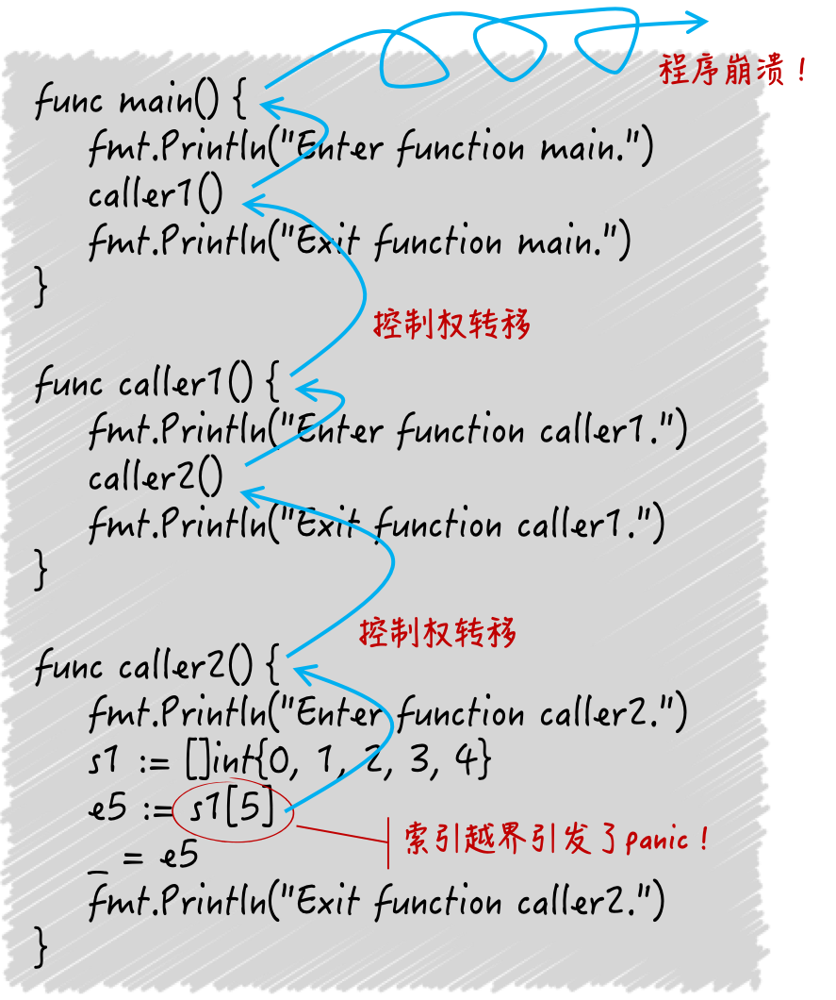

（从panic到程序崩溃）

好了，到这里，我相信你已经对panic被引发后的程序终止过程有一定的了解了。深入地了解此过程，以及正确地解读panic详情应该是我们的必备技能，这在调试Go程序或者为Go程序排查错误的时候非常重要。

### 总结：

最近的两篇文章，我们是围绕着panic函数、recover函数以及defer语句进行的。今天我主要讲了panic函数。这个函数是专门被用来引发panic的。panic也可以被称为运行时恐慌，它是一种只能在程序运行期间抛出的程序异常。

Go语言的运行时系统可能会在程序出现严重错误时自动地抛出panic，我们在需要时也可以通过调用`panic`函数引发panic。但不论怎样，如果不加以处理，panic就会导致程序崩溃并终止运行。

**思考题**

一个函数怎样才能把panic转化为`error`类型值，并将其作为函数的结果值返回给调用方？

在 Go 语言中，可以使用 `recover()` 函数在 defer 语句中捕获 panic，然后将其转换为 error 类型返回。这种模式通常用于将可能发生 panic 的操作封装起来，以更可控的方式处理错误。

具体实现方法如下：

1. 在函数中使用 `defer` 语句注册一个延迟执行的匿名函数
2. 在匿名函数中使用 `recover()` 捕获可能发生的 panic
3. 如果捕获到 panic，将其转换为 error 类型并赋值给函数的 error 返回值
4. 函数返回时就可以将这个 error 传递给调用方

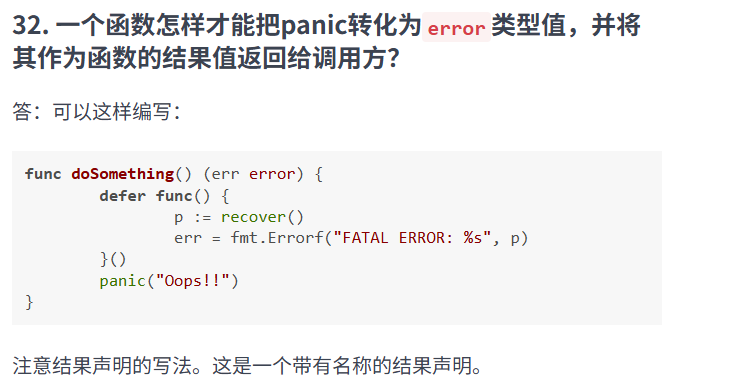

### **1. `defer` 的作用**

`defer` 是 Go 语言的关键字，用于**延迟执行**其后的函数调用。被 `defer` 修饰的函数会在**当前函数（这里是 `doSomething`）执行完毕前**（无论正常返回还是因 `panic` 终止）被调用。

在这段代码中，`defer func(){...}()` 定义了一个匿名函数，并通过 `defer` 延迟执行。它的目的是**在 `doSomething` 函数的逻辑执行完毕后，执行捕获 `panic` 并转换为 `error` 的逻辑**。

### **2. `recover()` 的作用**

`recover()` 是 Go 语言的内置函数，专门用于**捕获 `panic`**。它的行为有两个关键特点：

- 如果当前 Goroutine 没有发生 `panic`，`recover()` 返回 `nil`；
- 如果当前 Goroutine 发生了 `panic`，`recover()` 会 “**恢复**” 程序执行，并返回 `panic` 的值（即触发 `panic` 时传入的参数，这里是 `"Oops!!"`）。

在这段代码中，`p := recover()` 用于捕获 `panic` 的值，然后通过 `err = fmt.Errorf("FATAL ERROR: %s", p)` 将其转换为 `error` 类型，最终作为函数结果返回给调用方。

# 22 panic函数、recover函数以及defer语句（下）